In [1574]:
import numpy as np
import pandas as pd
import datetime
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors
import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
#from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt, numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import ListedColormap
from sklearn import metrics
import warnings
warnings.filterwarnings('ignore')
from autoviz.AutoViz_Class import AutoViz_Class

from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import Birch
from sklearn.cluster import DBSCAN
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import MeanShift
from sklearn.cluster import SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score


In [1211]:
%matplotlib inline


In [1212]:
df=pd.read_csv("marketing_campaign.csv",sep="\t")

In [1213]:
df.head(2)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0


In [1214]:
df.shape

(2240, 29)

In [1215]:
df.ndim

2

In [1216]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [1217]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [1218]:
df.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [1219]:
#df.memory_usage()

In [1220]:
df.duplicated().any()

False

In [1221]:
#df.value_counts() fonksiyonu, NaN (eksik) değerleri hesaba katmaz.
df.value_counts().sum()

2216

In [1222]:
df.value_counts(dropna=False).sum()

2240

In [1223]:
df.shape

(2240, 29)

In [1224]:
df.dtypes

ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
dtype: object

In [1225]:
df[df.columns].nunique()

ID                     2240
Year_Birth               59
Education                 5
Marital_Status            8
Income                 1974
Kidhome                   3
Teenhome                  3
Dt_Customer             663
Recency                 100
MntWines                776
MntFruits               158
MntMeatProducts         558
MntFishProducts         182
MntSweetProducts        177
MntGoldProds            213
NumDealsPurchases        15
NumWebPurchases          15
NumCatalogPurchases      14
NumStorePurchases        14
NumWebVisitsMonth        16
AcceptedCmp3              2
AcceptedCmp4              2
AcceptedCmp5              2
AcceptedCmp1              2
AcceptedCmp2              2
Complain                  2
Z_CostContact             1
Z_Revenue                 1
Response                  2
dtype: int64

In [1226]:
df.drop(columns=["ID"],inplace=True)

In [1227]:
num_col=df.select_dtypes(["float","int"])
num_col.drop(["Z_CostContact","Z_Revenue"],axis=1,inplace=True)
num_col.describe()

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
count,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,0.149107
std,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.356274
min,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [1228]:
#num_col.mean()
#num_col.max()
#num_col.median(skipna=True)
#num_col.std()

In [1229]:
df=df.drop(columns=["Z_CostContact", "Z_Revenue"],axis=1)
df.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0


In [1230]:
#outlier deteced function

In [1231]:
num_df=df.select_dtypes(include=["number"])

In [1232]:
num_df.skew()

Year_Birth             -0.349944
Income                  6.763487
Kidhome                 0.635288
Teenhome                0.407115
Recency                -0.001987
MntWines                1.175771
MntFruits               2.102063
MntMeatProducts         2.083233
MntFishProducts         1.919769
MntSweetProducts        2.136081
MntGoldProds            1.886106
NumDealsPurchases       2.418569
NumWebPurchases         1.382794
NumCatalogPurchases     1.880989
NumStorePurchases       0.702237
NumWebVisitsMonth       0.207926
AcceptedCmp3            3.291705
AcceptedCmp4            3.241574
AcceptedCmp5            3.291705
AcceptedCmp1            3.555444
AcceptedCmp2            8.472093
Complain               10.188972
Response                1.971555
dtype: float64

In [1233]:
df

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2236,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0
2237,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2238,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


In [1234]:
num_col.corr()

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
Year_Birth,1.000000,-0.161791,0.230176,-0.352111,-0.019871,-0.157773,-0.017917,-0.030872,-0.041625,-0.018133,-0.061818,-0.060846,-0.145040,-0.121275,-0.128272,0.121139,0.061774,-0.060510,0.007123,-0.005930,-0.006539,-0.030128,0.021325
Income,-0.161791,1.000000,-0.428669,0.019133,-0.003970,0.578650,0.430842,0.584633,0.438871,0.440744,0.325916,-0.083101,0.387878,0.589162,0.529362,-0.553088,-0.016174,0.184400,0.335943,0.276820,0.087545,-0.027225,0.133047
Kidhome,0.230176,-0.428669,1.000000,-0.036133,0.008827,-0.496297,-0.372581,-0.437129,-0.387644,-0.370673,-0.349595,0.221798,-0.361647,-0.502237,-0.499683,0.447846,0.014674,-0.161600,-0.205634,-0.172339,-0.081716,0.040207,-0.080008
Teenhome,-0.352111,0.019133,-0.036133,1.000000,0.016198,0.004846,-0.176764,-0.261160,-0.204187,-0.162475,-0.021725,0.387741,0.155500,-0.110769,0.050695,0.134884,-0.042677,0.038886,-0.191050,-0.140090,-0.015605,0.003138,-0.154446
Recency,-0.019871,-0.003970,0.008827,0.016198,1.000000,0.016064,-0.004306,0.023056,0.001079,0.022670,0.016693,-0.001098,-0.010726,0.025110,0.000799,-0.021445,-0.032991,0.018826,0.000129,-0.019283,-0.001781,0.013231,-0.198437
MntWines,-0.157773,0.578650,-0.496297,0.004846,0.016064,1.000000,0.389637,0.562667,0.399753,0.386581,0.387516,0.010940,0.542265,0.635226,0.642100,-0.320653,0.062202,0.373286,0.472613,0.354133,0.205907,-0.039007,0.247254
MntFruits,-0.017917,0.430842,-0.372581,-0.176764,-0.004306,0.389637,1.000000,0.543105,0.594804,0.567164,0.392995,-0.132114,0.296735,0.487917,0.461758,-0.418383,0.014727,0.010152,0.215833,0.194748,-0.009773,-0.005166,0.125289
MntMeatProducts,-0.030872,0.584633,-0.437129,-0.261160,0.023056,0.562667,0.543105,1.000000,0.568402,0.523846,0.350609,-0.122415,0.293761,0.723827,0.479659,-0.539470,0.018272,0.102912,0.373769,0.309761,0.043033,-0.023483,0.236335
MntFishProducts,-0.041625,0.438871,-0.387644,-0.204187,0.001079,0.399753,0.594804,0.568402,1.000000,0.579870,0.422875,-0.139361,0.293681,0.534478,0.459855,-0.446003,0.000357,0.016843,0.199578,0.260762,0.002577,-0.020953,0.111331
MntSweetProducts,-0.018133,0.440744,-0.370673,-0.162475,0.022670,0.386581,0.567164,0.523846,0.579870,1.000000,0.369724,-0.120100,0.348544,0.490924,0.448756,-0.423294,0.001530,0.028641,0.259590,0.241818,0.009985,-0.022485,0.117372


In [1235]:
df.dropna(inplace = True)

In [1236]:
df["Year_Birth"] = 2016-df["Year_Birth"]

In [1237]:
df.rename(columns = {'Year_Birth':'Age'},inplace = True)
df

,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,59,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,62,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,51,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,32,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,35,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,49,Graduation,Married,61223.0,0,1,13-06-2013,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2236,70,PhD,Together,64014.0,2,1,10-06-2014,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0
2237,35,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2238,60,Master,Together,69245.0,0,1,24-01-2014,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


In [1238]:
df["Spent"] = df["MntWines"]+ df["MntFruits"]+ df["MntMeatProducts"]+ df["MntFishProducts"]+ df["MntSweetProducts"]+ df["MntGoldProds"]

In [1239]:
df['Marital_Status'].unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone',
       'Absurd', 'YOLO'], dtype=object)

Shape of your Data Set loaded: (2240, 29)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  1
    Number of Integer-Categorical Columns =  15
    Number of String-Categorical Columns =  2
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  7
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  2
    29 Predictors classified...
        3 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['ID', 'Z_CostContact', 'Z_Revenue']
To fix these data quality issu

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
ID,int64,0.000000,100,0.000000,11191.000000,Possible ID column: drop before modeling step.
Year_Birth,int64,0.000000,2,1893.000000,1996.000000,Column has 3 outliers greater than upper bound (2004.00) or lower than lower bound(1932.00). Cap them or remove them.
Education,object,0.000000,0,,,No issue
Marital_Status,object,0.000000,0,,,"3 rare categories: ['Alone', 'Absurd', 'YOLO']. Group them into a single category or drop the categories."
Income,float64,1.071429,NA,1730.000000,666666.000000,"24 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 8 outliers greater than upper bound (118350.50) or lower than lower bound(-14525.50). Cap them or remove them."
Kidhome,int64,0.000000,0,0.000000,2.000000,No issue
Teenhome,int64,0.000000,0,0.000000,2.000000,No issue
Dt_Customer,object,0.000000,29,,,Possible high cardinality column with 663 unique values: Use hash encoding or text embedding to reduce dimension.
Recency,int64,0.000000,4,0.000000,99.000000,No issue
MntWines,int64,0.000000,34,0.000000,1493.000000,Column has 35 outliers greater than upper bound (1225.00) or lower than lower bound(-697.00). Cap them or remove them.


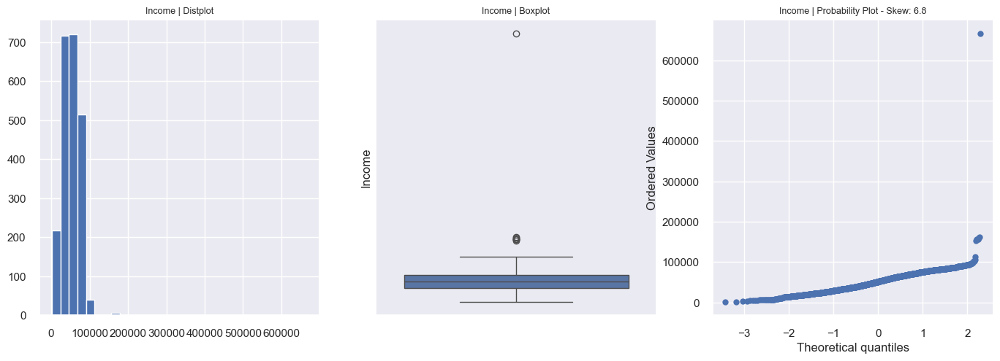

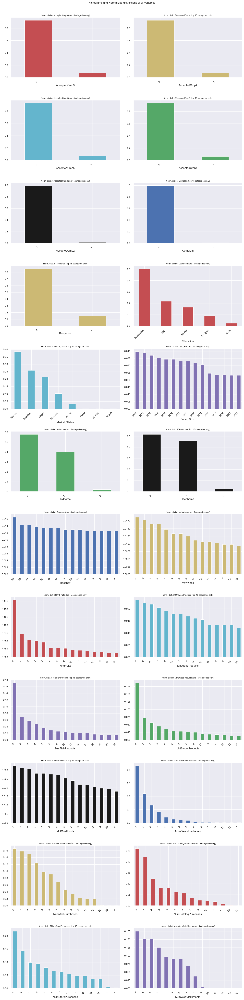

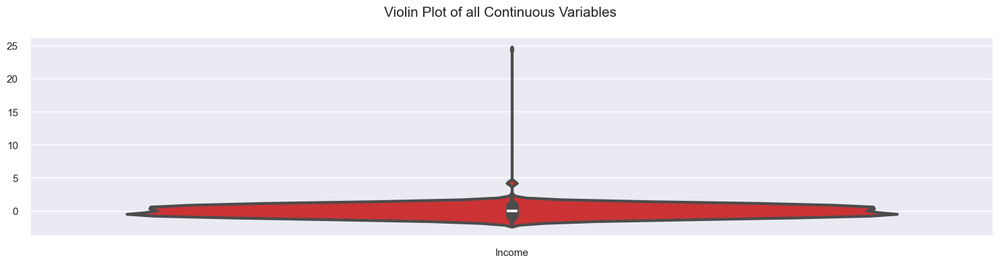

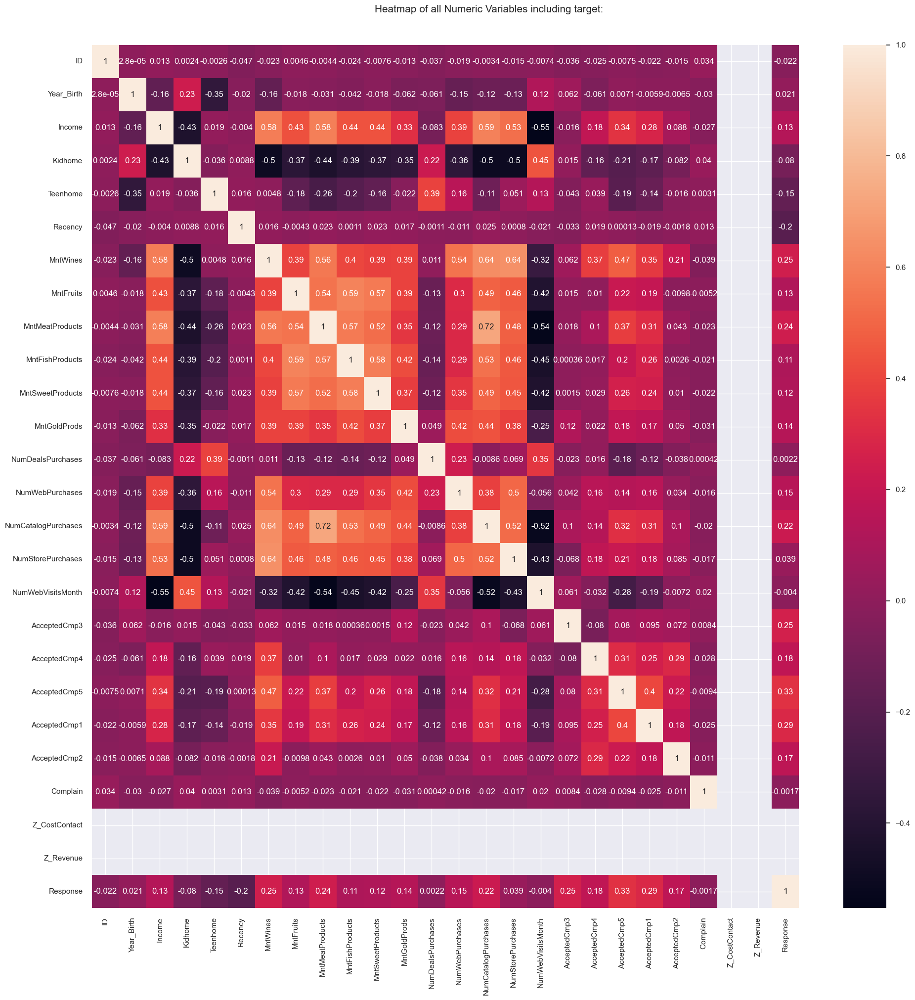

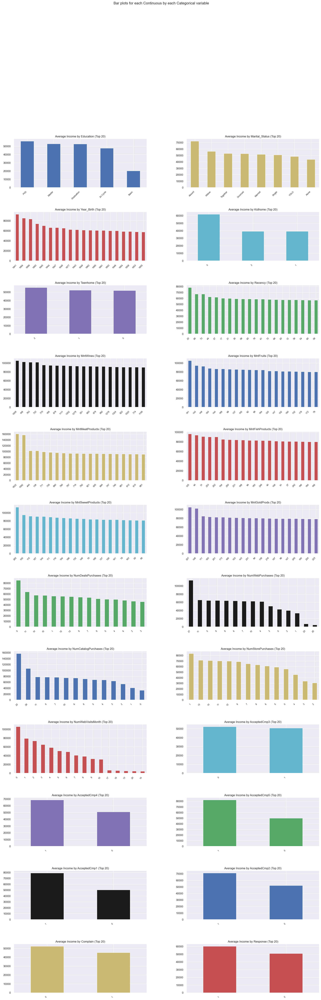

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\ralpa\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\ralpa\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\ralpa\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\ralpa\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\ralpa\AppData\Roaming\nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]   

Could not draw wordcloud plot for Dt_Customer. We need at least 1 word to plot a word cloud, got 0.
All Plots done
Time to run AutoViz = 13 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


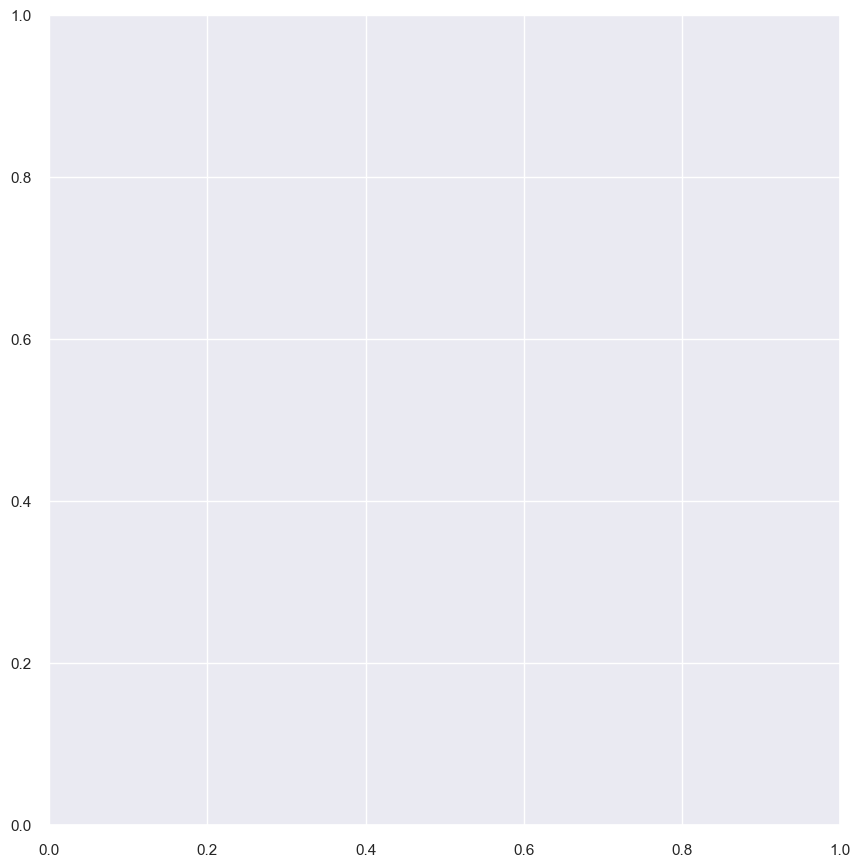

In [1240]:
AV = AutoViz_Class()
df_av = AV.AutoViz('marketing_campaign.csv',sep="\t")

In [1241]:
df['Marital_Status'].value_counts()  

Marital_Status
Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [1242]:
df['Marital_Status'] = df['Marital_Status'].replace(['Married', 'Together'],'relationship')
df['Marital_Status'] = df['Marital_Status'].replace(['Divorced', 'Widow', 'Alone', 'YOLO', 'Absurd'],'Single')

In [1243]:
df['Marital_Status'].value_counts()  

Marital_Status
relationship    1430
Single           786
Name: count, dtype: int64

In [1244]:
df['TotalAcceptedCmp'] = df['AcceptedCmp1'] + df['AcceptedCmp2'] + df['AcceptedCmp3'] + df['AcceptedCmp4'] + df['AcceptedCmp5'] + df['Response']


In [1245]:
df["Children"]=df["Kidhome"]+df["Teenhome"]
df["Family_Size"] = df["Marital_Status"].replace({"Single": 1, "relationship":2})+ df["Children"]
df.head(1)

,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Spent,TotalAcceptedCmp,Children,Family_Size
0,59,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,1617,1,0,1


In [1246]:
df["Is_Parents"] = np.where(df.Children> 0, 1, 0)

In [1247]:
df["Is_Parents"].dtype

dtype('int32')

In [1248]:
col_del = ["AcceptedCmp1" , "AcceptedCmp2", "AcceptedCmp3" , "AcceptedCmp4","AcceptedCmp5","MntWines", "MntFruits", "MntMeatProducts", 
           "MntFishProducts", "MntSweetProducts", "MntGoldProds","Kidhome","Teenhome","Dt_Customer"]
df=df.drop(columns=col_del,axis=1)
df.head()

,Age,Education,Marital_Status,Income,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Spent,TotalAcceptedCmp,Children,Family_Size,Is_Parents
0,59,Graduation,Single,58138.0,58,3,8,10,4,7,0,1,1617,1,0,1,0
1,62,Graduation,Single,46344.0,38,2,1,1,2,5,0,0,27,0,2,3,1
2,51,Graduation,relationship,71613.0,26,1,8,2,10,4,0,0,776,0,0,2,0
3,32,Graduation,relationship,26646.0,26,2,2,0,4,6,0,0,53,0,1,3,1
4,35,PhD,relationship,58293.0,94,5,5,3,6,5,0,0,422,0,1,3,1


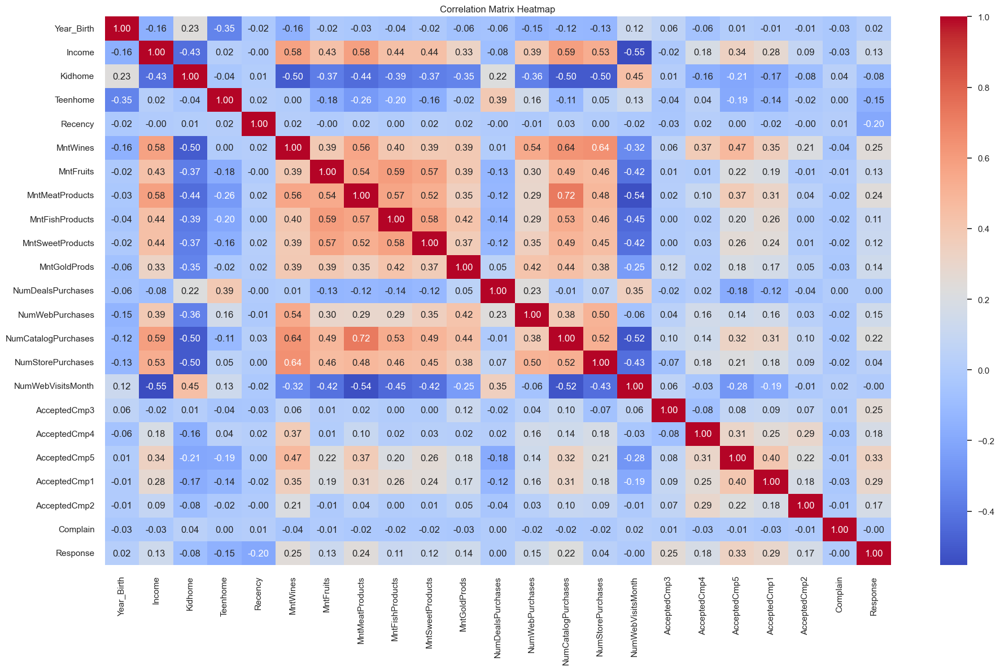

In [1249]:
# Heatmap çizme
plt.figure(figsize=(20,12))
sns.heatmap(num_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Grafiği gösterme
plt.title('Correlation Matrix Heatmap')
plt.show()
#No two columns are too much correlated with each other so we can't drop any column on the basis of correlation.


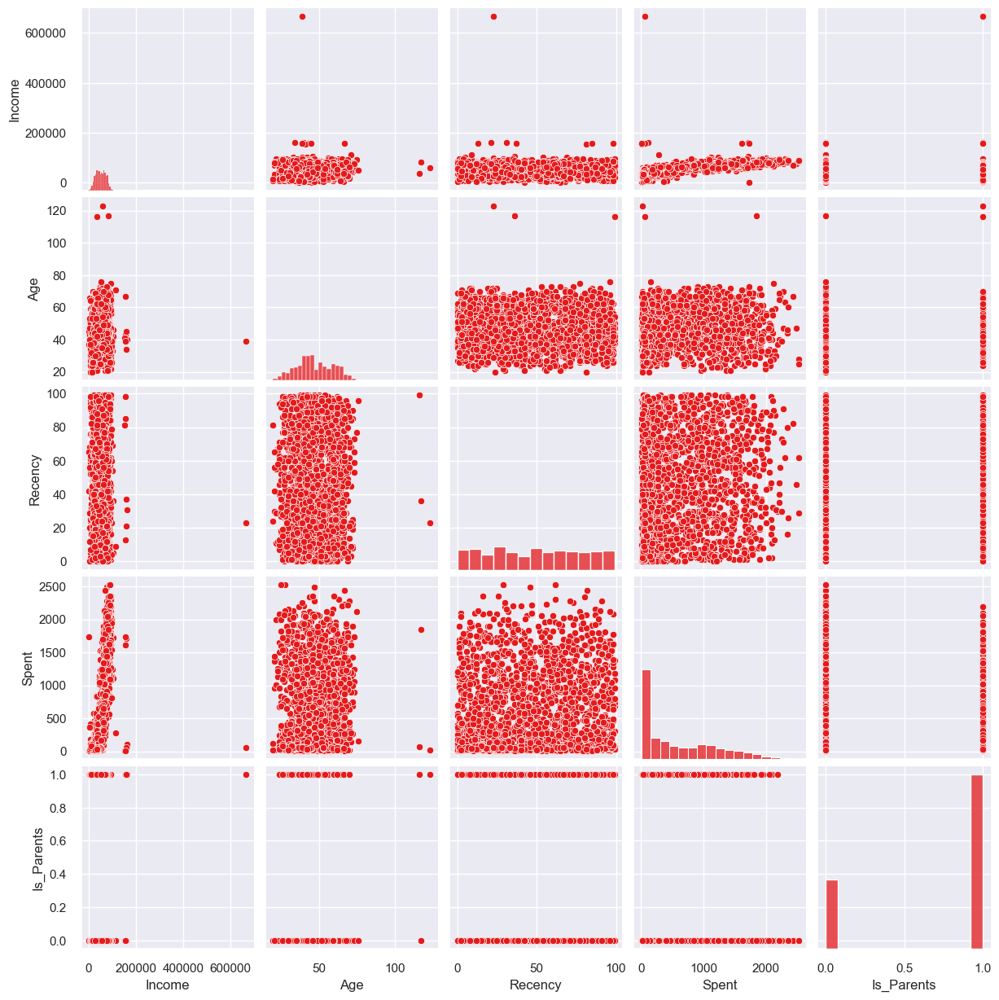

In [1250]:
sns.pairplot(df[['Income','Age','Recency','Spent','Marital_Status',"Is_Parents"]])

In [1251]:
print(df['Education'].value_counts(),"\n\n")
print(df['Marital_Status'].value_counts())

Education
Graduation    1116
PhD            481
Master         365
2n Cycle       200
Basic           54
Name: count, dtype: int64 


Marital_Status
relationship    1430
Single           786
Name: count, dtype: int64


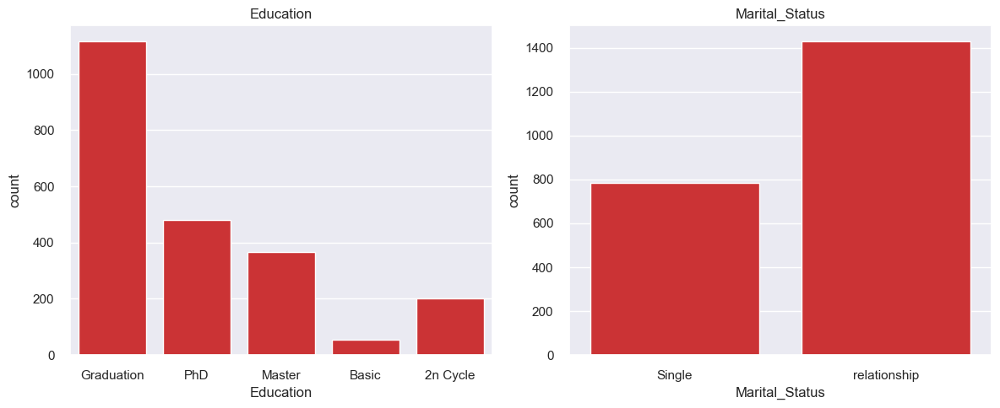

In [1252]:
obj=["Education","Marital_Status"]
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for i in range(len(obj)):
    sns.countplot(data=df,x=obj[i],ax=axes[i])
    axes[i].set_title(obj[i])

plt.tight_layout()
plt.show()

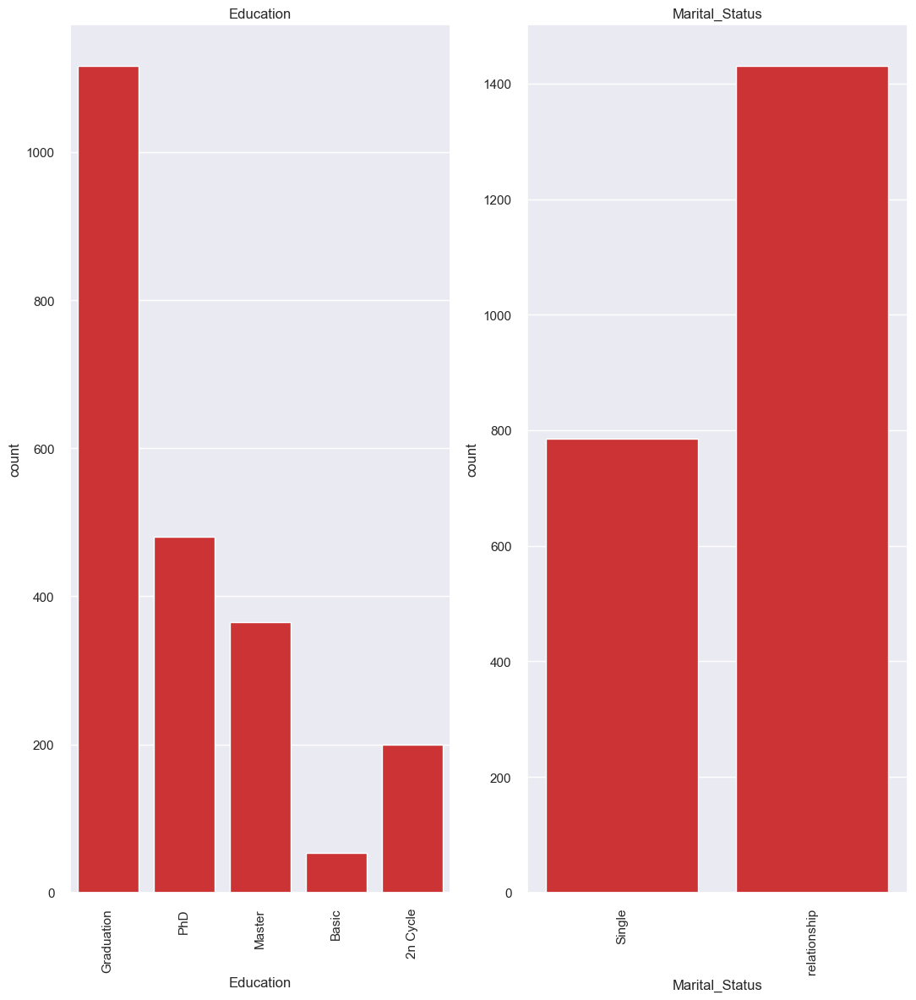

In [1253]:
obj=["Education","Marital_Status"]
for i in range(len(obj)):
    plt.subplot(1,2,i+1)
    sns.countplot(data=df,x=obj[i])
    plt.title(obj[i])
    plt.xticks(rotation=90)
plt.tight_layout()
plt.show()
    

In [1254]:
num_df.rename(columns={"Year_Birth":"Age"},inplace=True)

In [1255]:
num_df["Age"] = 2021-num_df["Age"]

In [1256]:
obj = ['Education','Marital_Status']

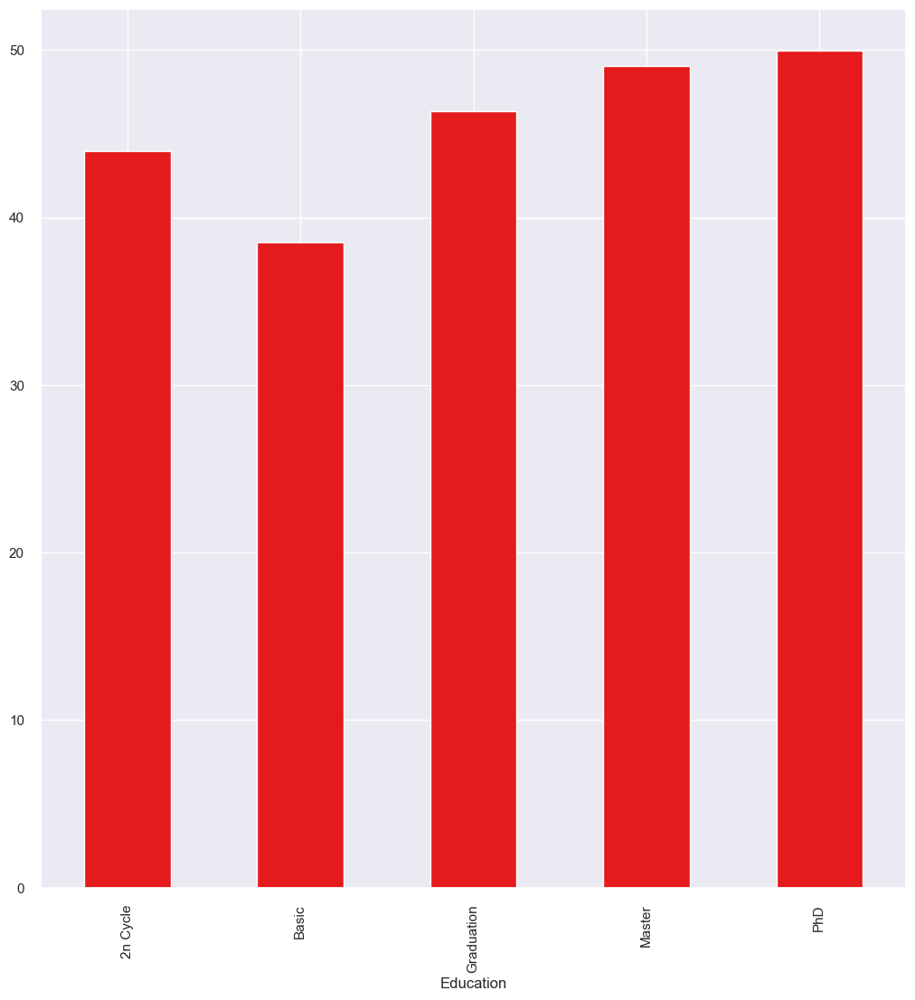

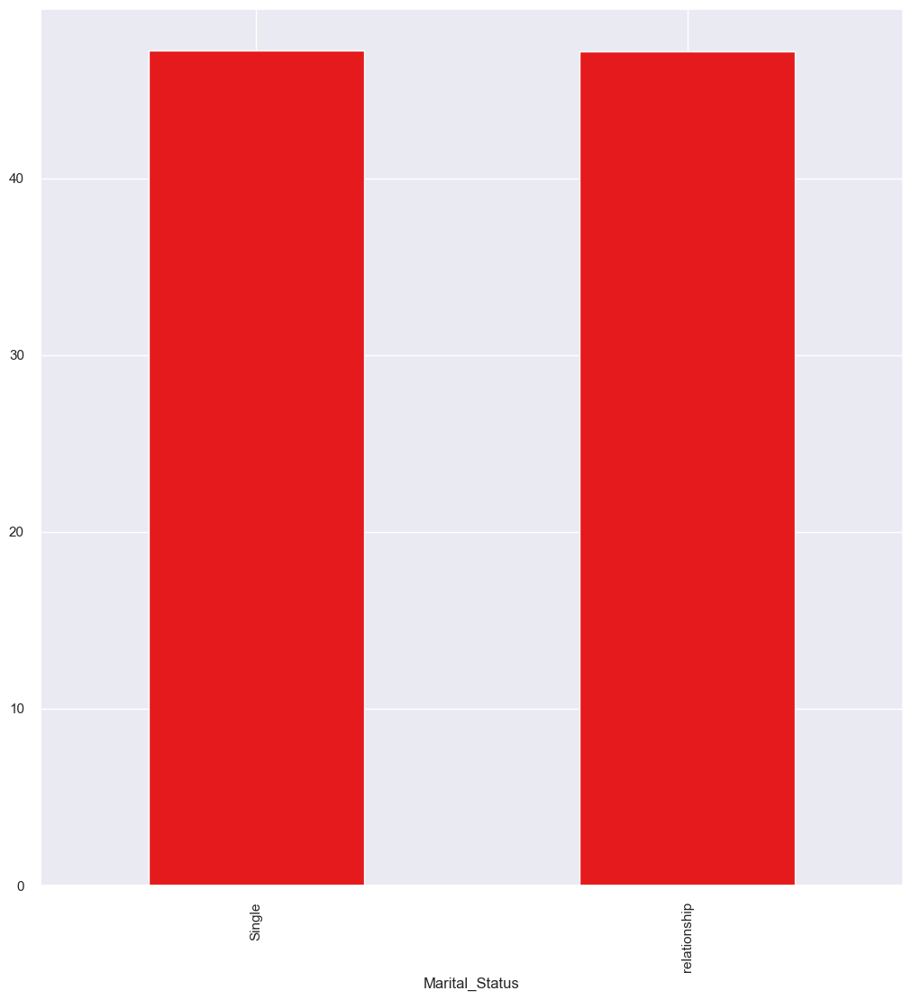

In [1257]:
for i in obj:
    df.groupby(by=df[i])["Age"].mean().plot.bar()
    plt.show()


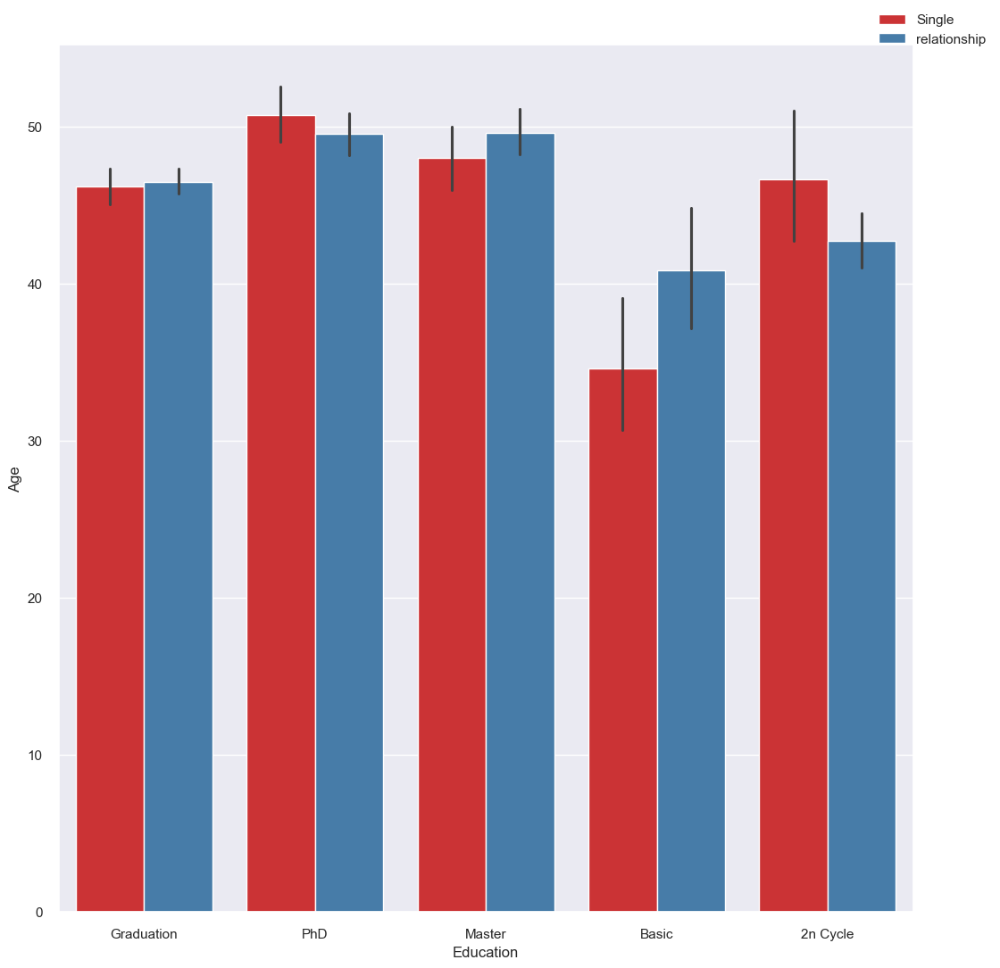

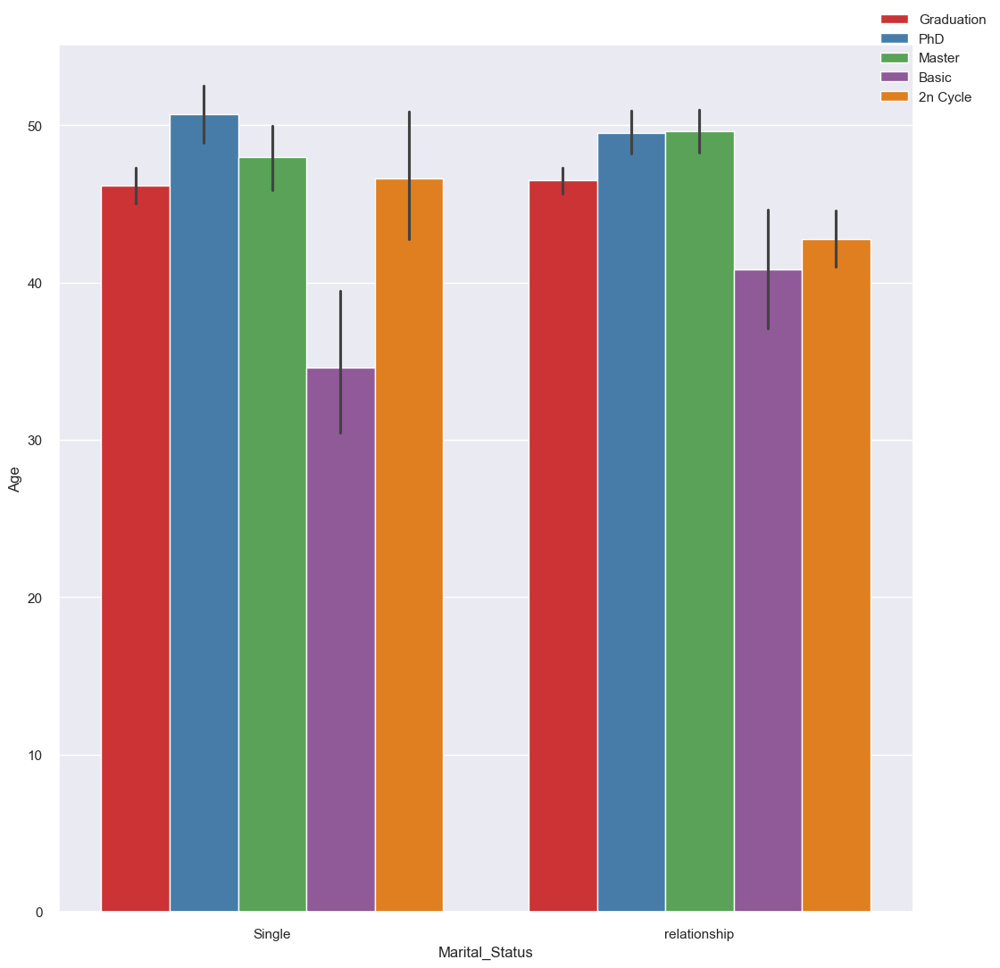

In [1258]:
for i in range(len(obj)):
    for j in range(2):
        x = obj[i]
        if obj[j] != x:
            sns.barplot(x= x,y='Age',hue=obj[j],data=df)
            plt.legend(bbox_to_anchor=(1.1, 1.05))
            plt.show()

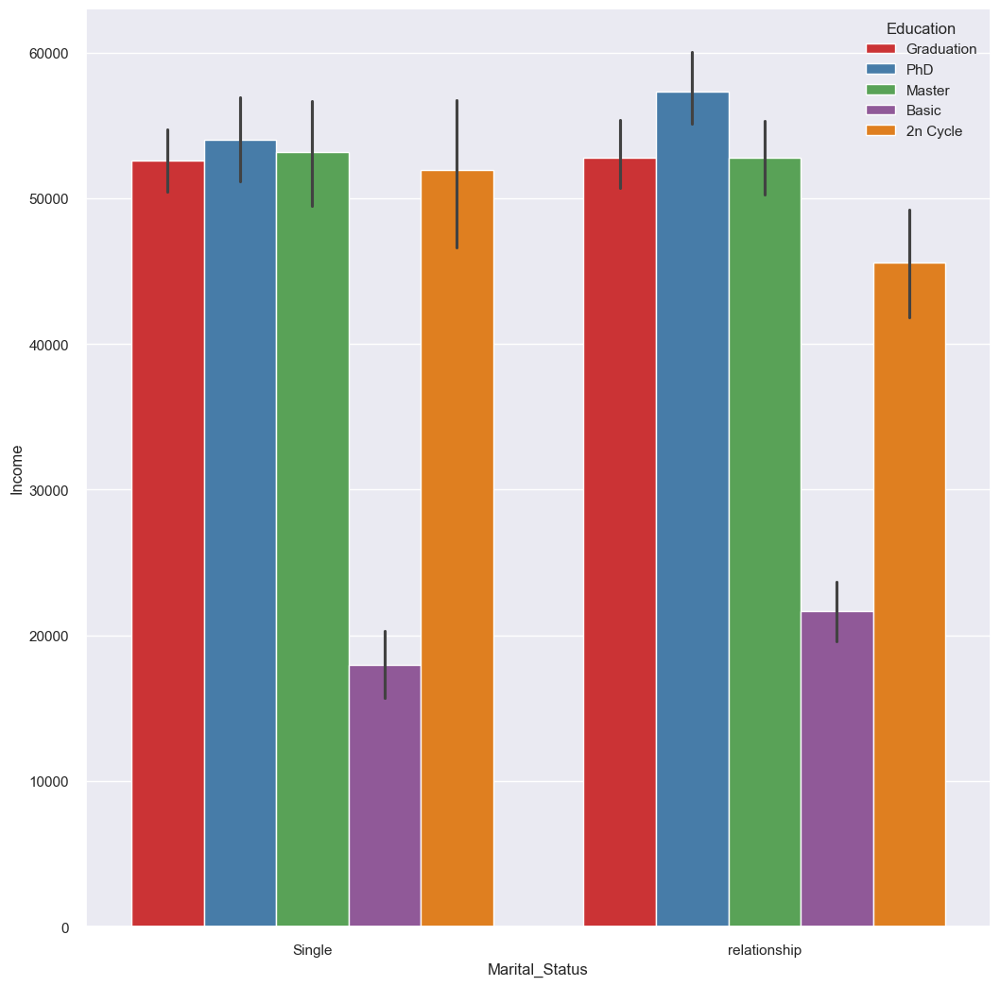

In [1259]:
for i in range(len(obj)):
    x='Marital_Status'
    for j in range(1):
        if obj[i] != x:
            sns.barplot(x= x,y='Income',hue=obj[i],data=df)
            sns.set(rc={'figure.figsize':(11,12)})
            plt.show()

In [1260]:
df.head(1)

,Age,Education,Marital_Status,Income,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Spent,TotalAcceptedCmp,Children,Family_Size,Is_Parents
0,59,Graduation,Single,58138.0,58,3,8,10,4,7,0,1,1617,1,0,1,0


In [1261]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2216 entries, 0 to 2239
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Age                  2216 non-null   int64  
 1   Education            2216 non-null   object 
 2   Marital_Status       2216 non-null   object 
 3   Income               2216 non-null   float64
 4   Recency              2216 non-null   int64  
 5   NumDealsPurchases    2216 non-null   int64  
 6   NumWebPurchases      2216 non-null   int64  
 7   NumCatalogPurchases  2216 non-null   int64  
 8   NumStorePurchases    2216 non-null   int64  
 9   NumWebVisitsMonth    2216 non-null   int64  
 10  Complain             2216 non-null   int64  
 11  Response             2216 non-null   int64  
 12  Spent                2216 non-null   int64  
 13  TotalAcceptedCmp     2216 non-null   int64  
 14  Children             2216 non-null   int64  
 15  Family_Size          2216 non-null   int64 

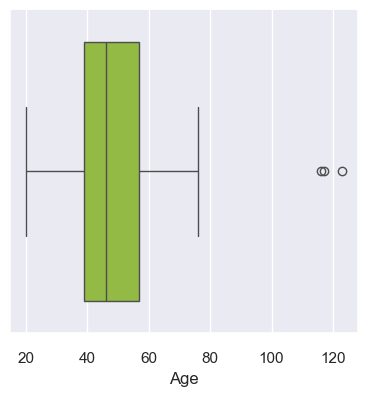

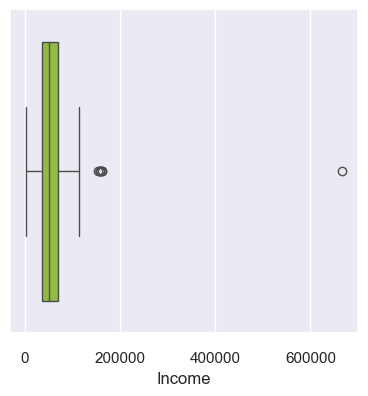

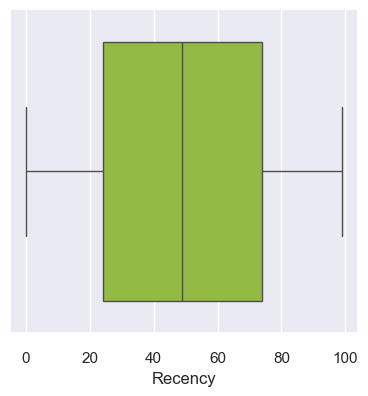

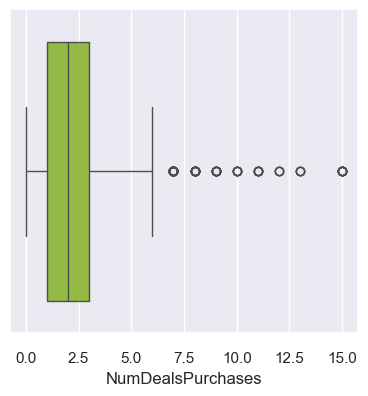

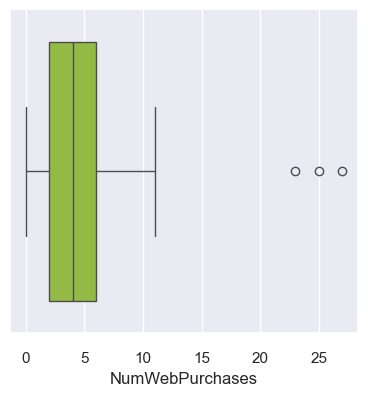

...

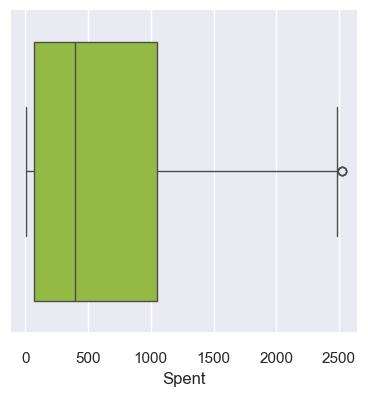

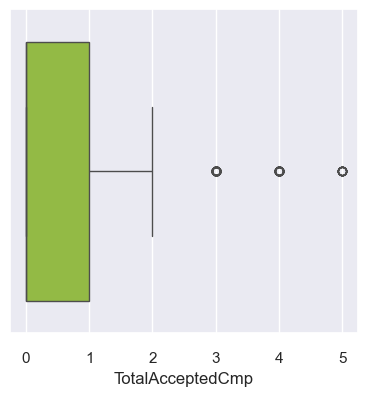

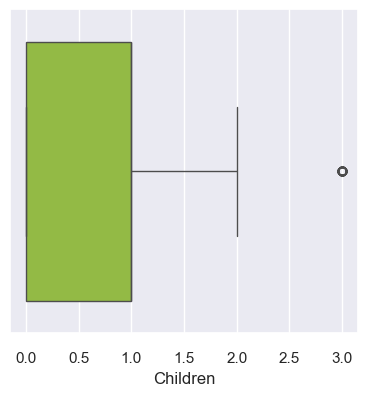

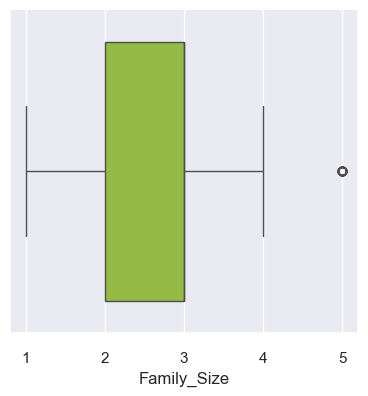

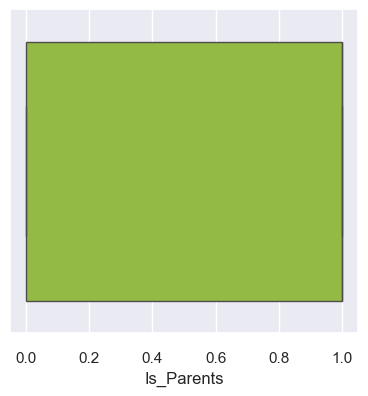

In [1262]:
y = df.drop(['Education','Marital_Status'],axis = 1)
for i in y.columns:
    plt.figure(figsize=(4,4))
    sns.boxplot(x = i, data = y,color = 'yellowgreen')   
    plt.xlabel(i)
    plt.show()

In [1263]:
obj_col=df.select_dtypes(["object"])
obj_col.columns

Index(['Education', 'Marital_Status'], dtype='object')

In [1264]:
obj_cols = (df.dtypes == 'object')
obj_cols

Age                    False
Education               True
Marital_Status          True
Income                 False
Recency                False
NumDealsPurchases      False
NumWebPurchases        False
NumCatalogPurchases    False
NumStorePurchases      False
NumWebVisitsMonth      False
Complain               False
Response               False
Spent                  False
TotalAcceptedCmp       False
Children               False
Family_Size            False
Is_Parents             False
dtype: bool

In [1265]:
object_cols = list(obj_cols[obj_cols].index)
object_cols

['Education', 'Marital_Status']

In [1266]:
LE=LabelEncoder()
for cols in object_cols:
    df[cols]=df[[cols]].apply(LE.fit_transform)

In [1267]:
df.drop(["Response"],axis=1,inplace=True)

In [1268]:
df.dtypes

Age                      int64
Education                int32
Marital_Status           int32
Income                 float64
Recency                  int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
Complain                 int64
Spent                    int64
TotalAcceptedCmp         int64
Children                 int64
Family_Size              int64
Is_Parents               int32
dtype: object

In [1269]:
df1 = df.groupby('Age').agg({ 'Education' : 'count', 'Marital_Status' : 'count', 'Income':'mean',
        'Recency':'mean', 
        'NumDealsPurchases' : 'mean', 'NumWebPurchases' : 'mean',
       'NumCatalogPurchases' : 'mean', 'NumStorePurchases' : 'mean', 'NumWebVisitsMonth' : 'mean',
        'Complain' : 'sum', 'Spent' : 'mean',"TotalAcceptedCmp" : "mean","Children":"mean","Family_Size":"count"})
df1

,Education,Marital_Status,Income,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Spent,TotalAcceptedCmp,Children,Family_Size
Age,,,,,,,,,,,,,,
20,2,2,10960.500000,52.500000,2.000000,2.000000,0.500000,2.500000,7.000000,0,69.000000,1.000000,0.000000,2
21,5,5,60937.000000,51.600000,1.000000,2.800000,4.800000,7.200000,4.200000,1,761.200000,0.600000,0.000000,5
22,3,3,85449.333333,31.666667,1.000000,5.000000,4.666667,9.333333,3.333333,0,1457.333333,2.000000,0.000000,3
23,5,5,74139.800000,53.800000,1.000000,4.400000,6.800000,5.800000,1.600000,0,1191.200000,0.800000,0.000000,5
24,13,13,47830.153846,45.923077,1.461538,3.153846,3.384615,5.153846,5.230769,0,685.538462,0.384615,0.307692,13
25,15,15,60900.333333,46.000000,2.000000,4.066667,4.466667,6.800000,4.666667,0,1112.333333,0.866667,0.066667,15
26,18,18,40919.277778,41.500000,1.444444,3.444444,2.000000,4.666667,6.000000,0,532.000000,0.666667,0.333333,18
27,29,29,42250.172414,50.000000,1.793103,2.724138,2.034483,5.620690,5.103448,0,426.689655,0.344828,0.655172,29
28,29,29,47947.758621,52.965517,1.758621,3.413793,2.827586,5.793103,5.137931,1,720.068966,0.344828,0.586207,29


In [1270]:
df2 = df.groupby('Education').agg({'Education' : 'count', 'Marital_Status' : 'count', 'Income':'mean',
        'Recency':'mean', 
        'NumDealsPurchases' : 'mean', 'NumWebPurchases' : 'mean',
       'NumCatalogPurchases' : 'mean', 'NumStorePurchases' : 'mean', 'NumWebVisitsMonth' : 'mean',
        'Complain' : 'sum', 'Spent' : 'mean',"TotalAcceptedCmp" : "mean","Children":"mean","Family_Size":"count"})
df2


#from above groupby agg we can say that,¶
#many number of them in graduatrion and avereage monry spent by them is also high
#average money spent by basic is low among all and their income is also low
#income of PhD is more among all

,Education,Marital_Status,Income,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Spent,TotalAcceptedCmp,Children,Family_Size
Education,,,,,,,,,,,,,,
0,200,200,47633.190000,48.510000,2.260000,3.765000,2.355000,5.560000,5.460000,4,494.930000,0.360000,0.885000,200
1,54,54,20306.259259,48.444444,1.796296,1.888889,0.481481,2.851852,6.870370,0,81.796296,0.148148,0.722222,54
2,1116,1116,52720.373656,49.879928,2.311828,4.115591,2.738351,5.841398,5.284946,14,621.686380,0.439964,0.932796,1116
3,365,365,52917.534247,47.317808,2.424658,4.035616,2.545205,5.887671,5.205479,2,609.767123,0.432877,0.991781,365
4,481,481,56145.313929,48.559252,2.359667,4.432432,2.987526,6.072765,5.251559,1,676.733888,0.550936,0.997921,481


In [1271]:
df["NumDealsPurchases"].unique()

array([ 3,  2,  1,  5,  4, 15,  7,  6,  9,  0,  8, 10, 13, 11, 12],
      dtype=int64)

In [1272]:
num_df.rename(columns={"Year_Birth":"Age"},inplace=True)


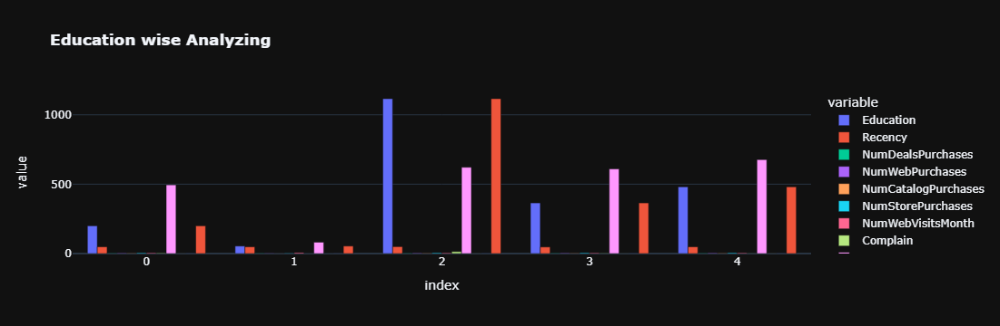

In [1273]:
px.bar(data_frame=df2.drop(['Income','Marital_Status'],axis = 1), barmode='group',
       title = "<b>Education wise Analyzing</b>",template="plotly_dark")
# droping income,marital status  since they have lagrge value
# PhD spent more tha any other in last 2 years

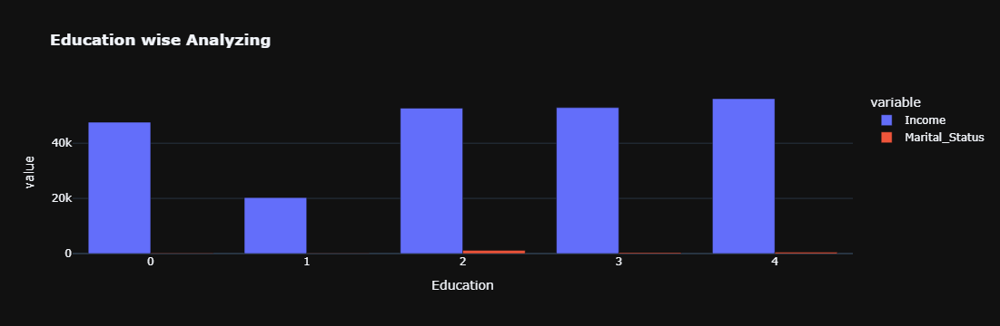

In [1274]:
px.bar(data_frame=df2[['Income','Marital_Status']], barmode='group',
       title = "<b>Education wise Analyzing</b>",template="plotly_dark")

# income for phD are more

In [1275]:
df3 = df.groupby('Marital_Status').agg({'Education' : 'count', 'Marital_Status' : 'count', 'Income':'mean',
        'Recency':'mean', 
        'NumDealsPurchases' : 'mean', 'NumWebPurchases' : 'mean',
       'NumCatalogPurchases' : 'mean', 'NumStorePurchases' : 'mean', 'NumWebVisitsMonth' : 'mean',
        'Complain' : 'sum', 'Spent' : 'mean',"TotalAcceptedCmp" : "mean","Children":"mean","Family_Size":"count"})
df3
#Married       3
#Together      5
#Single        4
#Divorced      2
#Widow         6
#Alone         1
#YOLO          7
#Absurd        0

,Education,Marital_Status,Income,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Spent,TotalAcceptedCmp,Children,Family_Size
Marital_Status,,,,,,,,,,,,,,
0,786,786,52088.945293,49.066158,2.255725,4.072519,2.709924,5.781170,5.309160,8,622.805344,0.520356,0.904580,786
1,1430,1430,52334.264336,48.983217,2.360839,4.092308,2.649650,5.811888,5.324476,13,598.429371,0.409091,0.970629,1430


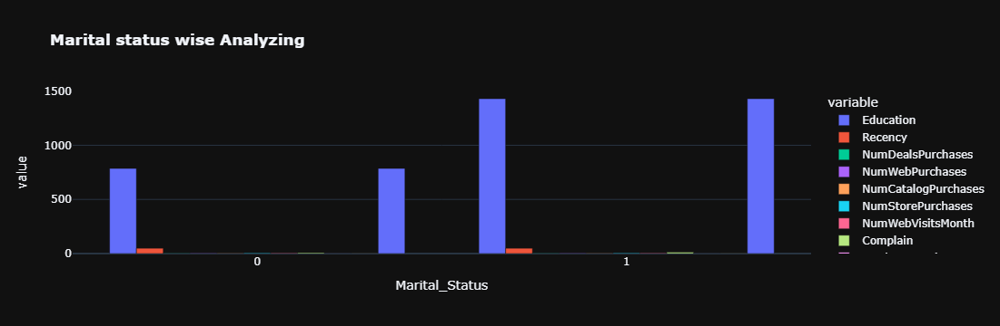

In [1276]:
px.bar(data_frame=df3.drop(['Income','Marital_Status','Spent'],axis = 1), barmode='group',
       title = "<b>Marital status wise Analyzing</b>",template="plotly_dark")
# more number of kids at home for married and they are doing education
# average age of widow is more
# average recency of absurd is more

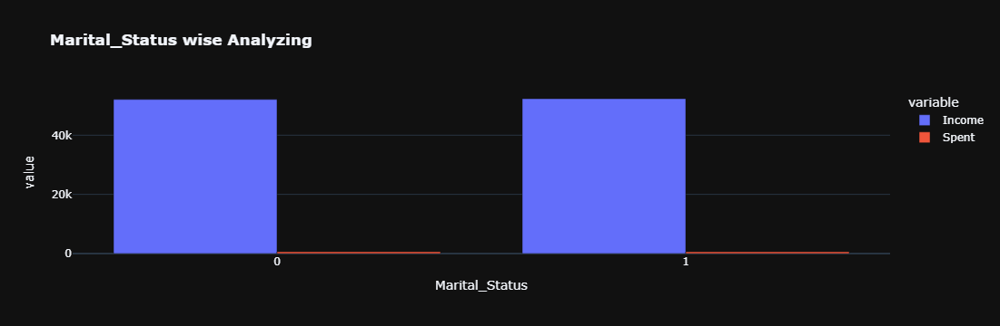

In [1277]:
px.bar(data_frame=df3[['Income','Spent']], barmode='group',
       title = "<b>Marital_Status wise Analyzing</b>",template="plotly_dark")
# average income of widow is more
# money spent by absurd is more

In [1278]:
scaler = StandardScaler()
scaler.fit(ds)
scaled_features = pd.DataFrame(scaler.transform(ds),columns= ds.columns )

In [1279]:
scaled_features.head()

,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Spent
0,0.986443,-0.350527,0.254218,0.234063,-0.823039,-0.928972,-1.307032,0.310532,0.978226,1.549429,1.690227,2.454568,1.484827,0.850031,0.351713,1.428553,2.504712,-0.554143,0.693232,1.675488
1,1.236801,-0.350527,0.254218,-0.234559,1.039938,0.909066,-0.901325,-0.380509,-0.872024,-0.637328,-0.717986,-0.651038,-0.633880,-0.732867,-0.168231,-1.125881,-0.571082,-1.169518,-0.131574,-0.962358
2,0.318822,-0.350527,1.182303,0.769478,-0.823039,-0.928972,0.610855,-0.795134,0.358511,0.569159,-0.178368,1.340203,-0.146821,-0.037937,-0.688176,1.428553,-0.229327,1.291982,-0.543978,0.280250
3,-1.266777,-0.350527,1.182303,-1.017239,1.039938,-0.928972,-0.680031,-0.795134,-0.872024,-0.561922,-0.655551,-0.504892,-0.585174,-0.752171,-0.168231,-0.760962,-0.912837,-0.554143,0.280829,-0.919224
4,-1.016420,1.429011,-0.673866,0.240221,1.039938,-0.928972,0.326333,1.554407,-0.391671,0.418348,-0.218505,0.152766,-0.000703,-0.559135,1.391603,0.333796,0.112428,0.061232,-0.131574,-0.307044


In [1280]:
#Principal component analysis (PCA) is a technique for reducing the dimensionality of such datasets, 
#increasing interpretability but at the same time minimizing information loss.
pca = PCA(n_components=3)
pca.fit(scaled_features)
PCA_df = pd.DataFrame(pca.transform(scaled_features), columns=(["Education","Income", "Kidhome"]))
PCA_df.describe().T
#Eğer standart sapma yüksekse, bileşenlerde daha fazla varyans vardır; bu da PCA’nın en fazla varyansı yakaladığı bileşenlerde daha fazla bilgi olduğunu gösterir.


,count,mean,std,min,25%,50%,75%,max
Education,2216.0,-4.168346e-17,2.641516,-5.094202,-2.451897,-0.653783,2.305335,7.140143
Income,2216.0,6.412841e-18,1.420152,-3.077048,-1.139655,-0.134504,1.032674,4.879115
Kidhome,2216.0,-3.847704e-17,1.163077,-4.329113,-0.798160,0.007537,0.688402,5.312120


Silhouette Score: 0.40694494312616625


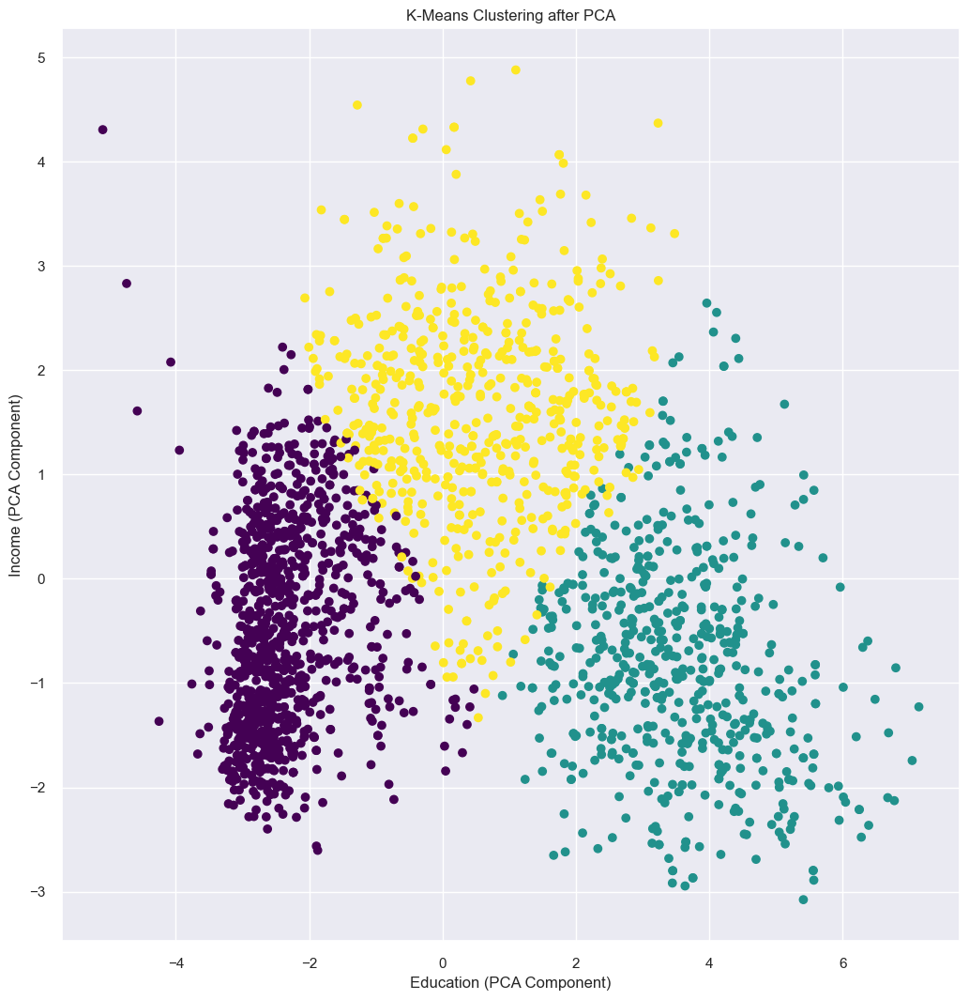

In [1576]:
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(PCA_df)
labels = kmeans.predict(PCA_df)
sil_score = silhouette_score(PCA_df, labels)
print(f"Silhouette Score: {sil_score}")
plt.scatter(PCA_df['Education'], PCA_df['Income'], c=labels, cmap='viridis', marker='o')
plt.title('K-Means Clustering after PCA')
plt.xlabel('Education (PCA Component)')
plt.ylabel('Income (PCA Component)')
plt.show()

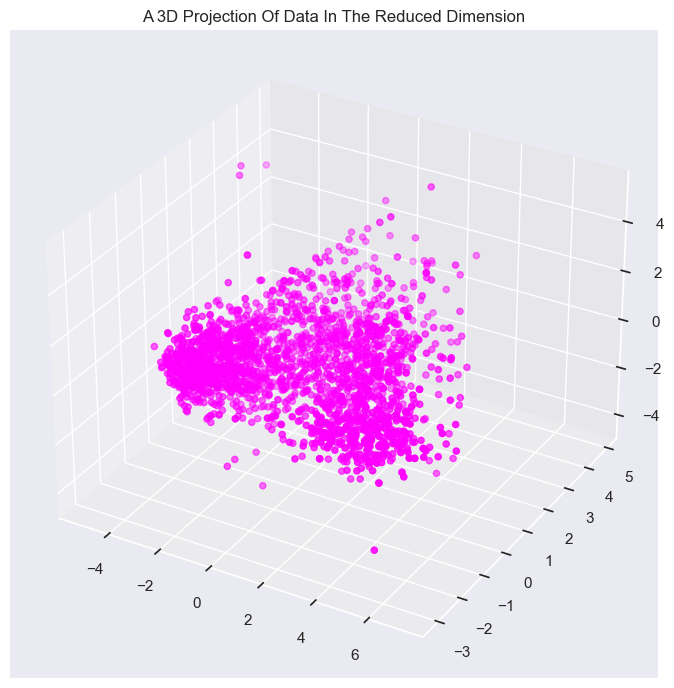

In [1281]:
#A 3D Projection Of Data In The Reduced Dimension
x =PCA_df["Education"]
y =PCA_df["Income"]
z =PCA_df["Kidhome"]
#To plot
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="magenta", marker="o" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

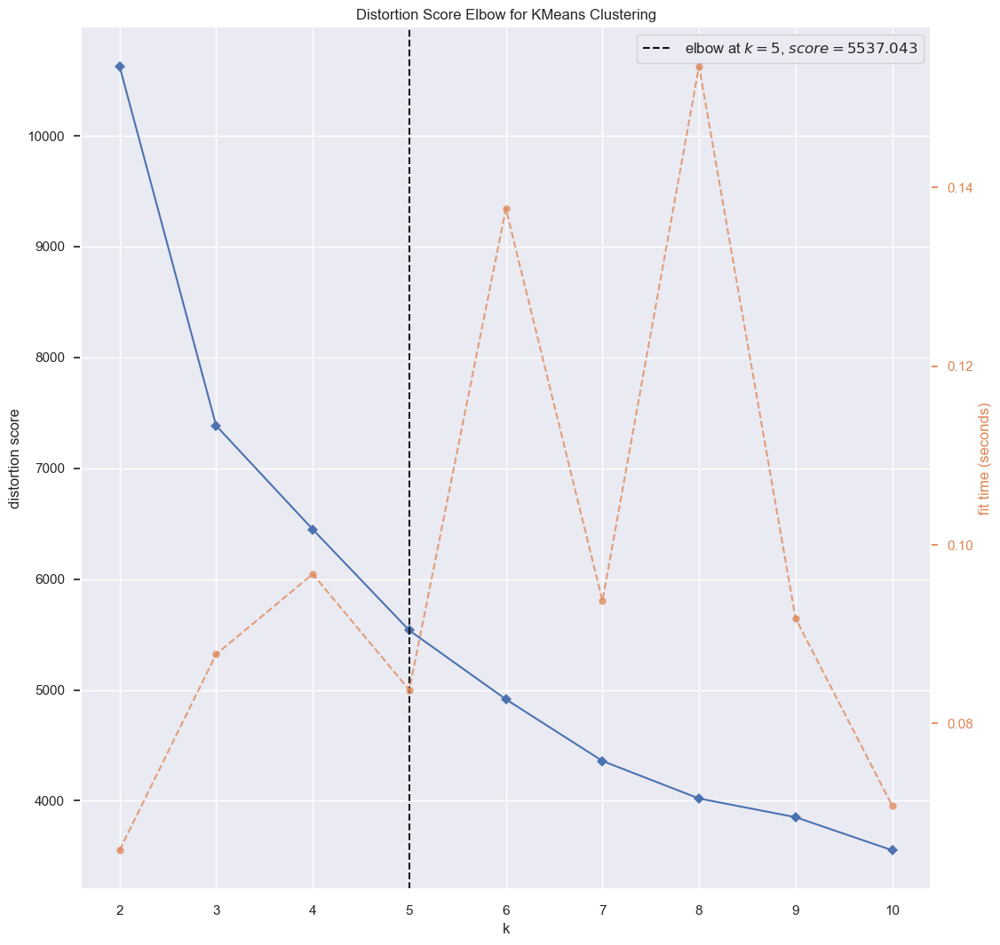

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [1282]:
model = KMeans()
visualizer = KElbowVisualizer(model, k=10)

visualizer.fit(PCA_df)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

In [1283]:
#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters=4)
# fit model and predict clusters
AC_df = AC.fit_predict(PCA_df)
PCA_df["Clusters"] = AC_df
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= AC_df

In [1578]:
sil_score = silhouette_score(PCA_df, AC_df)
print(f"Silhouette Score: {sil_score}")

Silhouette Score: 0.3105449869951555


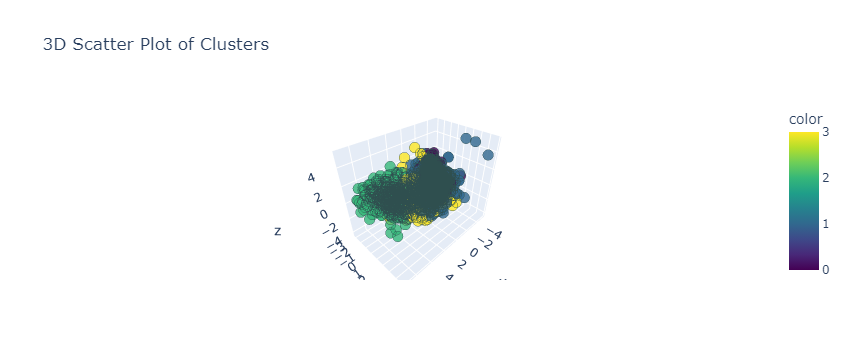

In [1570]:
fig = px.scatter_3d(df, 
                    x=x, 
                    y=y, 
                    z=z, 
                    color=AC_df, 
                    title="3D Scatter Plot of Clusters", 
                    color_continuous_scale='Viridis',  
                    opacity=0.8, 
                     
                    )  

fig.update_traces(marker=dict(size=6,  
                              line=dict(width=1, color='DarkSlateGrey')),  
                 selector=dict(mode='markers'))

fig.show()

In [1284]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [1285]:
PCA_df

,Education,Income,Kidhome,Clusters
0,4.189147,-0.293384,1.320498,2
1,-2.496413,0.196788,-1.076416,0
2,1.854585,-0.291582,-0.148768,2
3,-2.628024,-1.434610,0.352416,0
4,-0.353091,0.025874,0.607390,0
...,...,...,...,...
2211,2.939682,1.047307,1.790753,3
2212,-1.471166,3.445289,0.079008,1
2213,1.589919,-0.692865,0.174075,2
2214,2.059543,1.190066,-1.135600,3


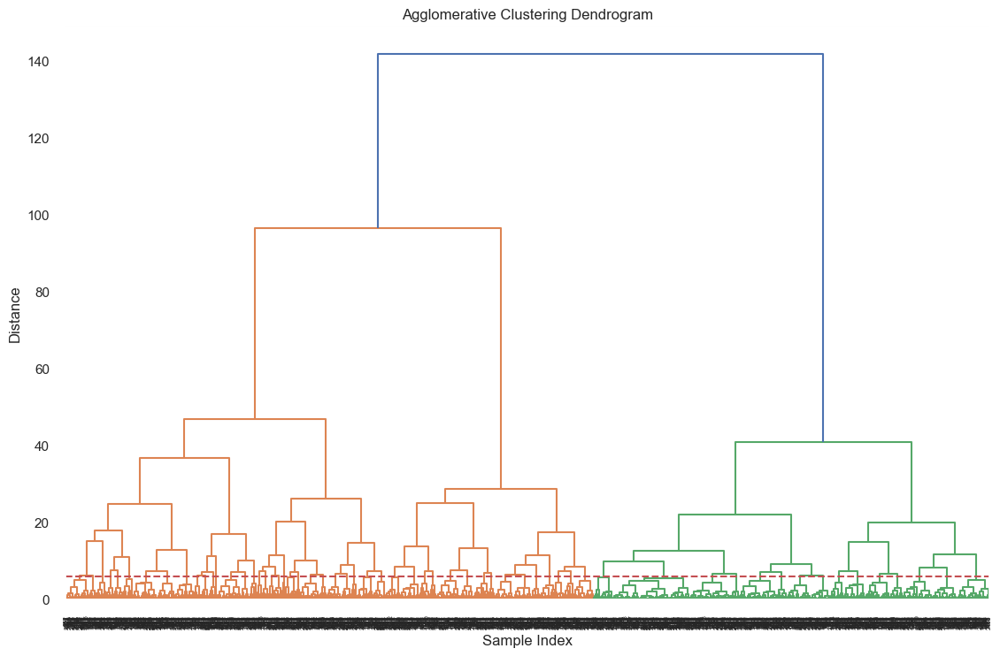

In [1286]:
linked = linkage(PCA_df[['Education', 'Income', 'Kidhome']], method='ward')

# Dendrogramı çizme
plt.figure(figsize=(12, 8))
dendrogram(linked,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True)
plt.title('Agglomerative Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.axhline(y=6, color='r', linestyle='--')  # Kümeleri ayırmak için bir çizgi ekleyebilirsiniz.
plt.show()

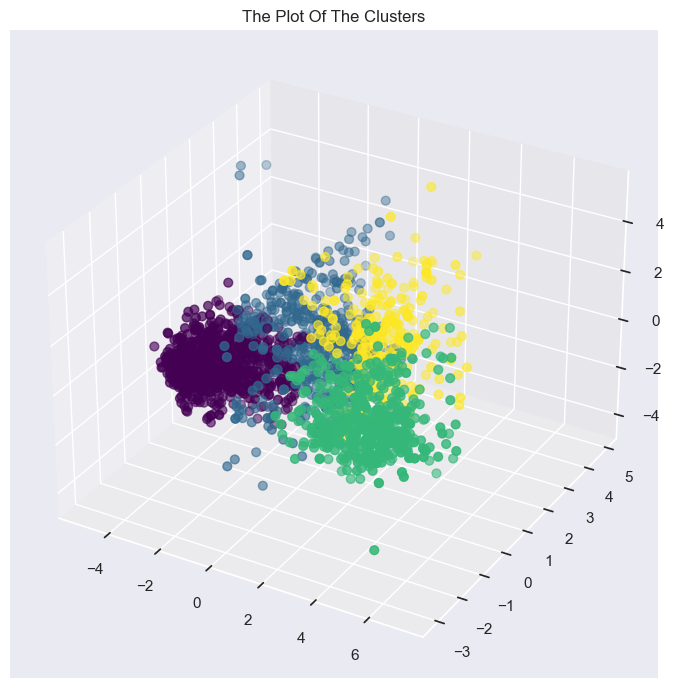

In [1287]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_df["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()

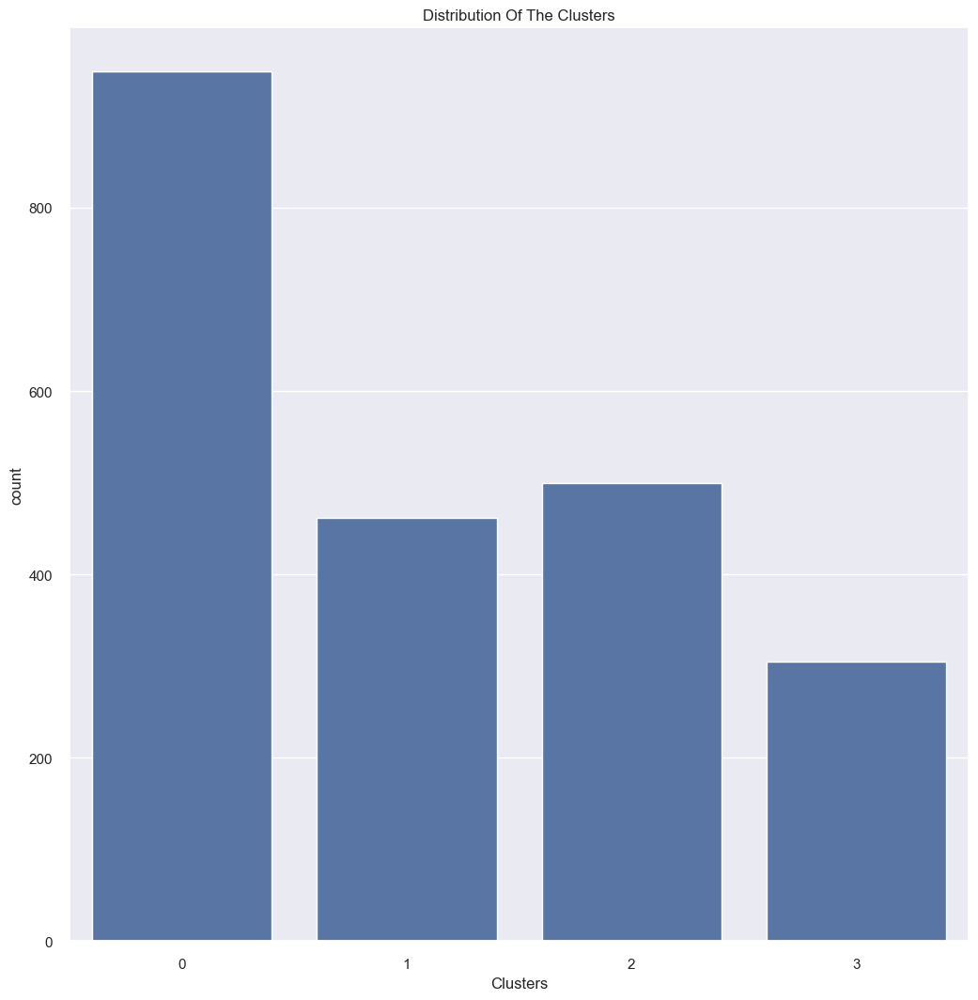

In [1288]:
pl = sns.countplot(x=df["Clusters"])
pl.set_title("Distribution Of The Clusters")
plt.show()

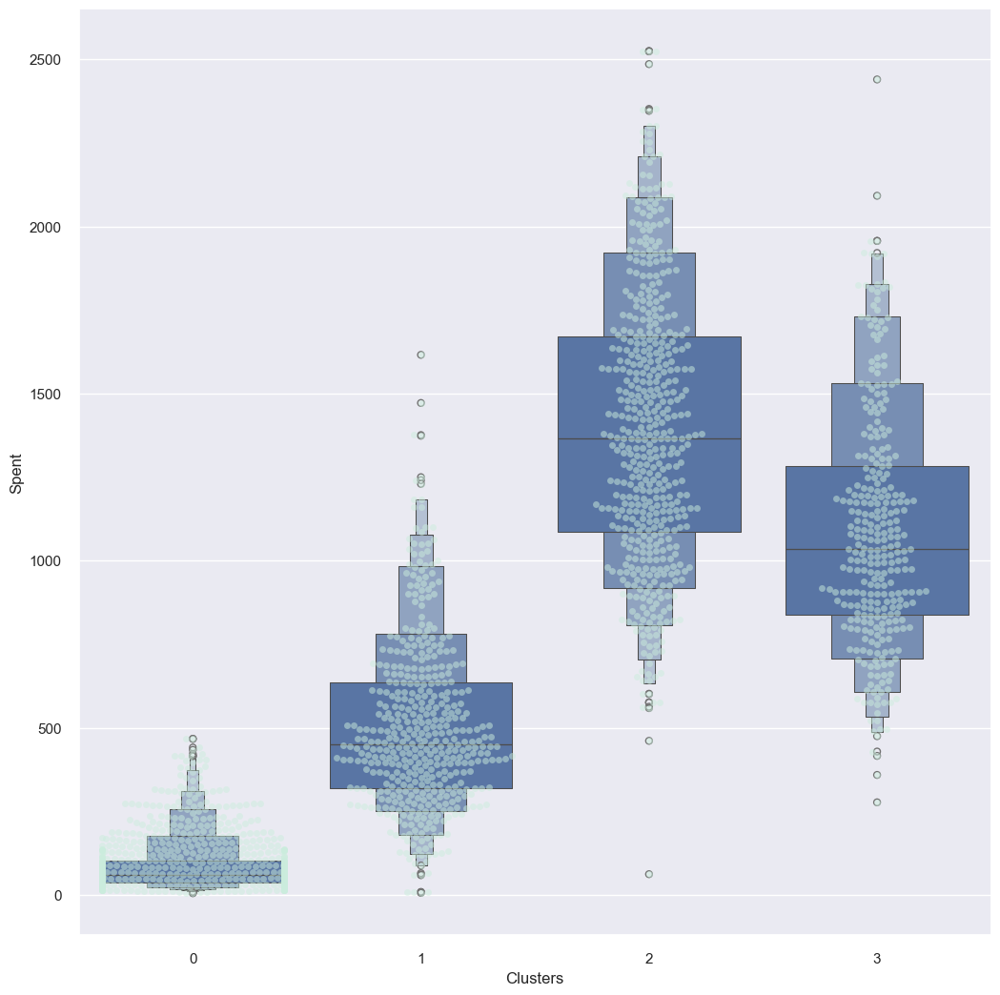

In [1290]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"])
plt.show()
#From the above plot, it can be clearly seen that cluster 2 is our biggest set of customers closely followed by
#cluster 1. We can explore what each cluster is spending on for the targeted marketing strategies.

In [1291]:
df

,Age,Education,Marital_Status,Income,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Spent,TotalAcceptedCmp,Children,Family_Size,Is_Parents,Clusters
0,59,2,0,58138.0,58,3,8,10,4,7,0,1617,1,0,1,0,2
1,62,2,0,46344.0,38,2,1,1,2,5,0,27,0,2,3,1,0
2,51,2,1,71613.0,26,1,8,2,10,4,0,776,0,0,2,0,2
3,32,2,1,26646.0,26,2,2,0,4,6,0,53,0,1,3,1,0
4,35,4,1,58293.0,94,5,5,3,6,5,0,422,0,1,3,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,49,2,1,61223.0,46,2,9,3,4,5,0,1341,0,1,3,1,3
2236,70,4,1,64014.0,56,7,8,2,5,7,0,444,1,3,5,1,1
2237,35,2,0,56981.0,91,1,2,3,13,6,0,1241,1,0,1,0,2
2238,60,3,1,69245.0,8,2,6,5,10,3,0,843,0,1,3,1,3


In [1292]:
df.head(1)

,Age,Education,Marital_Status,Income,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Spent,TotalAcceptedCmp,Children,Family_Size,Is_Parents,Clusters
0,59,2,0,58138.0,58,3,8,10,4,7,0,1617,1,0,1,0,2


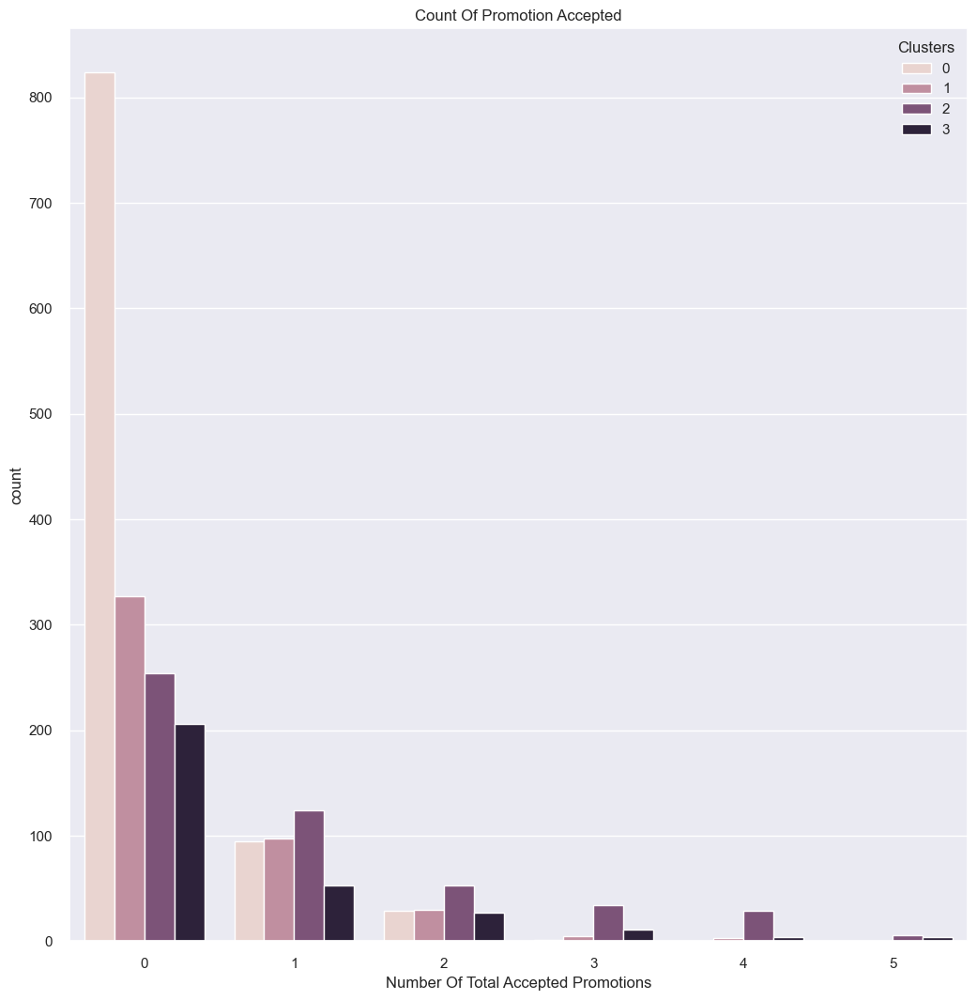

In [1293]:
#Creating a feature to get a sum of accepted promotions 
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=df["TotalAcceptedCmp"],hue=df["Clusters"])
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

In [1294]:
df

,Age,Education,Marital_Status,Income,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Spent,TotalAcceptedCmp,Children,Family_Size,Is_Parents,Clusters
0,59,2,0,58138.0,58,3,8,10,4,7,0,1617,1,0,1,0,2
1,62,2,0,46344.0,38,2,1,1,2,5,0,27,0,2,3,1,0
2,51,2,1,71613.0,26,1,8,2,10,4,0,776,0,0,2,0,2
3,32,2,1,26646.0,26,2,2,0,4,6,0,53,0,1,3,1,0
4,35,4,1,58293.0,94,5,5,3,6,5,0,422,0,1,3,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,49,2,1,61223.0,46,2,9,3,4,5,0,1341,0,1,3,1,3
2236,70,4,1,64014.0,56,7,8,2,5,7,0,444,1,3,5,1,1
2237,35,2,0,56981.0,91,1,2,3,13,6,0,1241,1,0,1,0,2
2238,60,3,1,69245.0,8,2,6,5,10,3,0,843,0,1,3,1,3


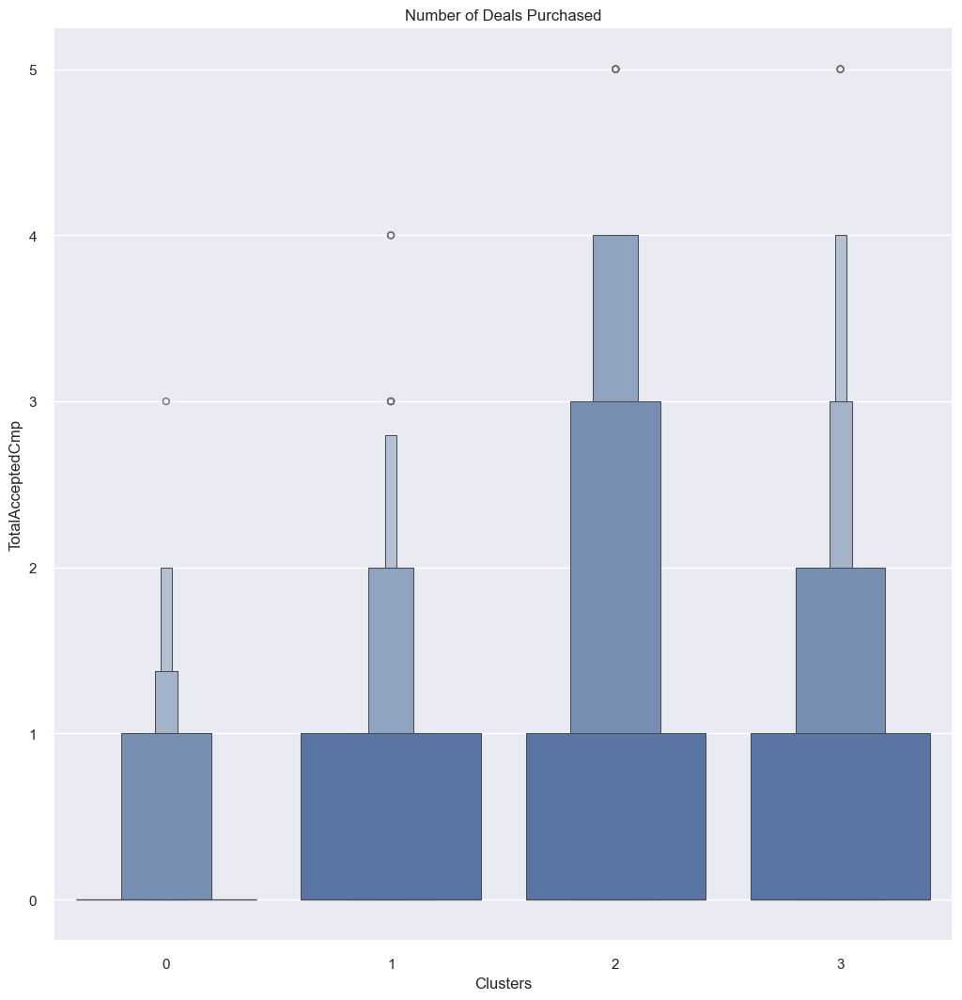

In [1295]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["TotalAcceptedCmp"],x=df["Clusters"])
pl.set_title("Number of Deals Purchased")
plt.show()

In [1296]:
#Initiating the Affinity Clustering model 
AP = AffinityPropagation(damping=0.9)
# fit model and predict clusters
AP_df = AP.fit_predict(PCA_df)
PCA_df["Clusters"] = AP_df
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= AP_df

In [1580]:
sil_score = silhouette_score(PCA_df, AP_df)
print(f"Silhouette Score: {sil_score}")

Silhouette Score: 0.19012862191808108


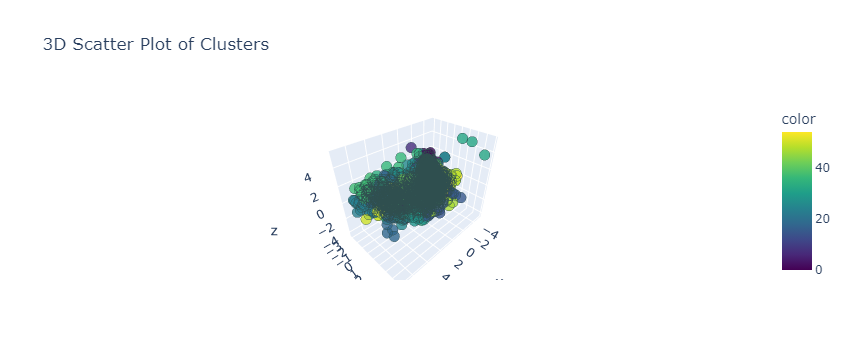

In [1568]:
fig = px.scatter_3d(df, 
                    x=x, 
                    y=y, 
                    z=z, 
                    color=AP_df, 
                    title="3D Scatter Plot of Clusters", 
                    color_continuous_scale='Viridis',  
                    opacity=0.8, 
                     
                    )  

fig.update_traces(marker=dict(size=6,  
                              line=dict(width=1, color='DarkSlateGrey')),  
                 selector=dict(mode='markers'))

fig.show()

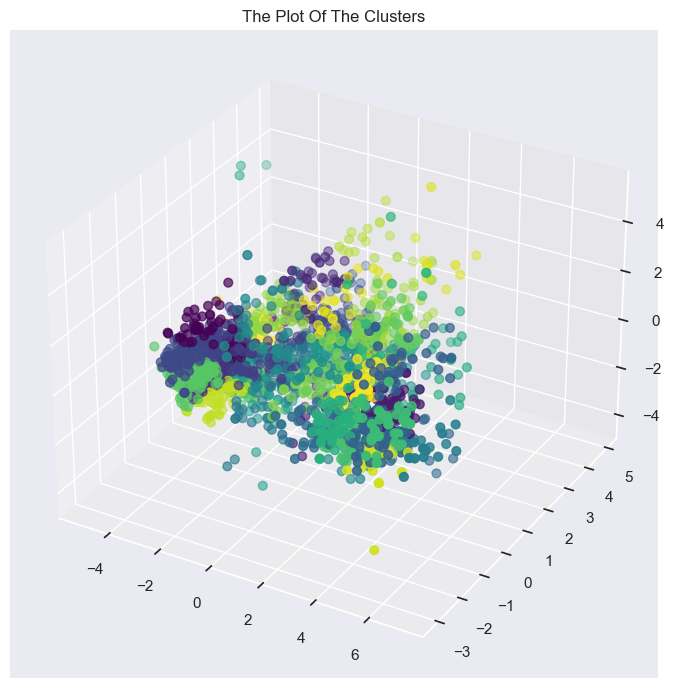

In [1297]:
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d')
ax.scatter(x, y, z, s=40, c=PCA_df["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()

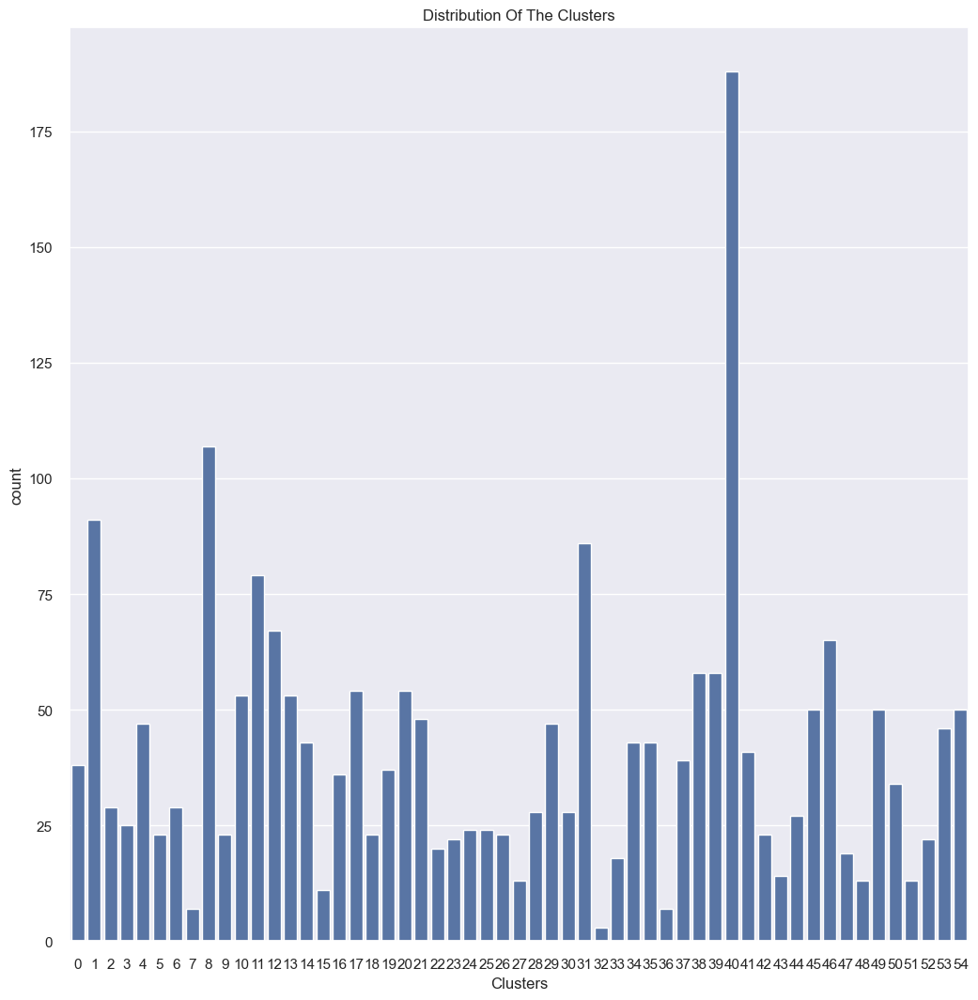

In [1298]:
#Plotting countplot of clusters
pl = sns.countplot(x=df["Clusters"])
pl.set_title("Distribution Of The Clusters")
plt.show()

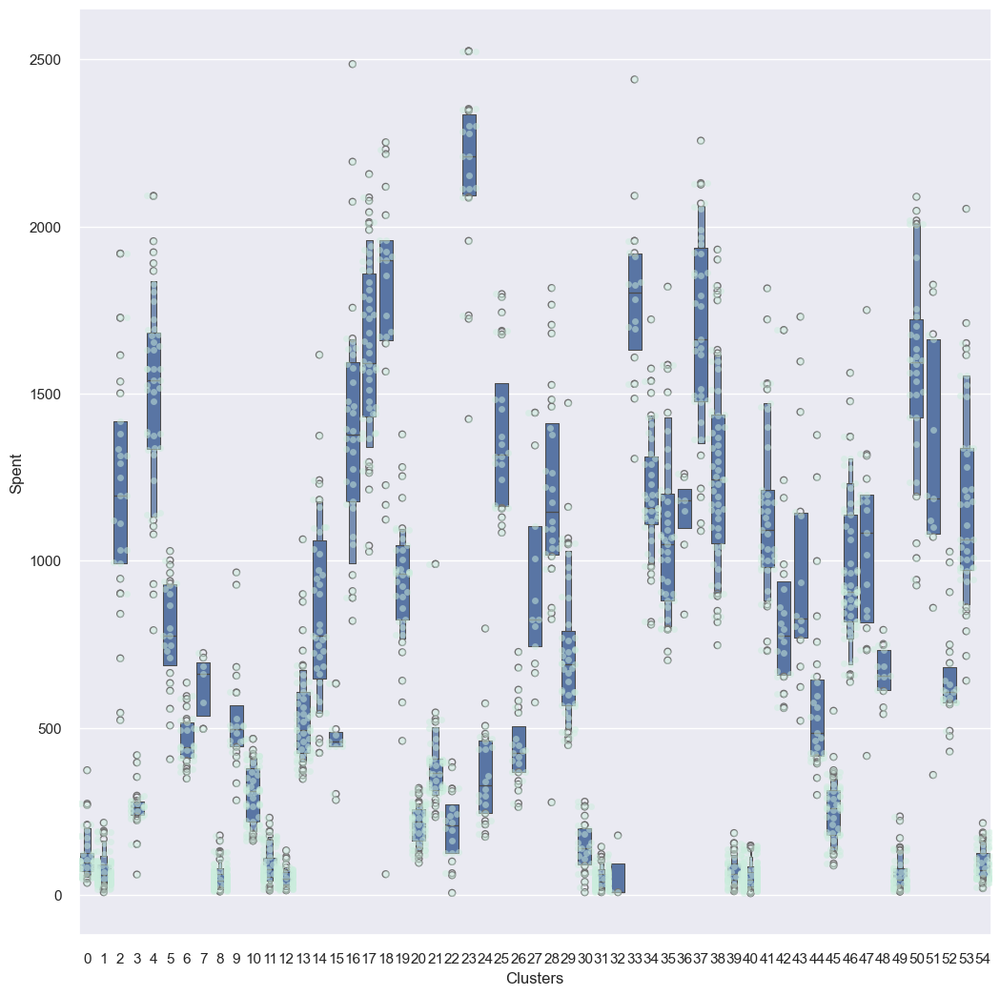

In [1300]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"])
plt.show()

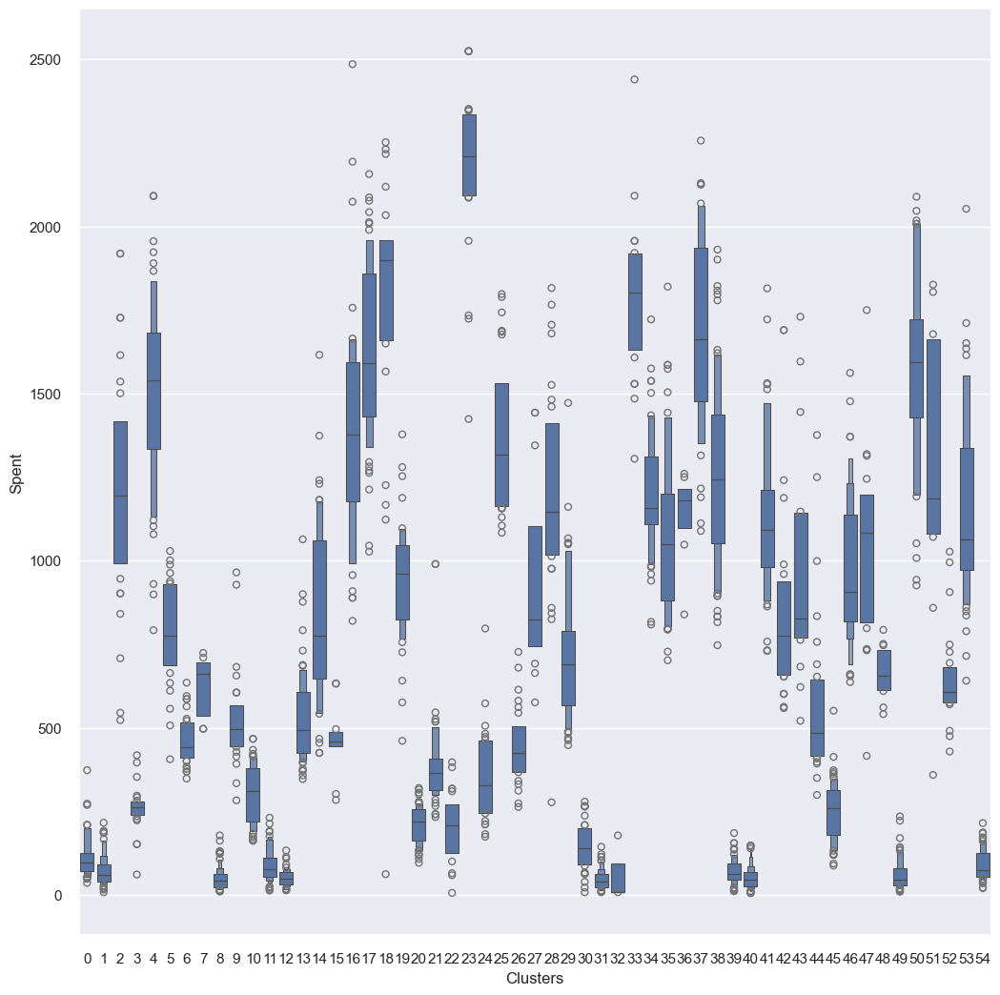

In [1301]:
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"])


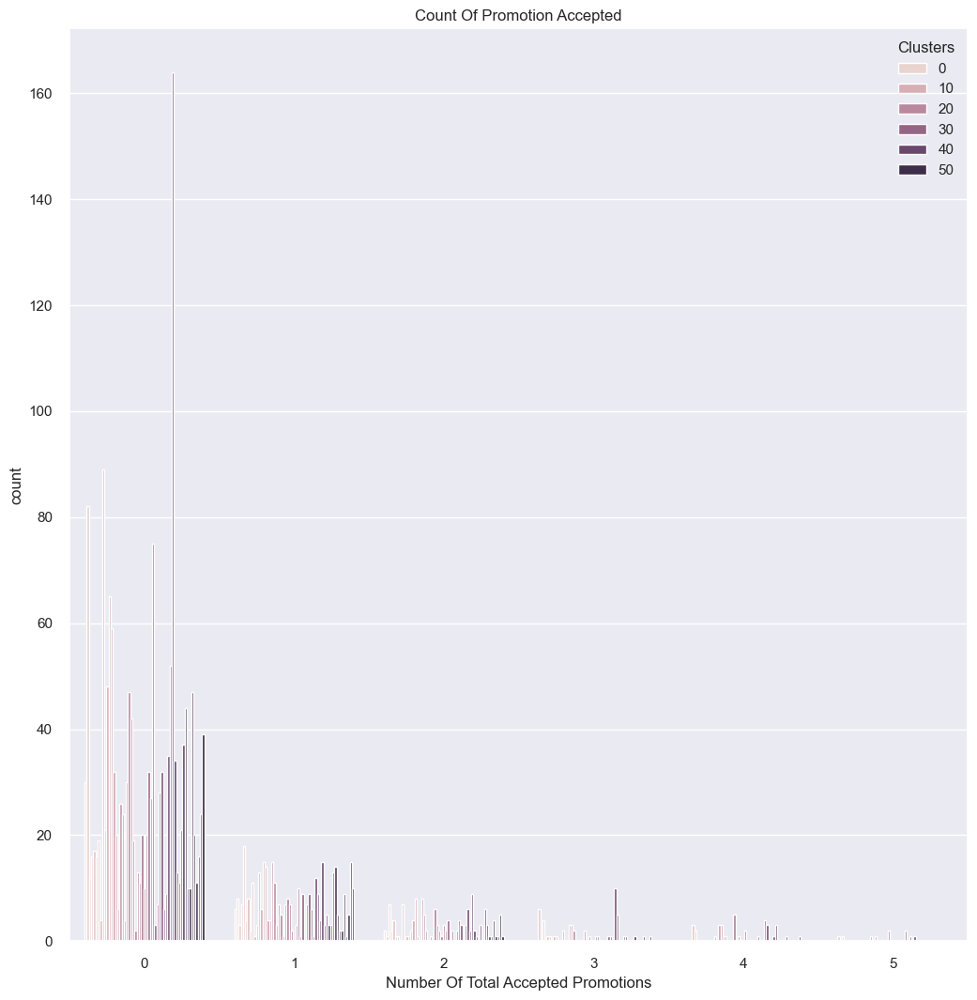

In [1302]:
#Creating a feature to get a sum of accepted promotions 
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=df["TotalAcceptedCmp"],hue=df["Clusters"])
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

In [1303]:
df

,Age,Education,Marital_Status,Income,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Spent,TotalAcceptedCmp,Children,Family_Size,Is_Parents,Clusters
0,59,2,0,58138.0,58,3,8,10,4,7,0,1617,1,0,1,0,16
1,62,2,0,46344.0,38,2,1,1,2,5,0,27,0,2,3,1,31
2,51,2,1,71613.0,26,1,8,2,10,4,0,776,0,0,2,0,42
3,32,2,1,26646.0,26,2,2,0,4,6,0,53,0,1,3,1,40
4,35,4,1,58293.0,94,5,5,3,6,5,0,422,0,1,3,1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,49,2,1,61223.0,46,2,9,3,4,5,0,1341,0,1,3,1,41
2236,70,4,1,64014.0,56,7,8,2,5,7,0,444,1,3,5,1,15
2237,35,2,0,56981.0,91,1,2,3,13,6,0,1241,1,0,1,0,42
2238,60,3,1,69245.0,8,2,6,5,10,3,0,843,0,1,3,1,28


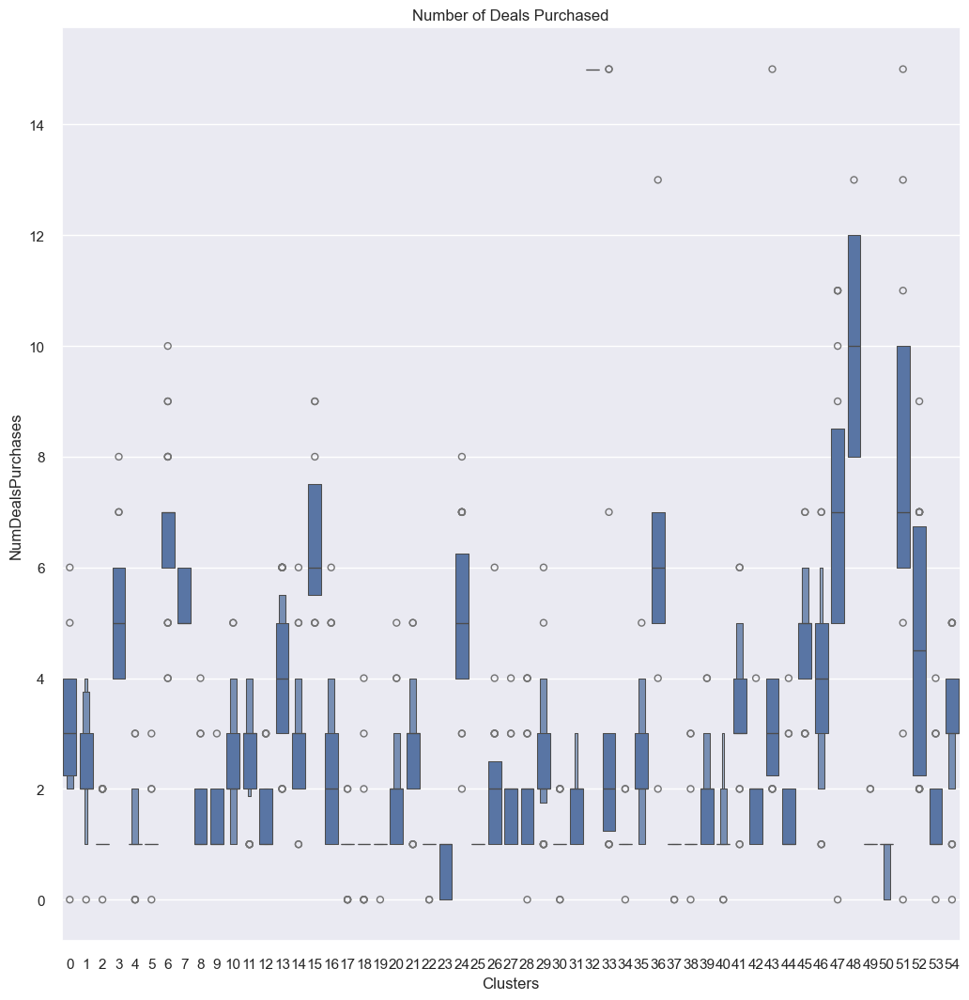

In [1304]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["NumDealsPurchases"],x=df["Clusters"])
pl.set_title("Number of Deals Purchased")
plt.show()

In [1305]:
from sklearn.cluster import Birch
#Initiating the Birch Clustering model 
BP = Birch(threshold=0.01, n_clusters=4)
# fit model and predict clusters
BP_df = BP.fit_predict(PCA_df)
PCA_df["Clusters"] = BP_df
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= BP_df

In [1582]:
sil_score = silhouette_score(PCA_df, BP_df)
print(f"Silhouette Score: {sil_score}")

Silhouette Score: -0.021040150751705653


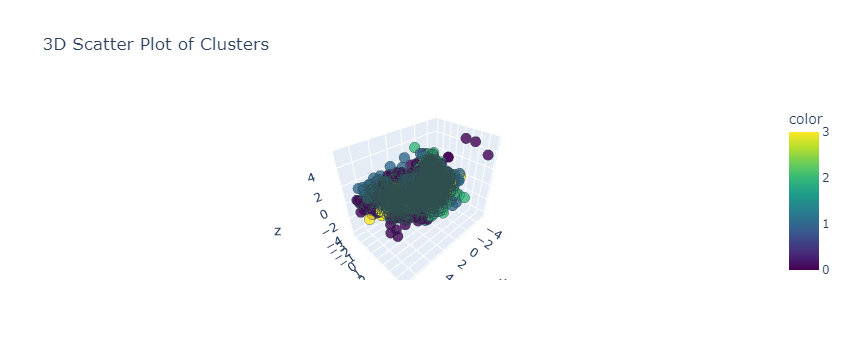

In [1566]:
fig = px.scatter_3d(df, 
                    x=x, 
                    y=y, 
                    z=z, 
                    color=BP_df, 
                    title="3D Scatter Plot of Clusters", 
                    color_continuous_scale='Viridis',  
                    opacity=0.8, 
                     
                    )  

fig.update_traces(marker=dict(size=6,  
                              line=dict(width=1, color='DarkSlateGrey')),  
                 selector=dict(mode='markers'))

fig.show()

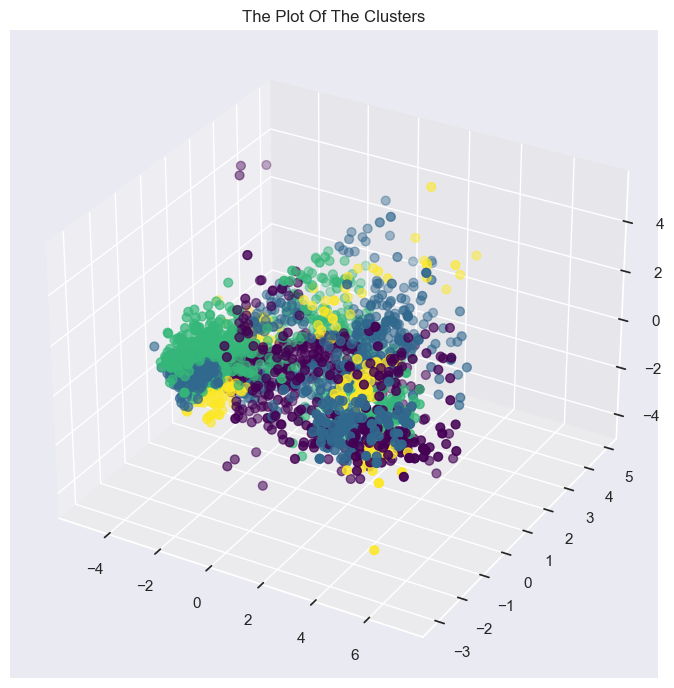

In [1306]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_df["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()

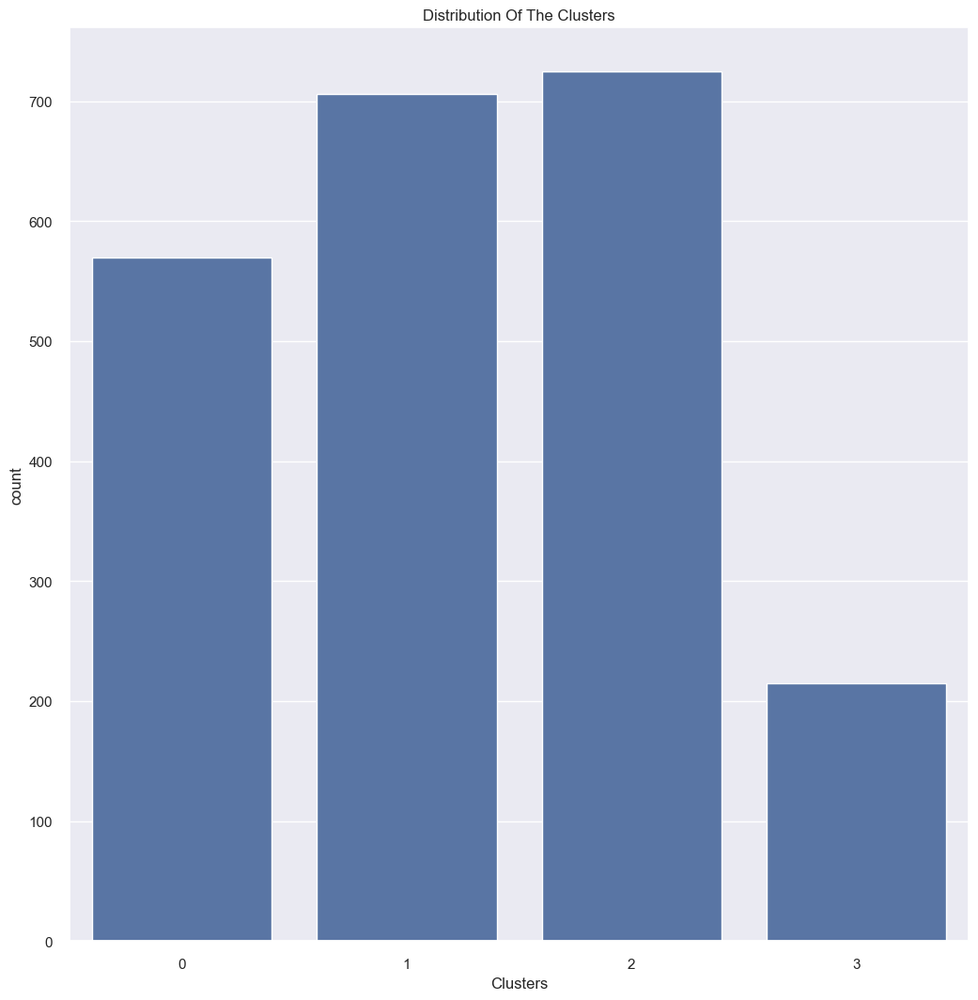

In [1307]:
#Plotting countplot of clusters
pl = sns.countplot(x=df["Clusters"])
pl.set_title("Distribution Of The Clusters")
plt.show()

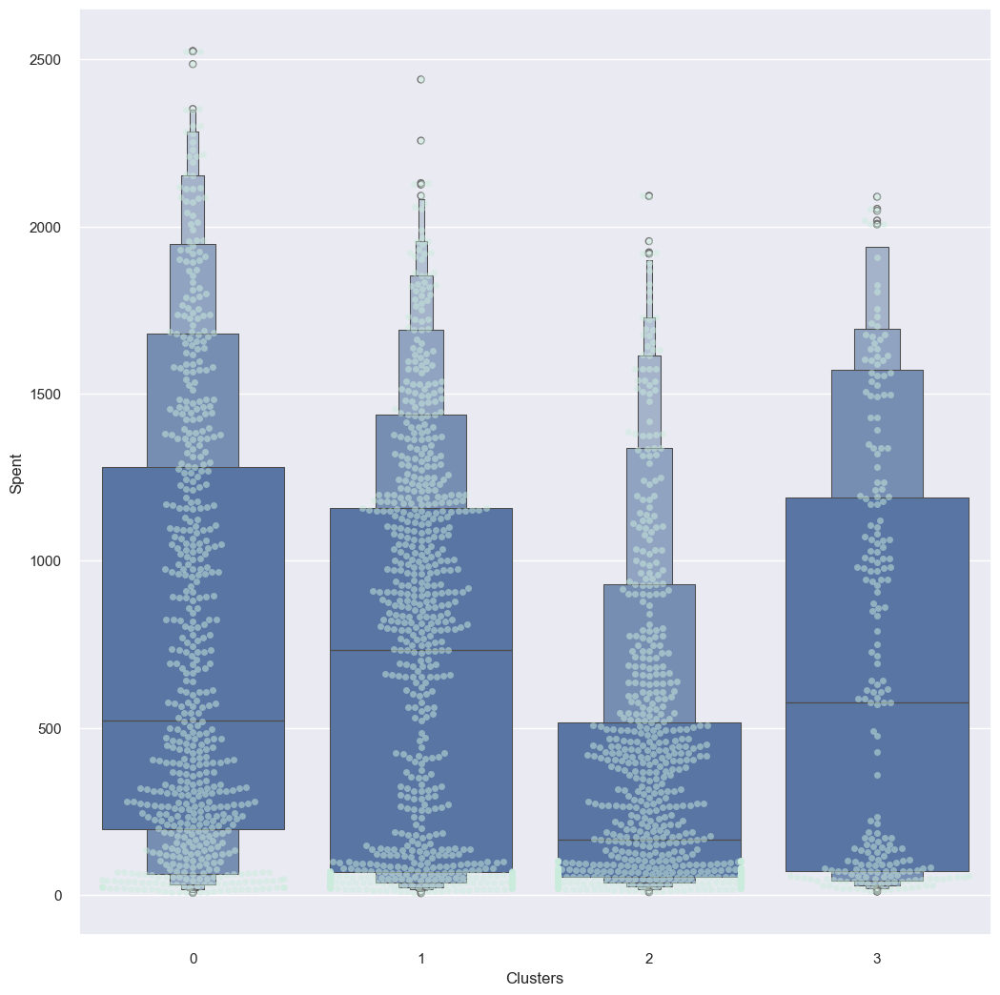

In [1308]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"])
plt.show()

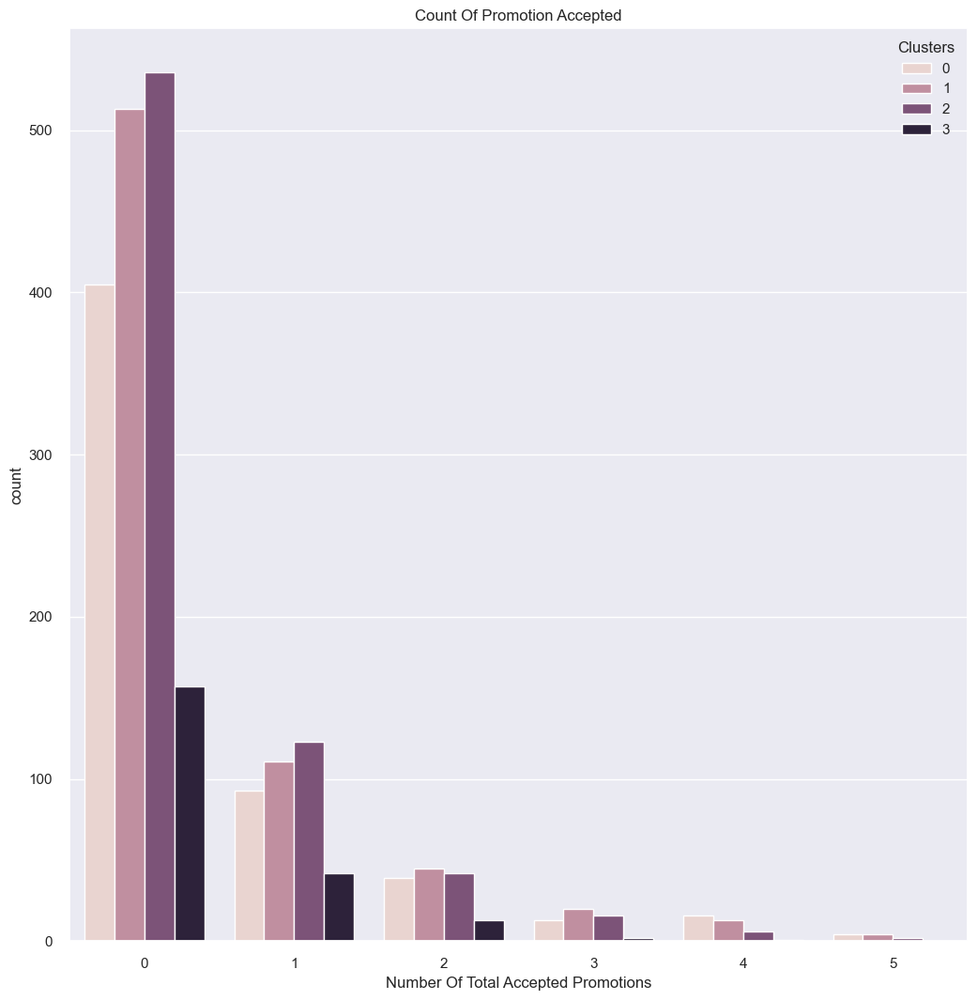

In [1309]:
#Creating a feature to get a sum of accepted promotions 
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=df["TotalAcceptedCmp"],hue=df["Clusters"])
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

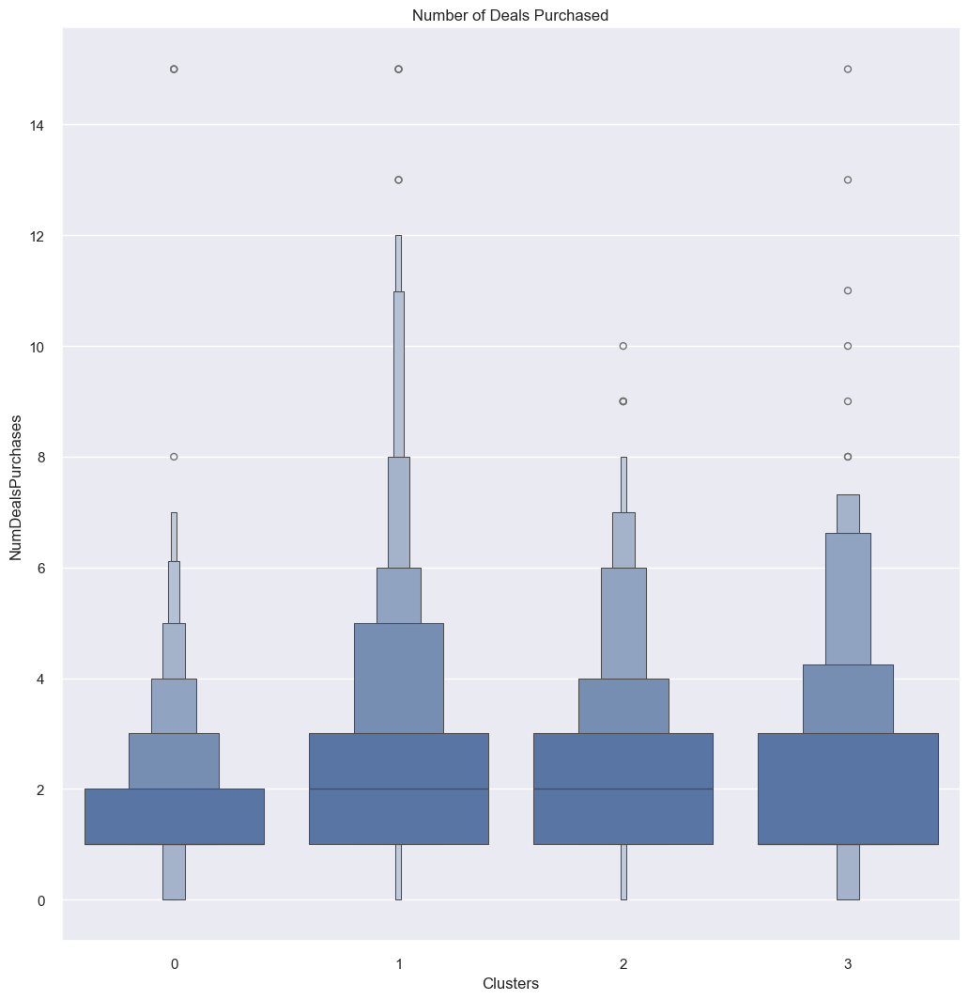

In [1310]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["NumDealsPurchases"],x=df["Clusters"])
pl.set_title("Number of Deals Purchased")
plt.show()

In [1311]:
#Initiating the BBSCAN Clustering model 
DP = DBSCAN(eps=0.30, min_samples=9)
# fit model and predict clusters
DP_df = DP.fit_predict(PCA_df)
PCA_df["Clusters"] = DP_df
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= DP_df

In [1584]:
sil_score = silhouette_score(PCA_df, DP_df)
print(f"Silhouette Score: {sil_score}")

Silhouette Score: -0.13686390150486372


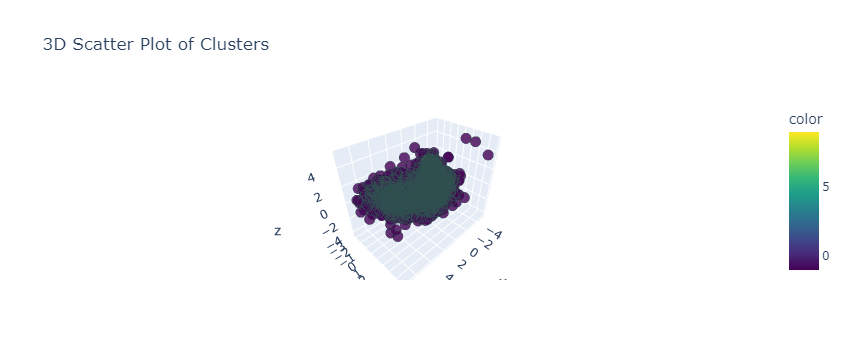

In [1564]:
fig = px.scatter_3d(df, 
                    x=x, 
                    y=y, 
                    z=z, 
                    color=DP_df, 
                    title="3D Scatter Plot of Clusters", 
                    color_continuous_scale='Viridis',  
                    opacity=0.8, 
                     
                    )  

fig.update_traces(marker=dict(size=6,  
                              line=dict(width=1, color='DarkSlateGrey')),  
                 selector=dict(mode='markers'))


# Grafiği göster
fig.show()

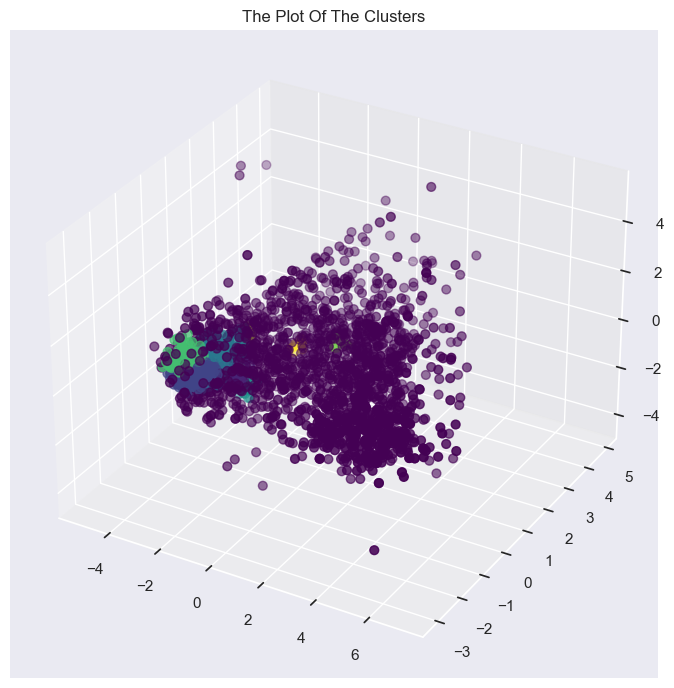

In [1312]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_df["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()

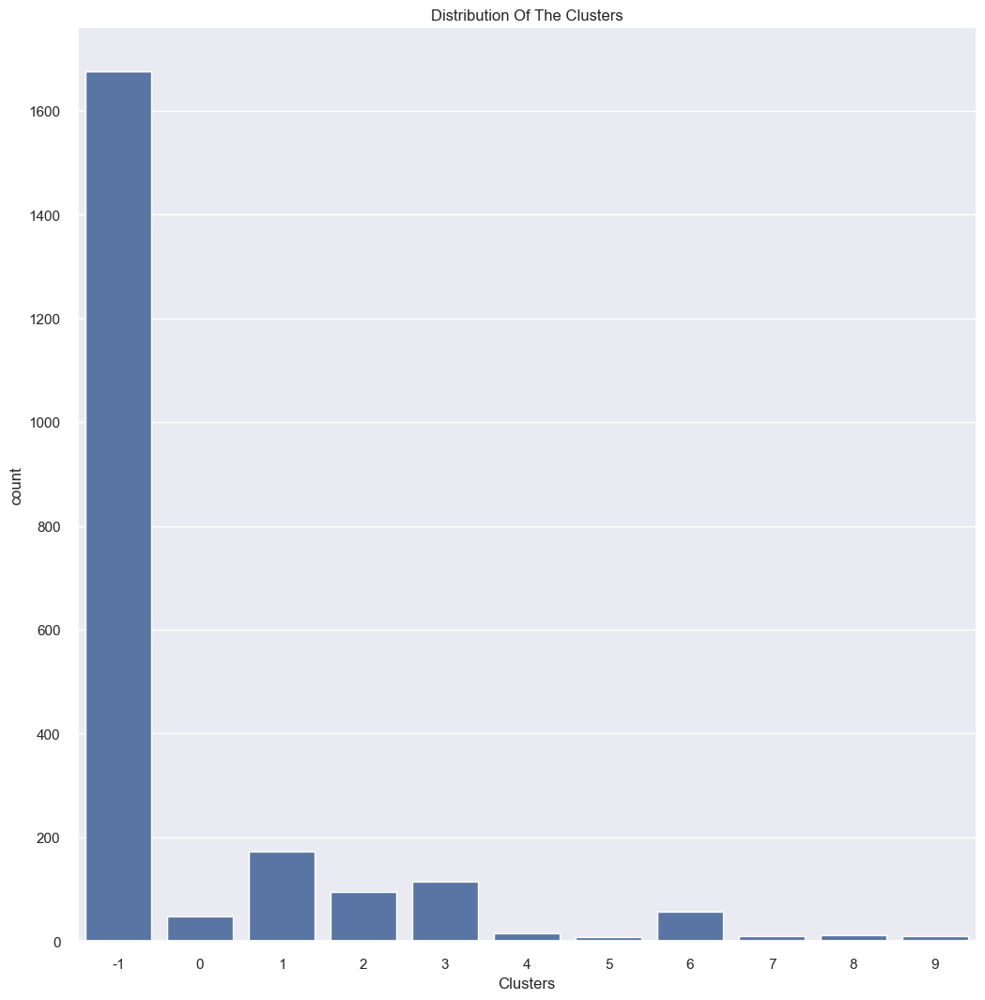

In [1313]:
#Plotting countplot of clusters
pl = sns.countplot(x=df["Clusters"])
pl.set_title("Distribution Of The Clusters")
plt.show()

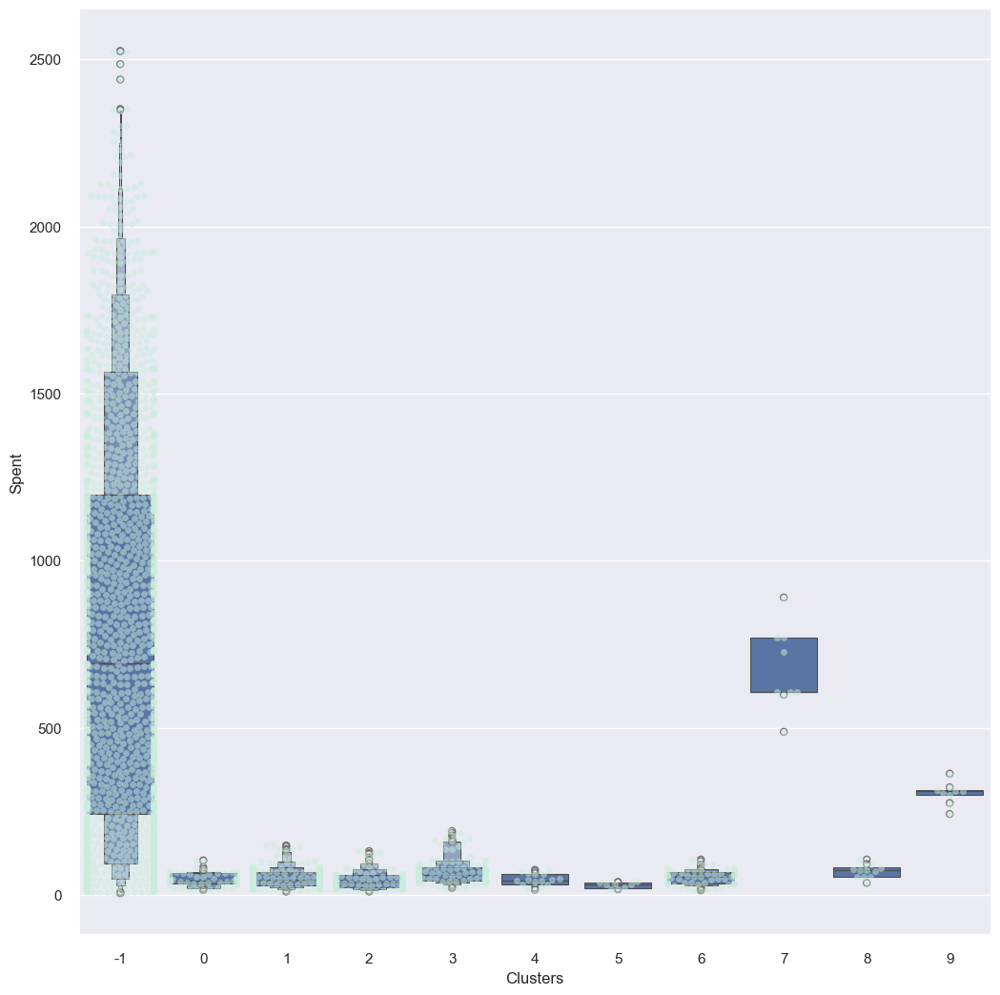

In [1314]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"])
plt.show()


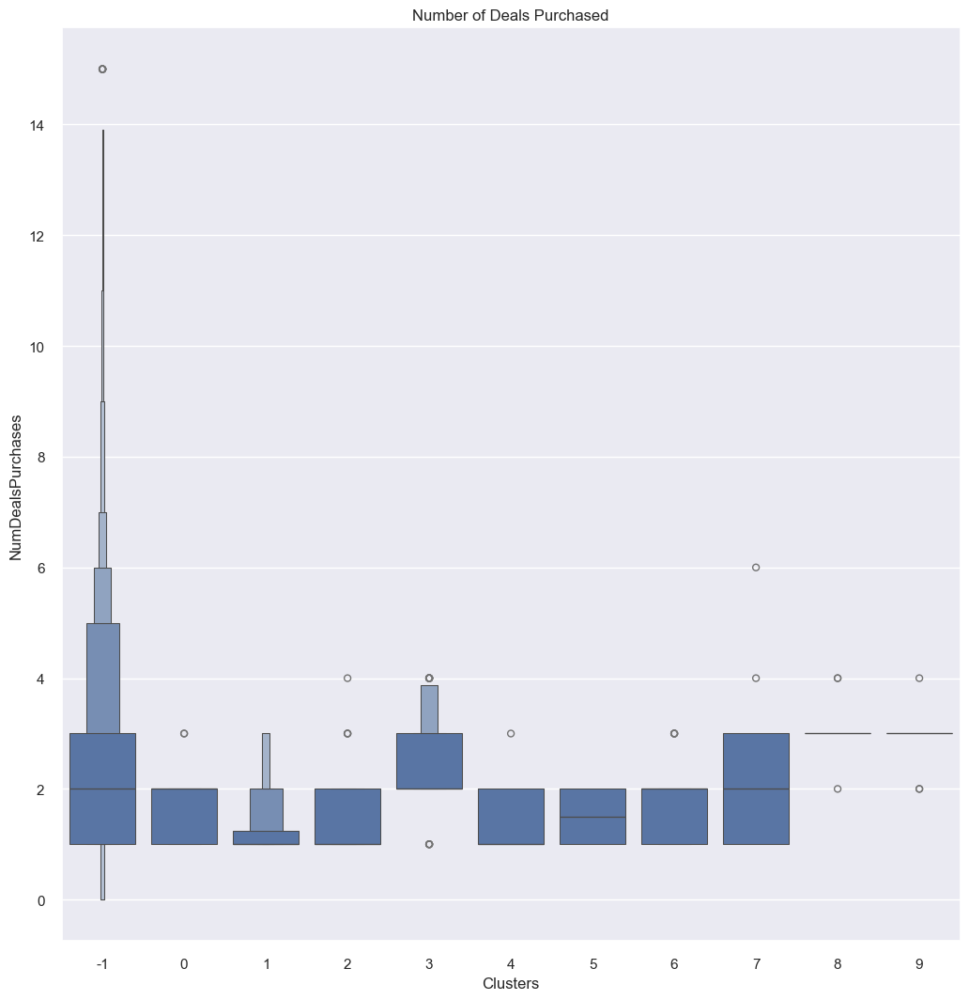

In [1315]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["NumDealsPurchases"],x=df["Clusters"])
pl.set_title("Number of Deals Purchased")
plt.show()

In [1316]:
#Initiating the MiniBatchKMeans Clustering model 
MP = MiniBatchKMeans(n_clusters=4)
# fit model and predict clusters
MP_df = MP.fit_predict(PCA_df)
PCA_df["Clusters"] = MP_df
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= MP_df

In [1586]:
sil_score = silhouette_score(PCA_df, MP_df)
print(f"Silhouette Score: {sil_score}")

Silhouette Score: 0.2519960469502776


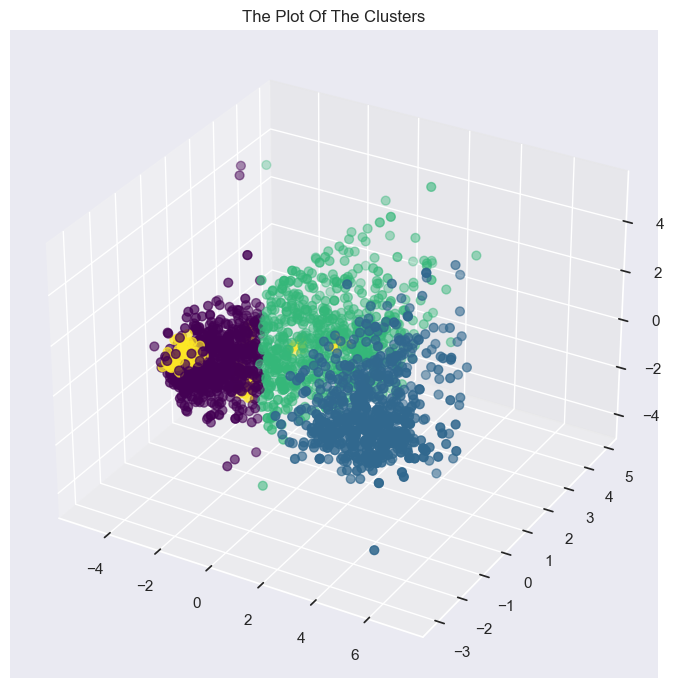

In [1317]:
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_df["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()

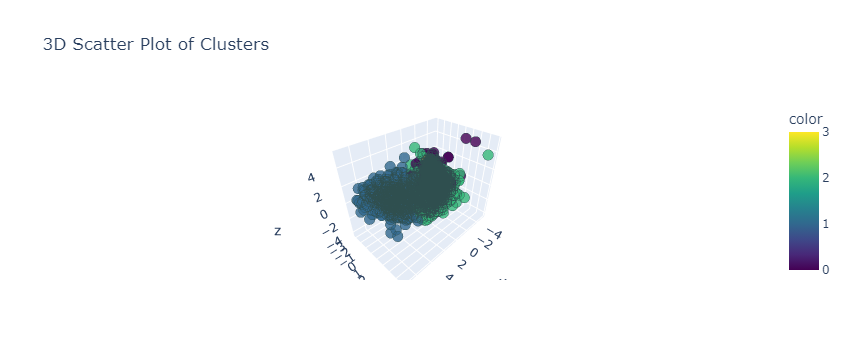

In [1562]:
fig = px.scatter_3d(df, 
                    x=x, 
                    y=y, 
                    z=z, 
                    color=MP_df, 
                    title="3D Scatter Plot of Clusters", 
                    color_continuous_scale='Viridis',  
                    opacity=0.8, 
                     
                    )  

fig.update_traces(marker=dict(size=6,  
                              line=dict(width=1, color='DarkSlateGrey')),  
                 selector=dict(mode='markers'))


# Grafiği göster
fig.show()

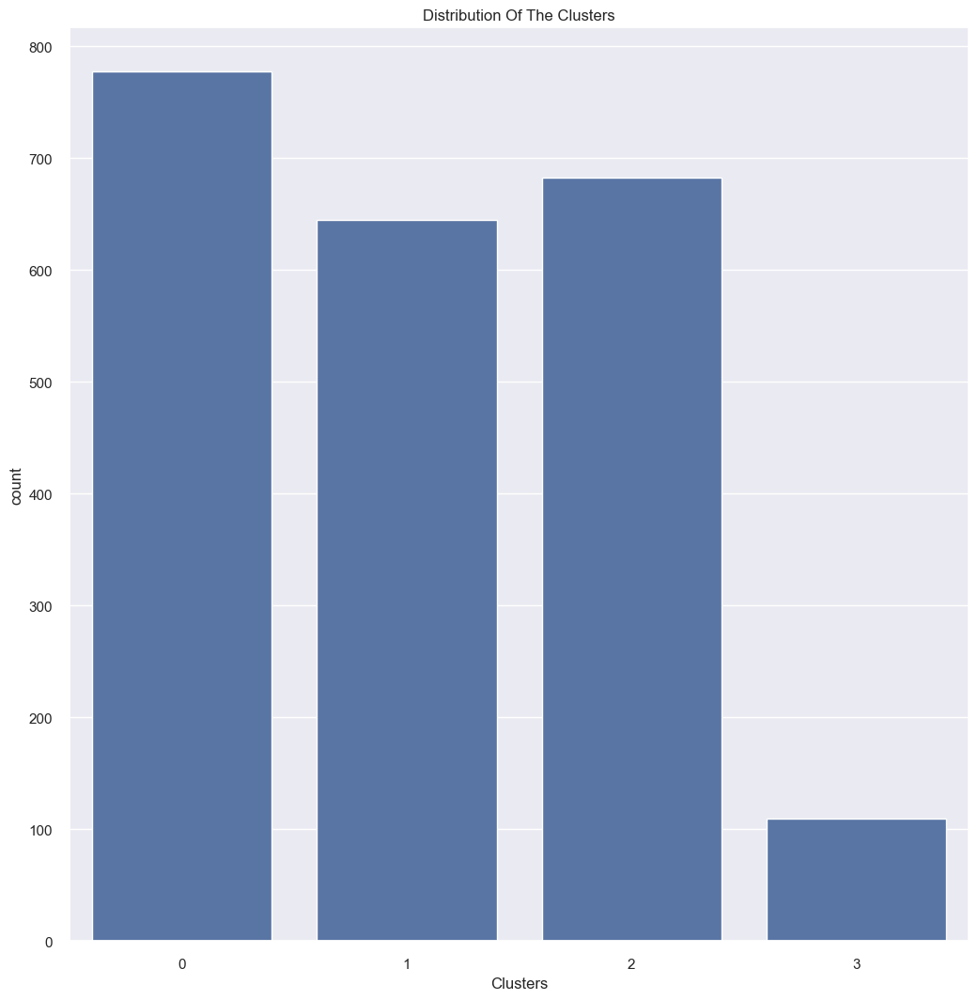

In [1318]:
#Plotting countplot of clusters
pl = sns.countplot(x=df["Clusters"])
pl.set_title("Distribution Of The Clusters")
plt.show()

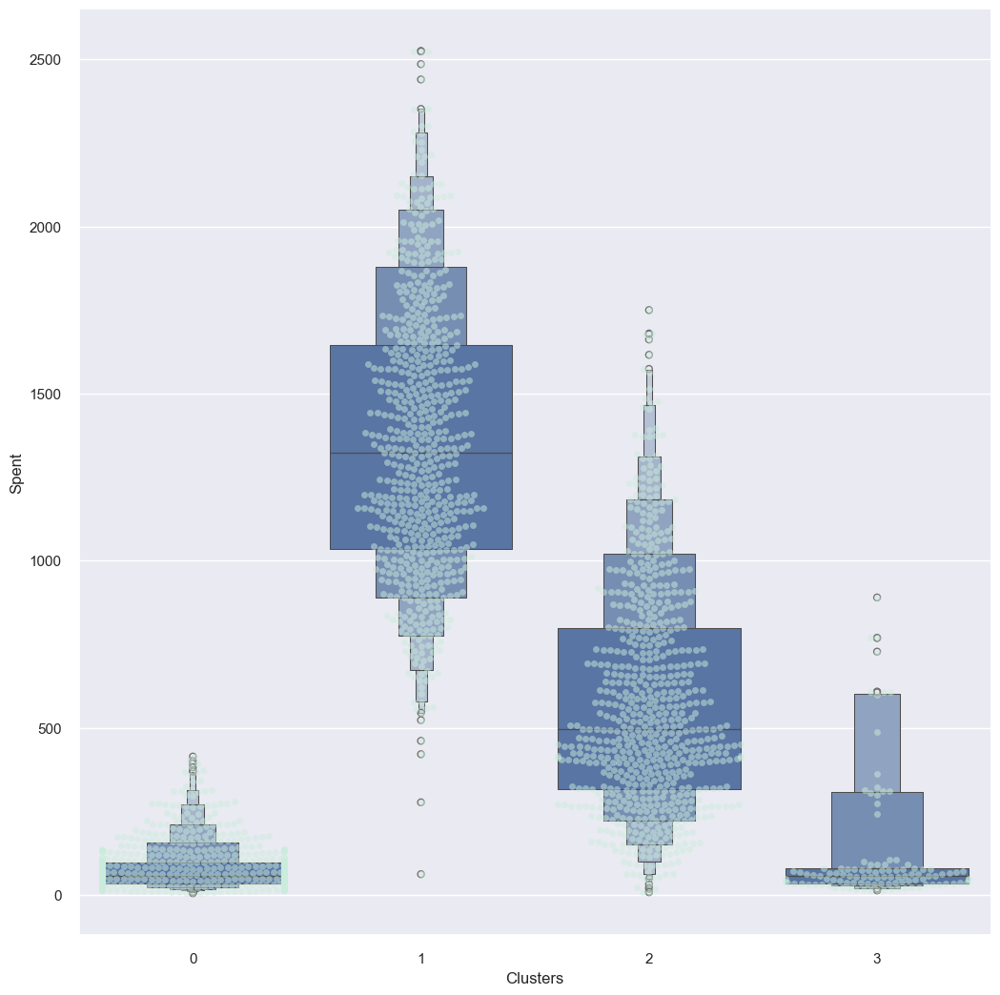

In [1319]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"])
plt.show()

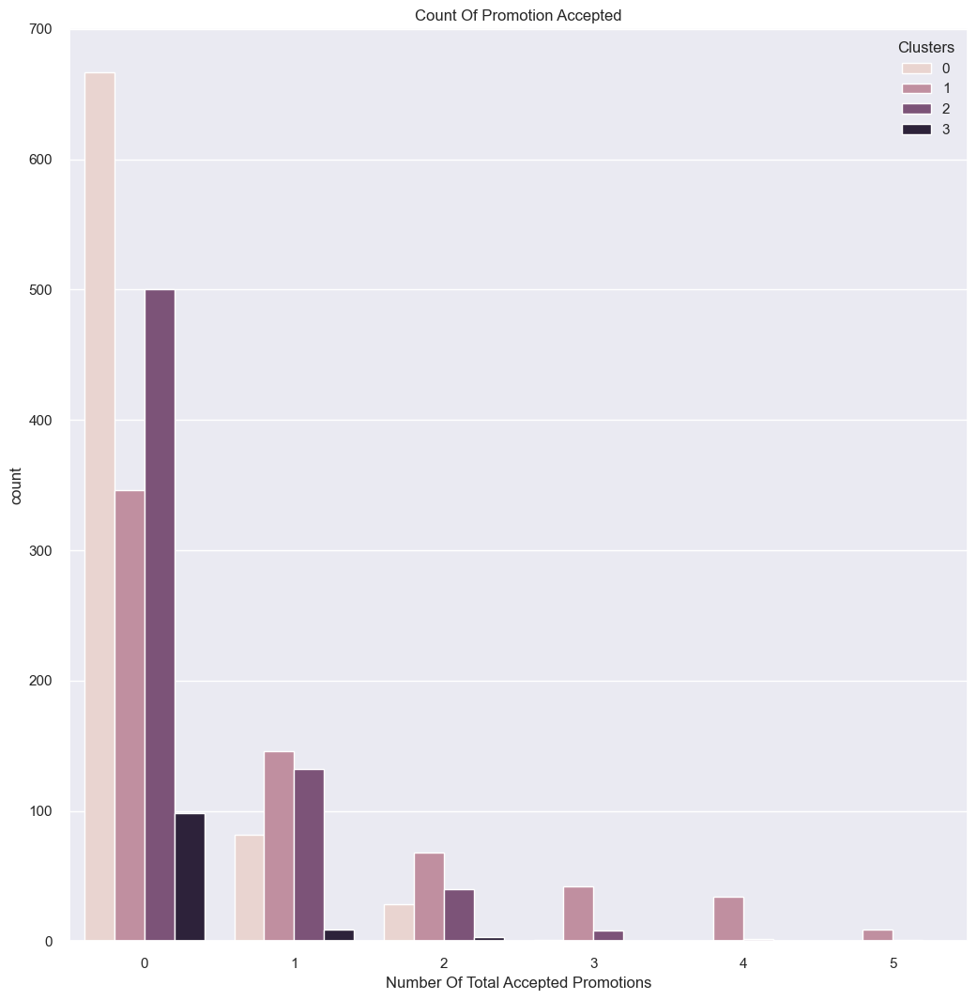

In [1320]:
#Creating a feature to get a sum of accepted promotions 
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=df["TotalAcceptedCmp"],hue=df["Clusters"])
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

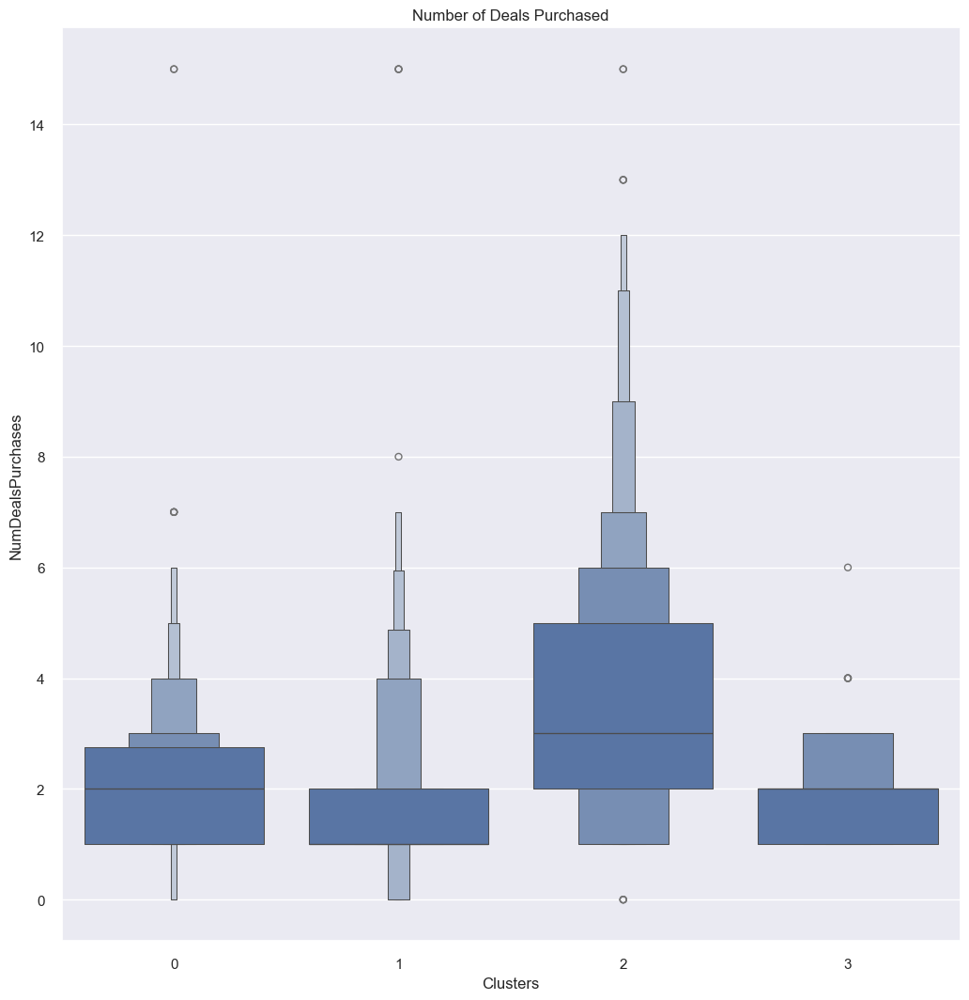

In [1321]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["NumDealsPurchases"],x=df["Clusters"])
pl.set_title("Number of Deals Purchased")
plt.show()

In [1322]:
#Initiating the MeanShift Clustering model 
MSP = MeanShift()
# fit model and predict clusters
MSP_df = MSP.fit_predict(PCA_df)
PCA_df["Clusters"] = MSP_df
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= MSP_df

In [1588]:
sil_score = silhouette_score(PCA_df, MSP_df)
print(f"Silhouette Score: {sil_score}")

Silhouette Score: 0.40466784737308903


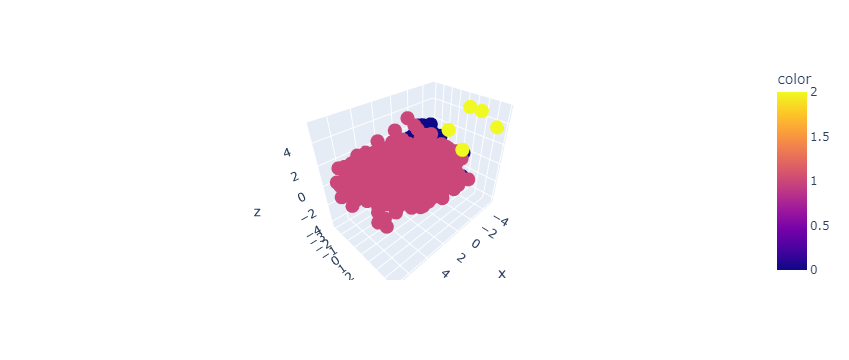

In [1524]:
fig = px.scatter_3d(df, x, y, z, color=MSP_df)
fig.show()

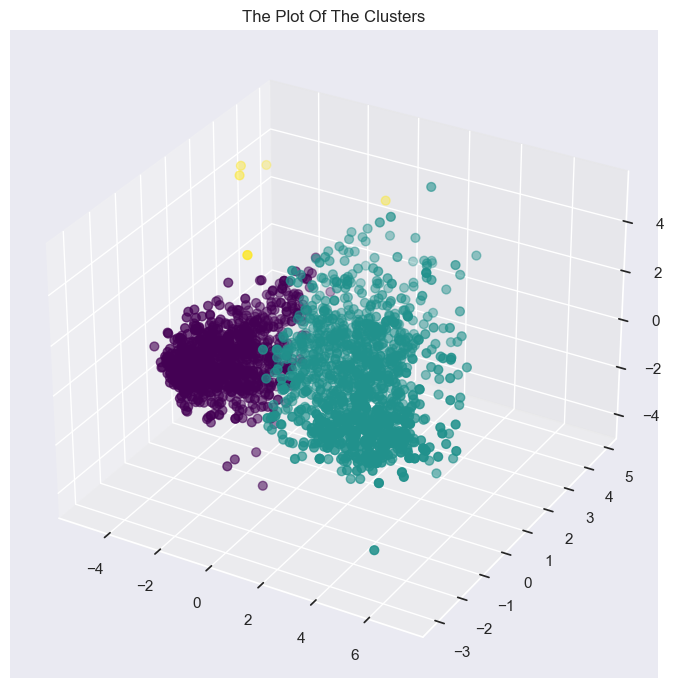

In [1323]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_df["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()

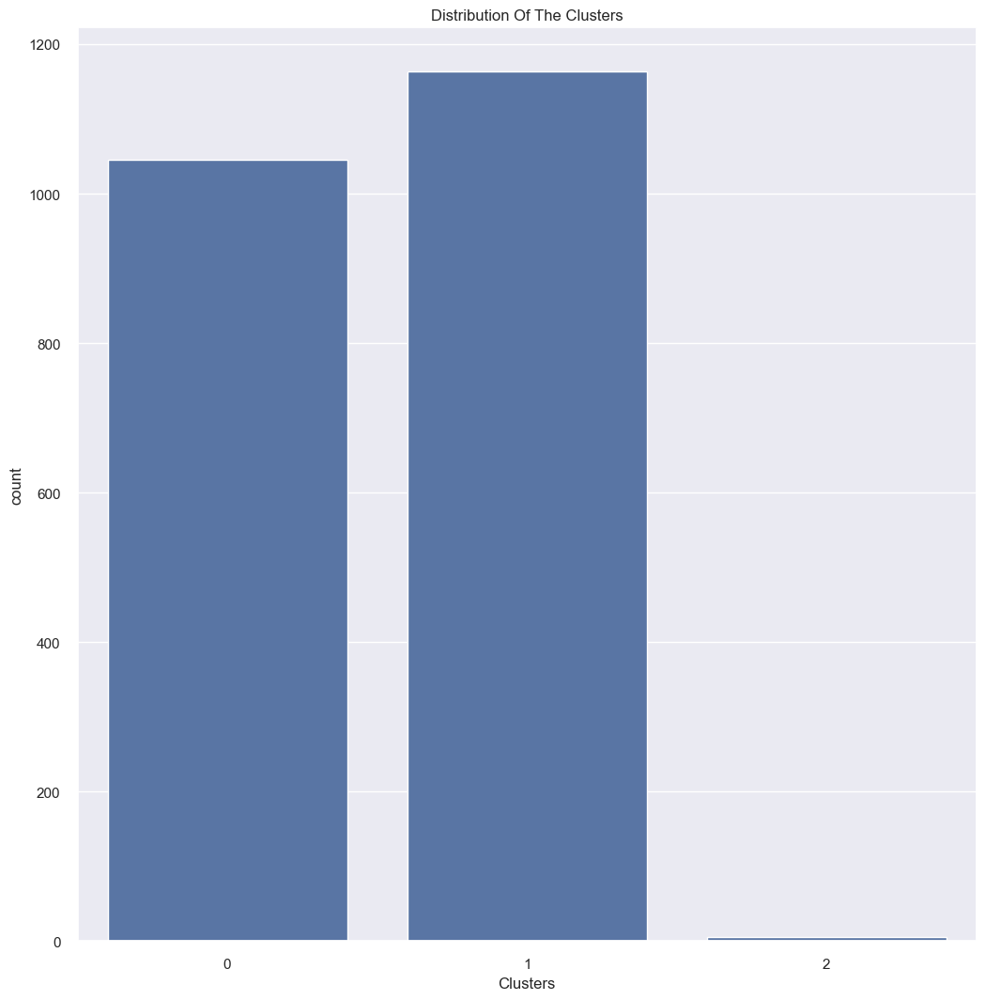

In [1324]:
#Plotting countplot of clusters
pl = sns.countplot(x=df["Clusters"])
pl.set_title("Distribution Of The Clusters")
plt.show()

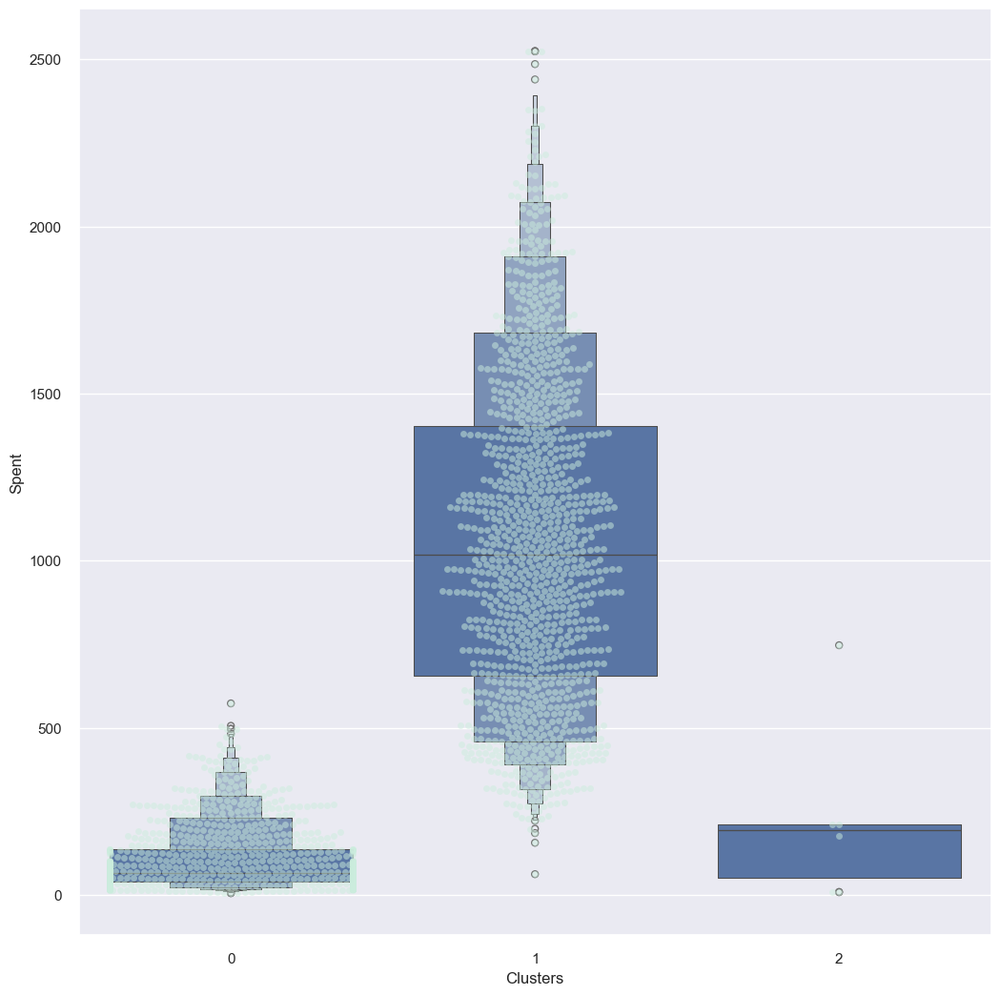

In [1325]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"])
plt.show()

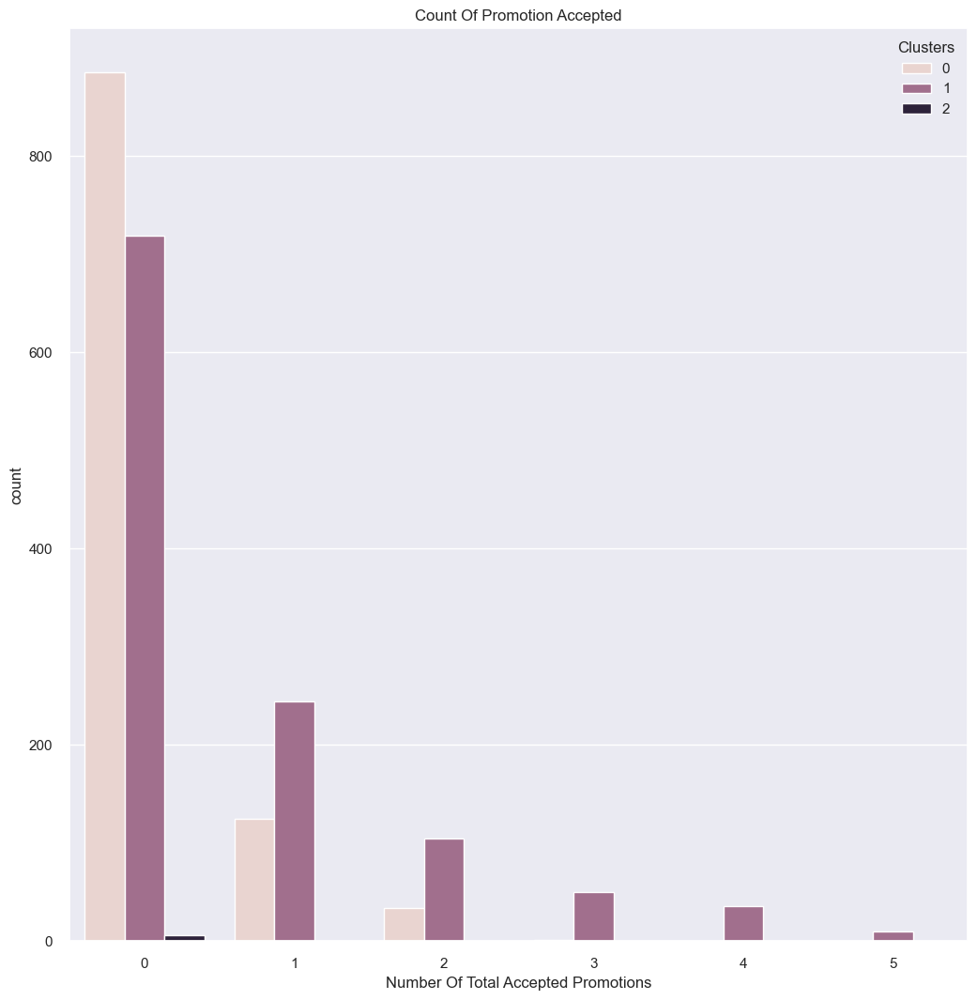

In [1326]:
#Creating a feature to get a sum of accepted promotions 
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=df["TotalAcceptedCmp"],hue=df["Clusters"])
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

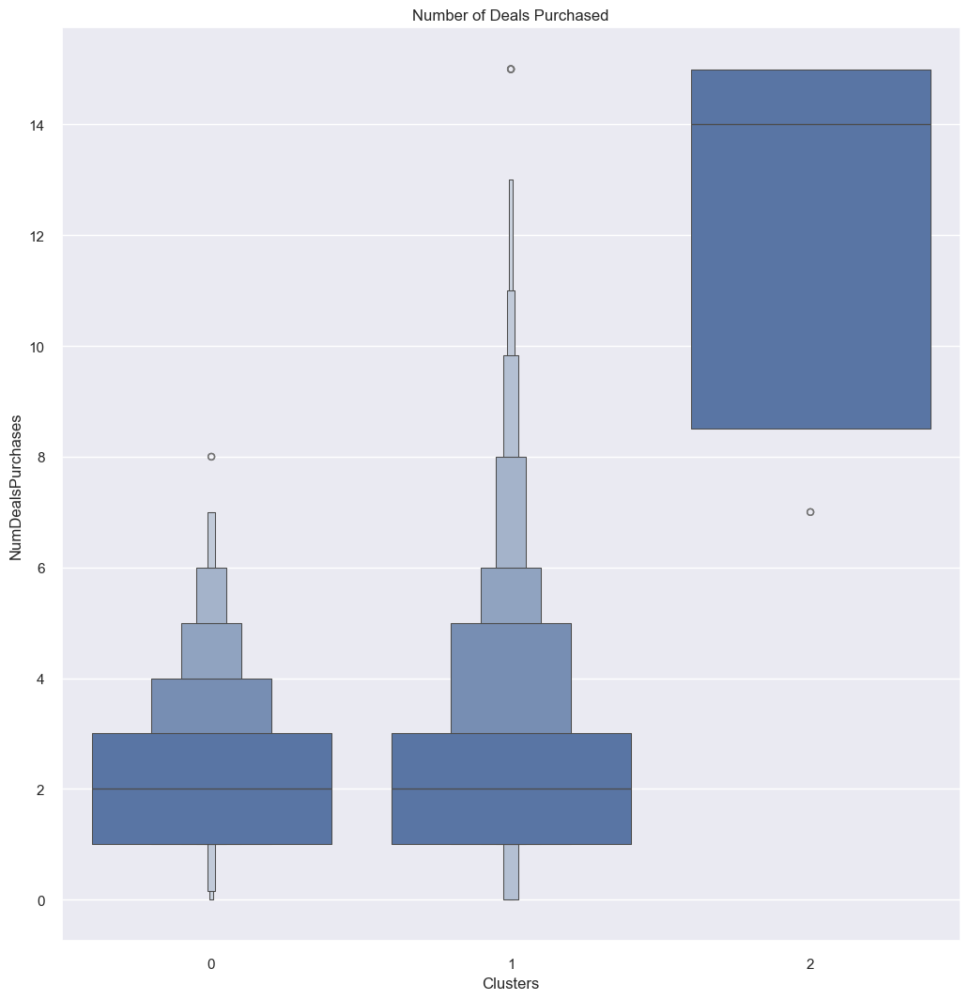

In [1327]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["NumDealsPurchases"],x=df["Clusters"])
pl.set_title("Number of Deals Purchased")
plt.show()

In [1328]:
from sklearn.cluster import OPTICS
#Initiating the OPTICS Clustering model 
OP = OPTICS(eps=0.8, min_samples=10)
# fit model and predict clusters
OP_df = OP.fit_predict(PCA_df)
PCA_df["Clusters"] = OP_df
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= OP_df

In [1590]:
sil_score = silhouette_score(PCA_df, OP_df)
print(f"Silhouette Score: {sil_score}")

Silhouette Score: -0.4004455886661572


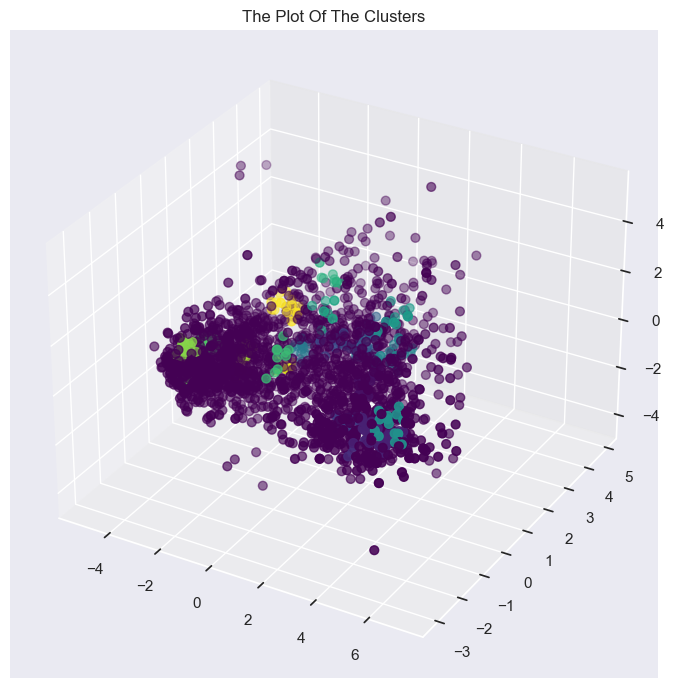

In [1329]:
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_df["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()

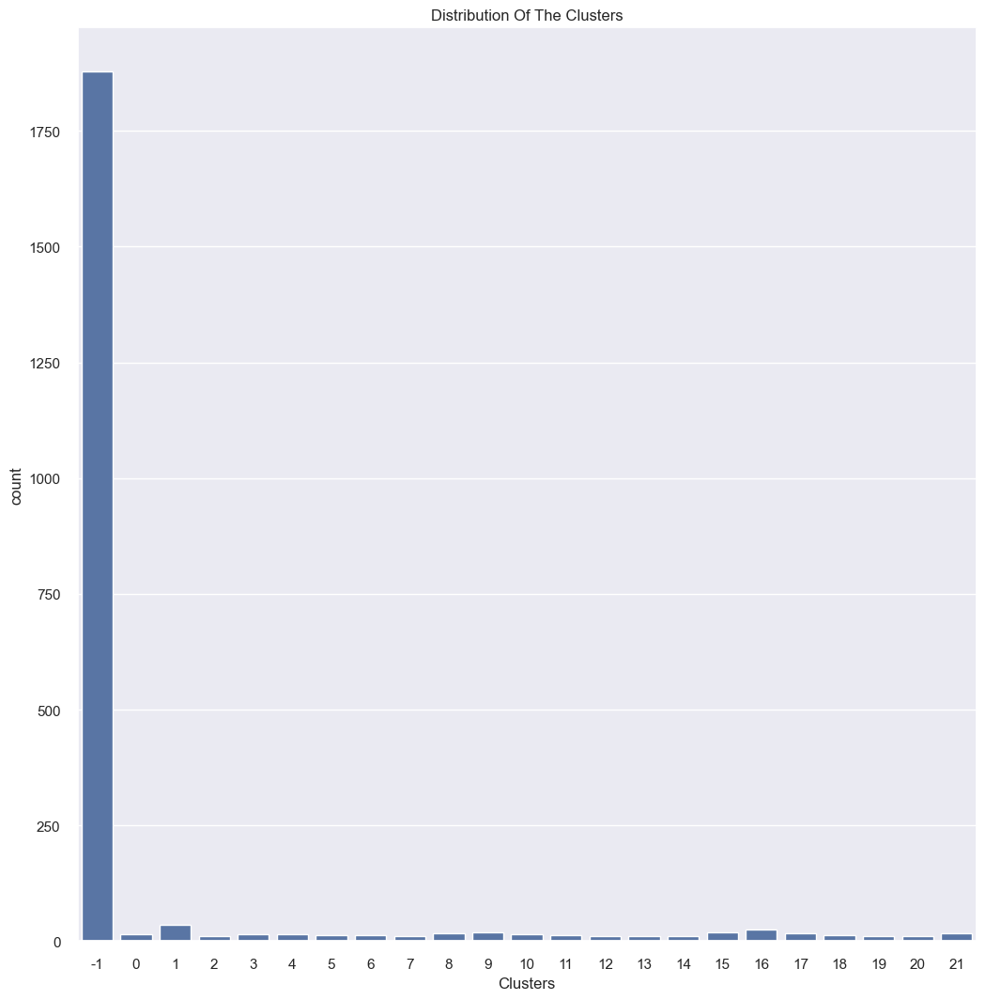

In [1330]:
#Plotting countplot of clusters
pl = sns.countplot(x=df["Clusters"])
pl.set_title("Distribution Of The Clusters")
plt.show()

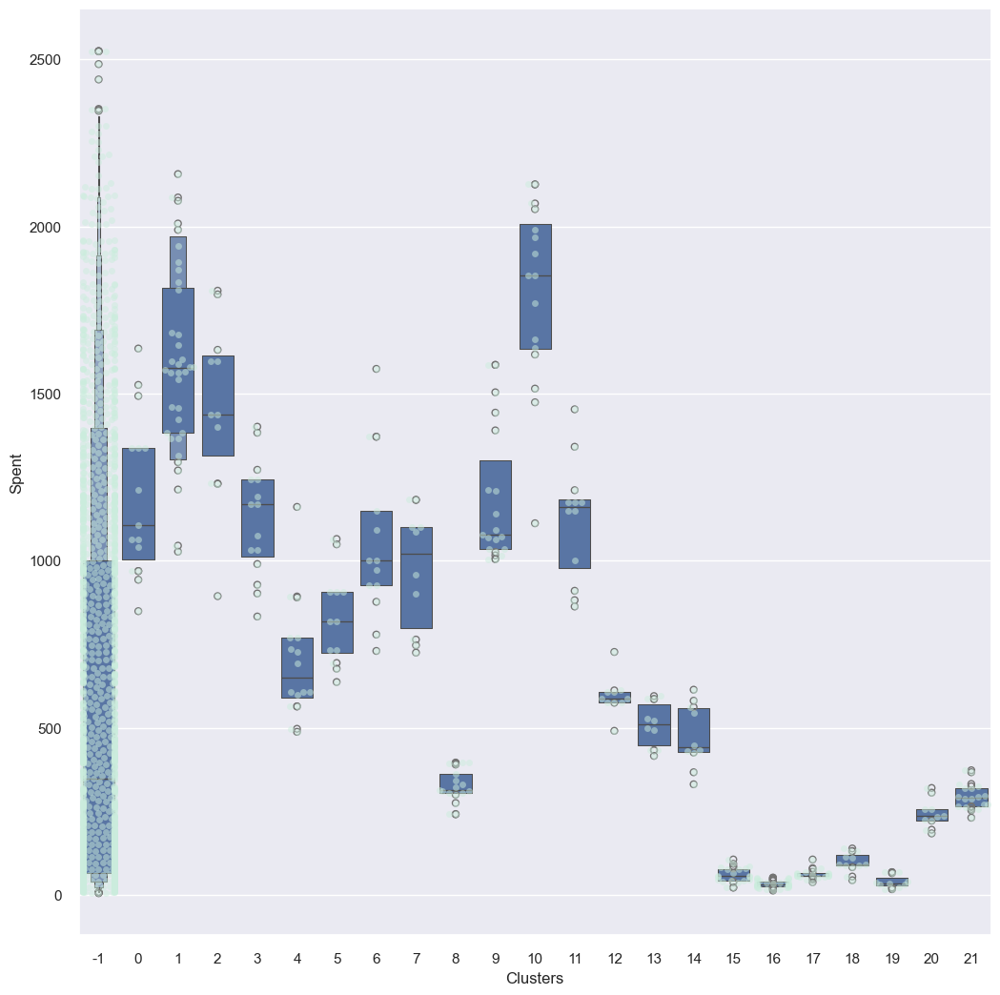

In [1331]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"])
plt.show()

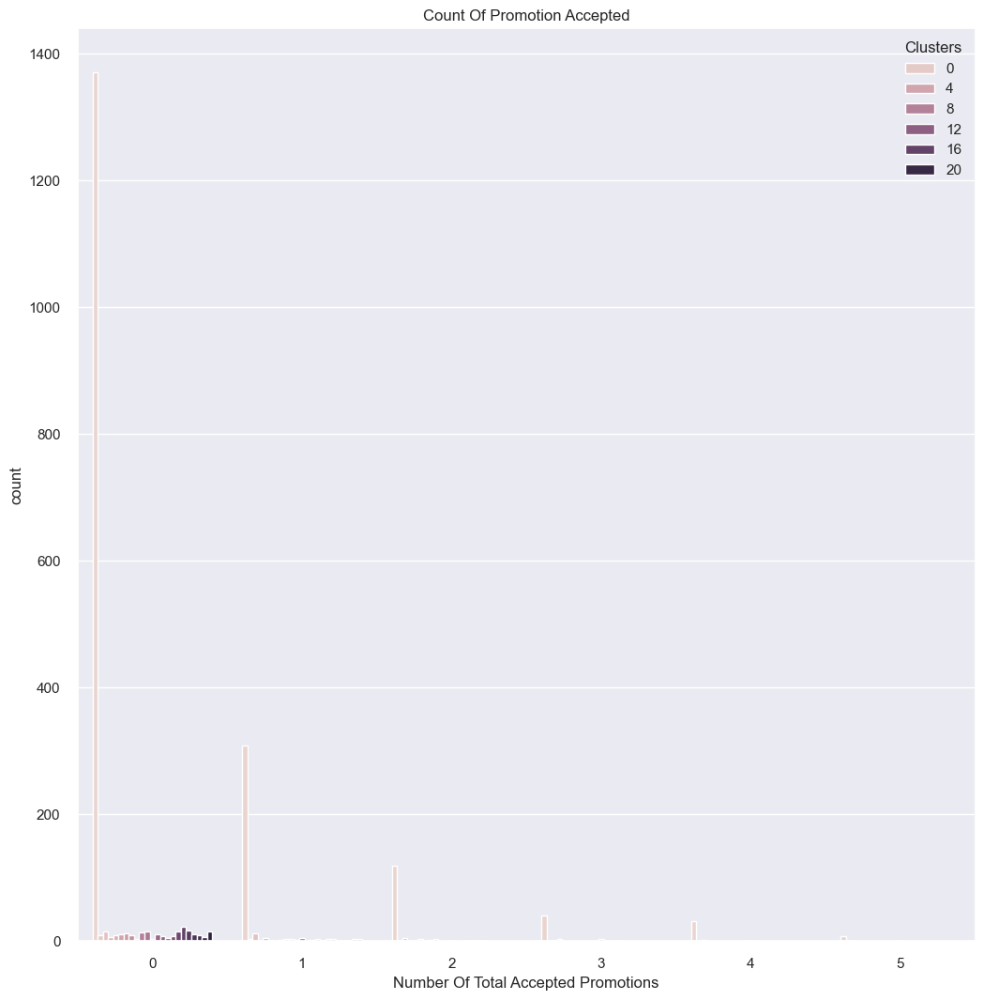

In [1332]:
#Creating a feature to get a sum of accepted promotions 
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=df["TotalAcceptedCmp"],hue=df["Clusters"])
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

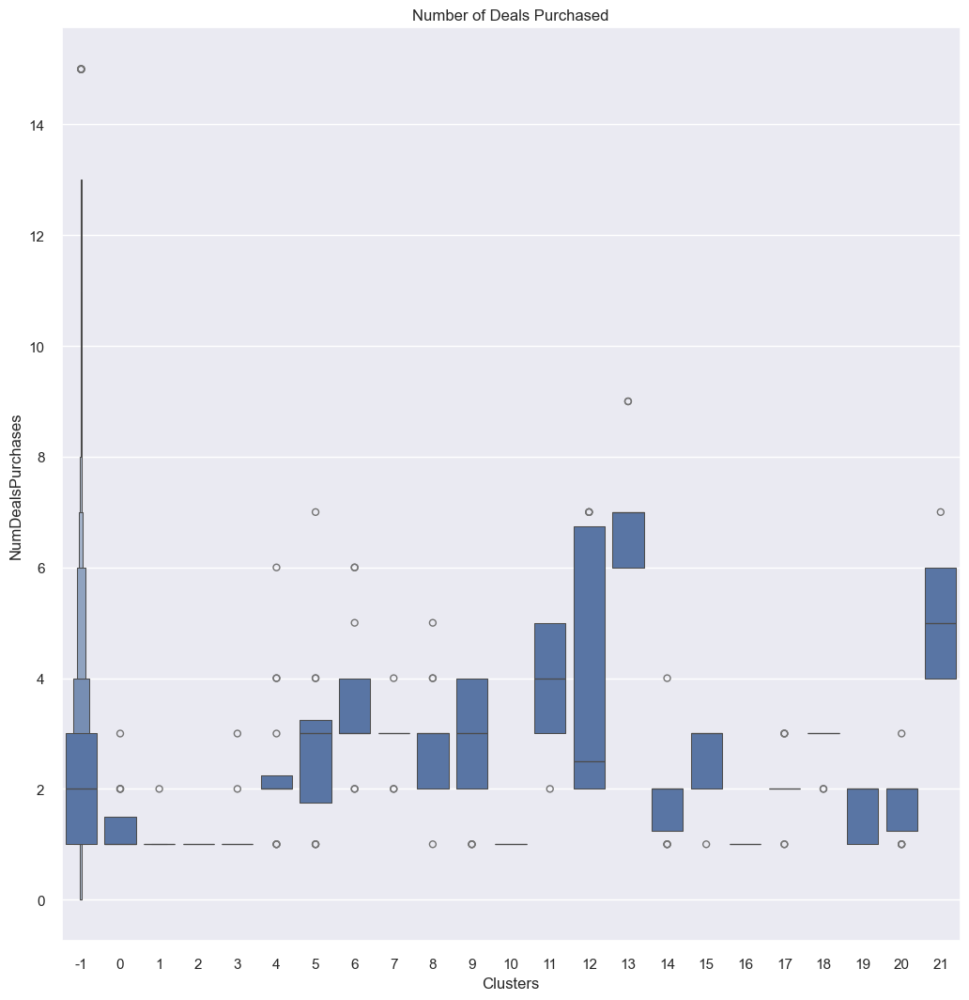

In [1333]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["NumDealsPurchases"],x=df["Clusters"])
pl.set_title("Number of Deals Purchased")
plt.show()

In [1334]:
df


,Age,Education,Marital_Status,Income,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Spent,TotalAcceptedCmp,Children,Family_Size,Is_Parents,Clusters
0,59,2,0,58138.0,58,3,8,10,4,7,0,1617,1,0,1,0,-1
1,62,2,0,46344.0,38,2,1,1,2,5,0,27,0,2,3,1,-1
2,51,2,1,71613.0,26,1,8,2,10,4,0,776,0,0,2,0,-1
3,32,2,1,26646.0,26,2,2,0,4,6,0,53,0,1,3,1,-1
4,35,4,1,58293.0,94,5,5,3,6,5,0,422,0,1,3,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,49,2,1,61223.0,46,2,9,3,4,5,0,1341,0,1,3,1,11
2236,70,4,1,64014.0,56,7,8,2,5,7,0,444,1,3,5,1,-1
2237,35,2,0,56981.0,91,1,2,3,13,6,0,1241,1,0,1,0,-1
2238,60,3,1,69245.0,8,2,6,5,10,3,0,843,0,1,3,1,-1


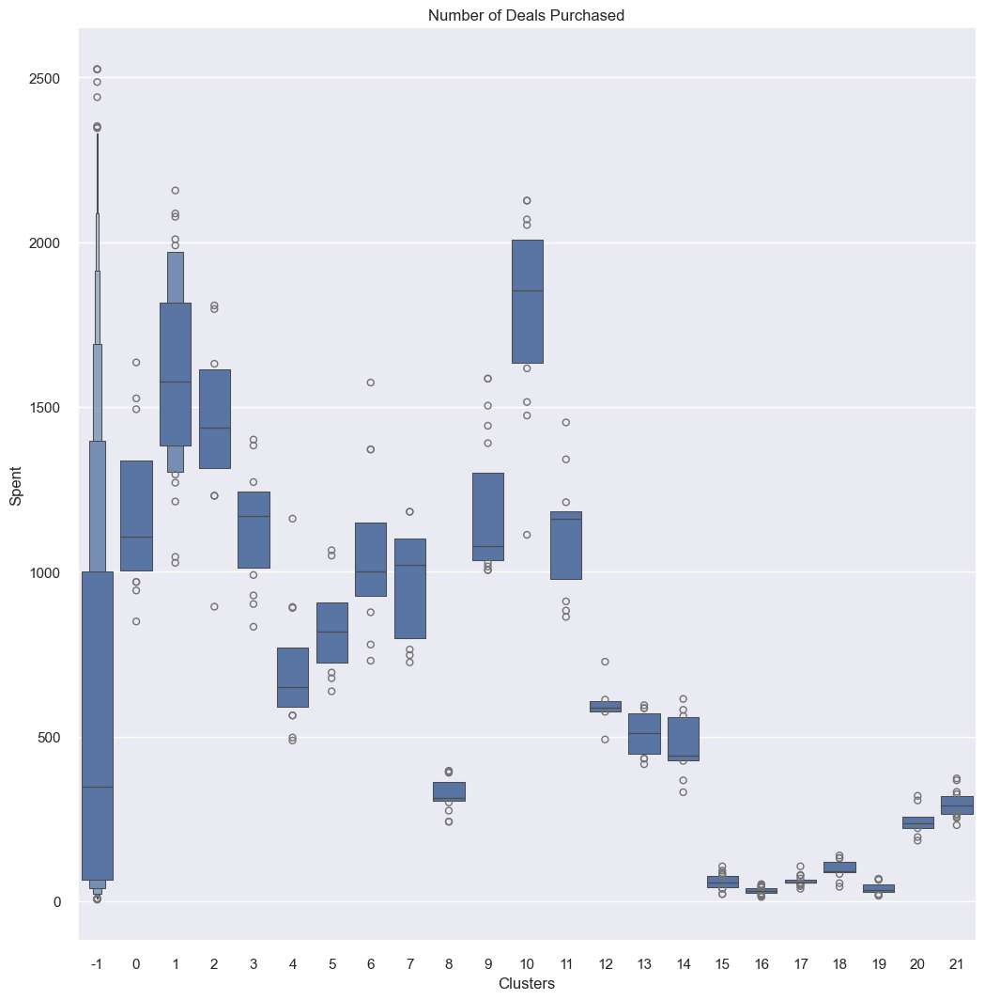

In [1335]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["Spent"],x=df["Clusters"])
pl.set_title("Number of Deals Purchased")
plt.show()

In [1336]:
#Initiating the SpectralClustering Clustering model 
SP = SpectralClustering(n_clusters=4)
# fit model and predict clusters
SP_df = SP.fit_predict(PCA_df)
PCA_df["Clusters"] = SP_df
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= SP_df

In [1592]:
sil_score = silhouette_score(PCA_df, SP_df)
print(f"Silhouette Score: {sil_score}")

Silhouette Score: -0.1509617959500903


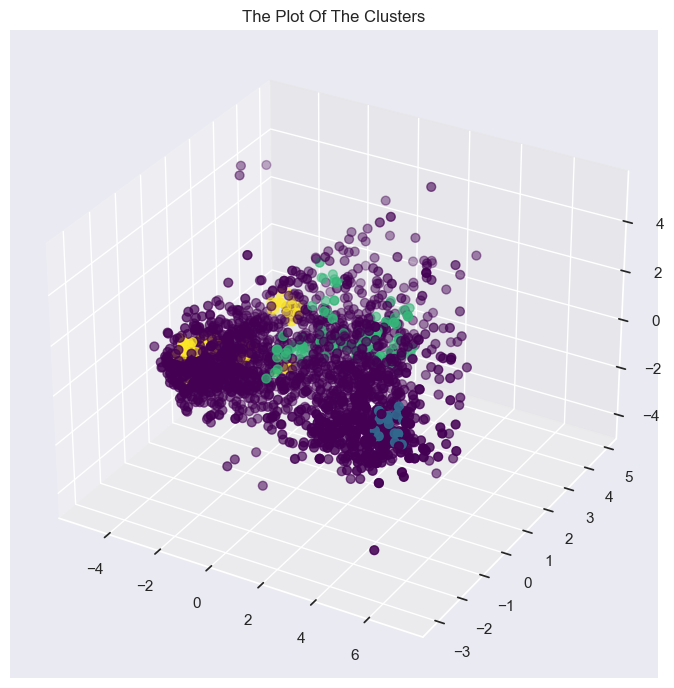

In [1337]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_df["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()

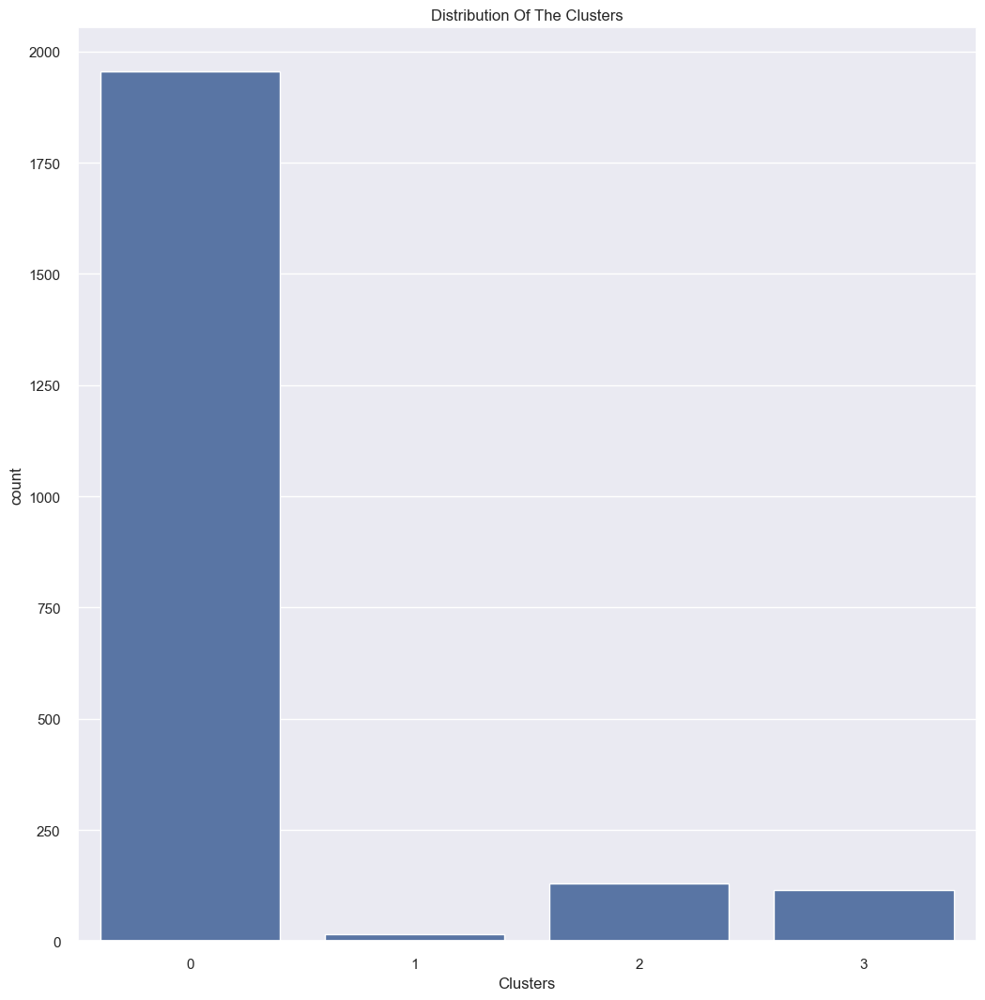

In [1338]:
#Plotting countplot of clusters
pl = sns.countplot(x=df["Clusters"])
pl.set_title("Distribution Of The Clusters")
plt.show()

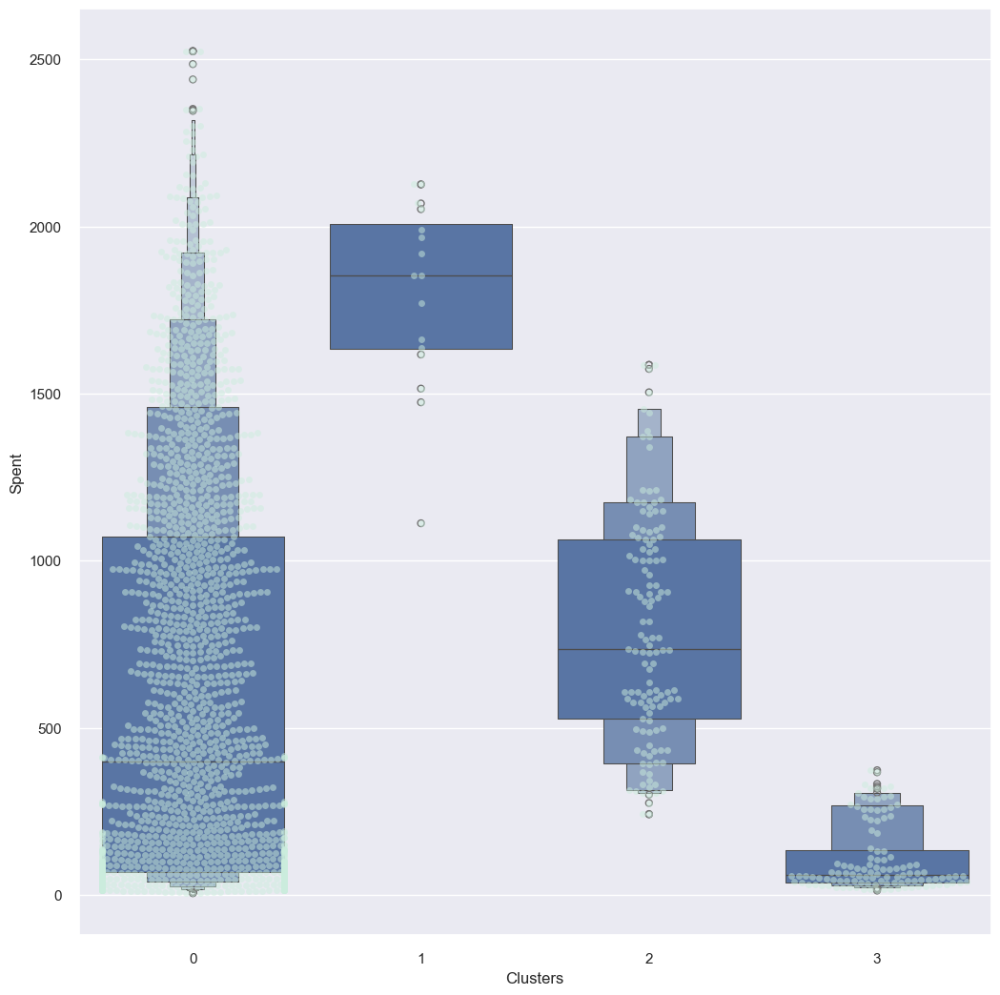

In [1339]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"])
plt.show()

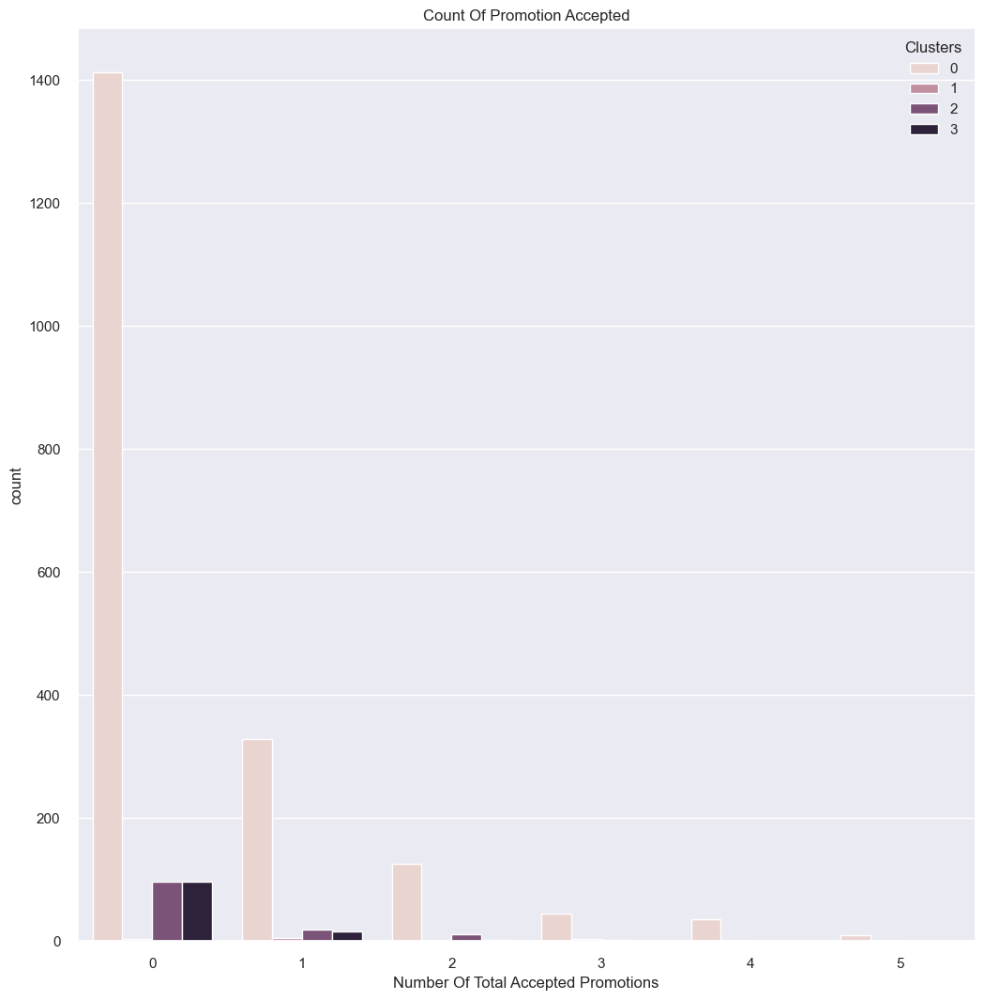

In [1340]:
#Creating a feature to get a sum of accepted promotions 
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=df["TotalAcceptedCmp"],hue=df["Clusters"])
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

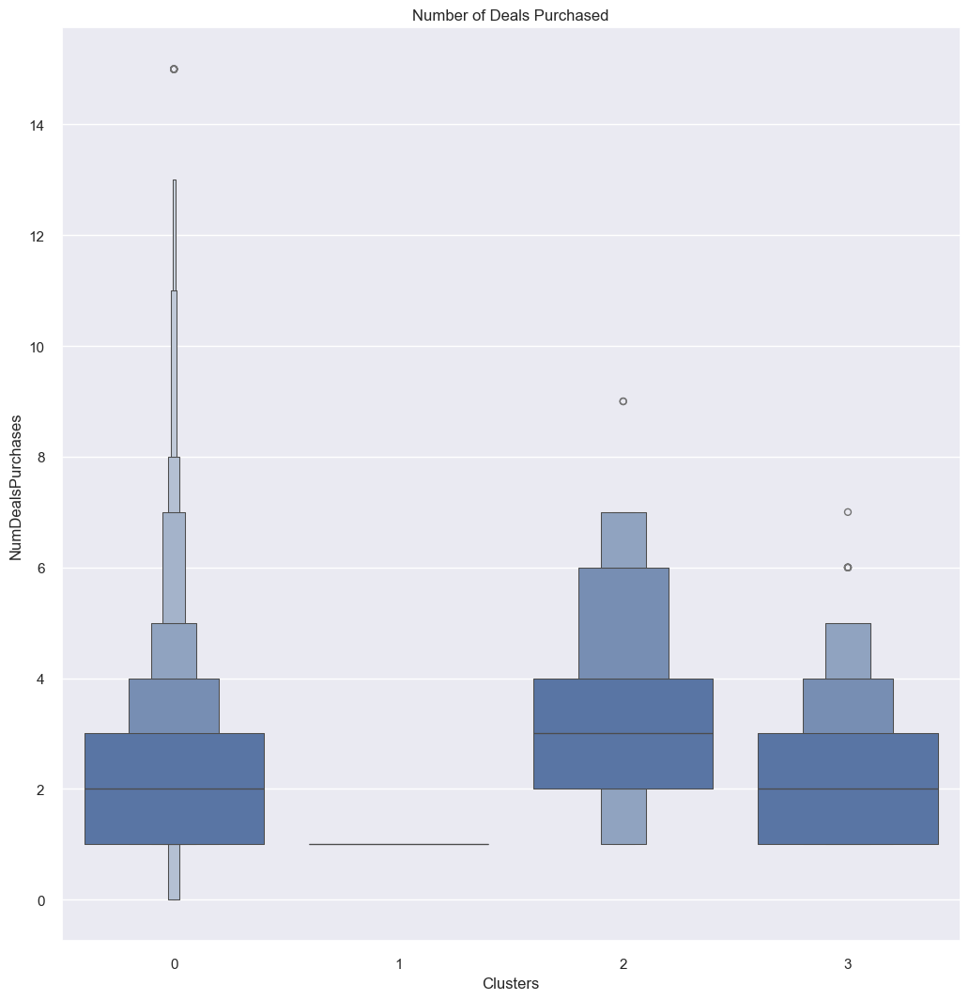

In [1341]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["NumDealsPurchases"],x=df["Clusters"])
pl.set_title("Number of Deals Purchased")
plt.show()

In [1342]:
#Initiating the GaussianMixture Clustering model 
GP = GaussianMixture(n_components=4)
# fit model and predict clusters
GP_df = GP.fit_predict(PCA_df)
PCA_df["Clusters"] = GP_df
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= GP_df

In [1594]:
sil_score = silhouette_score(PCA_df, GP_df)
print(f"Silhouette Score: {sil_score}")

Silhouette Score: -0.1576362595526753


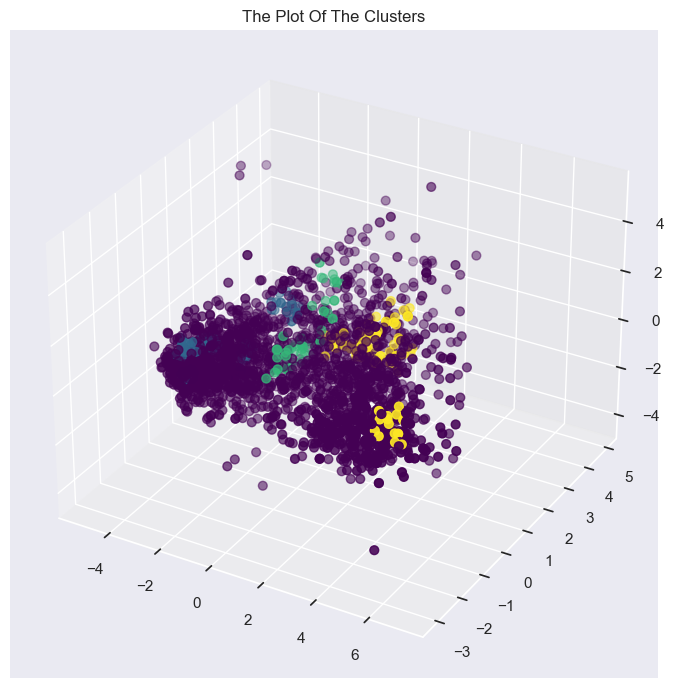

In [1343]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_df["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()

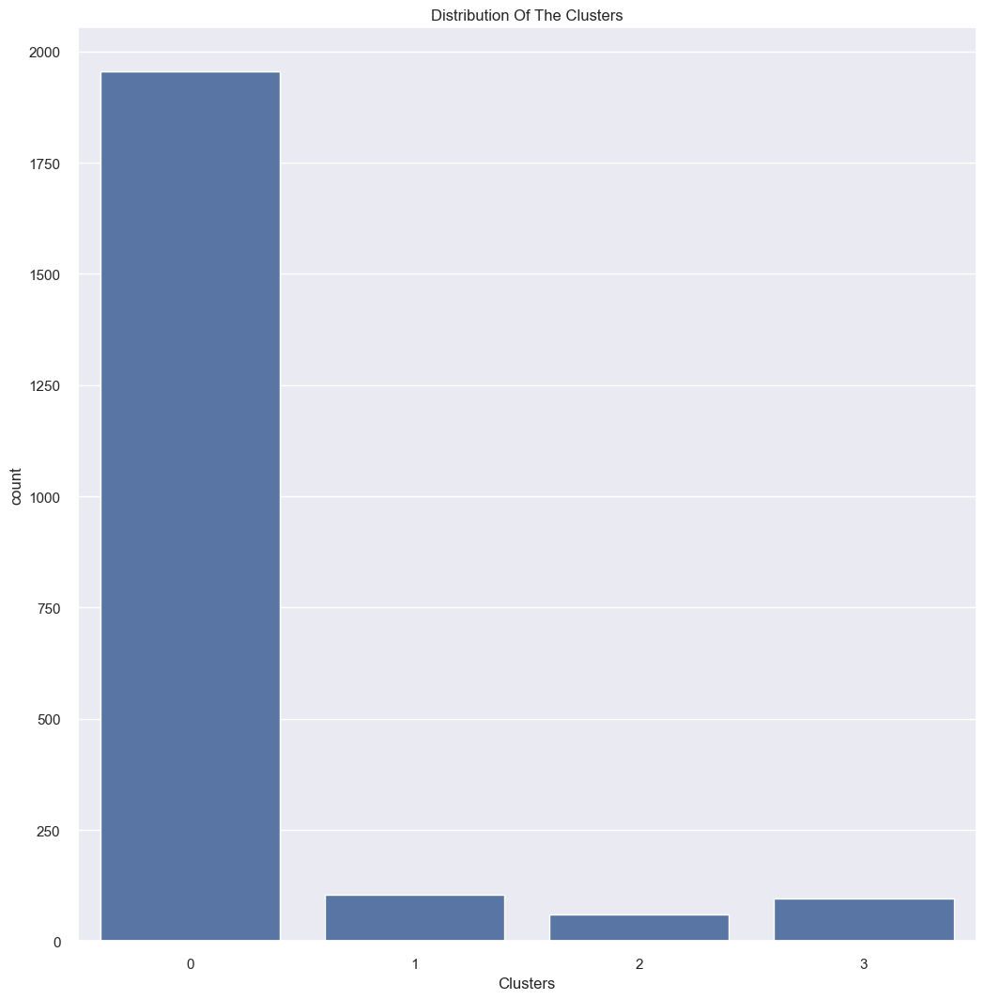

In [1344]:
#Plotting countplot of clusters
pl = sns.countplot(x=df["Clusters"])
pl.set_title("Distribution Of The Clusters")
plt.show()

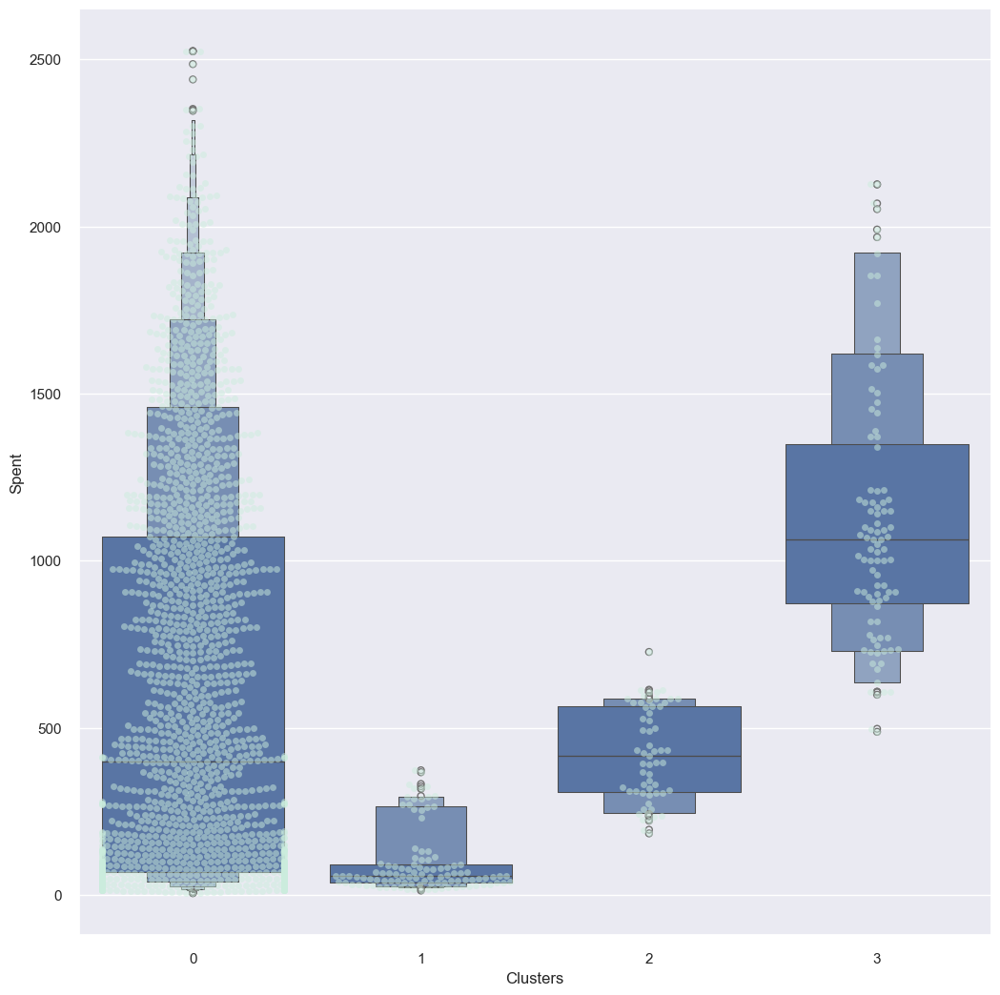

In [1345]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["Spent"])
plt.show()

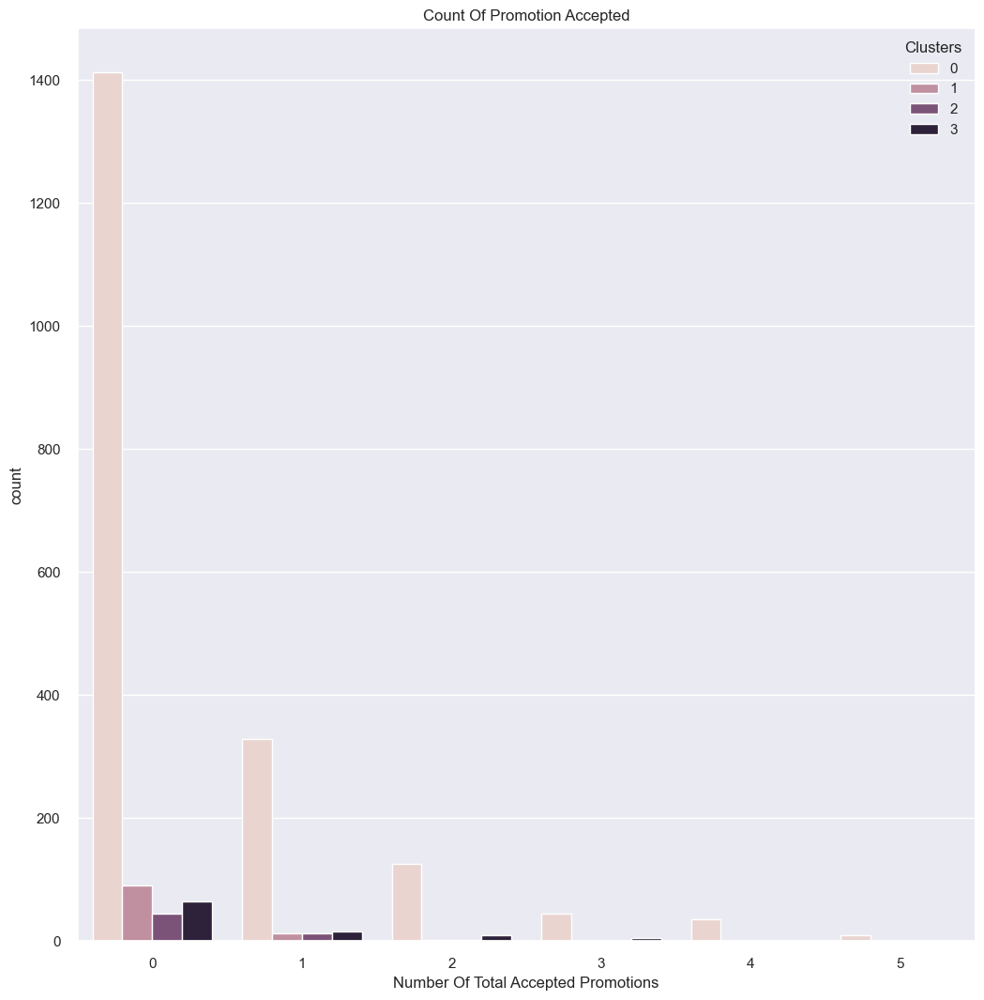

In [1346]:
#Creating a feature to get a sum of accepted promotions 
#Plotting count of total campaign accepted.
plt.figure()
pl = sns.countplot(x=df["TotalAcceptedCmp"],hue=df["Clusters"])
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

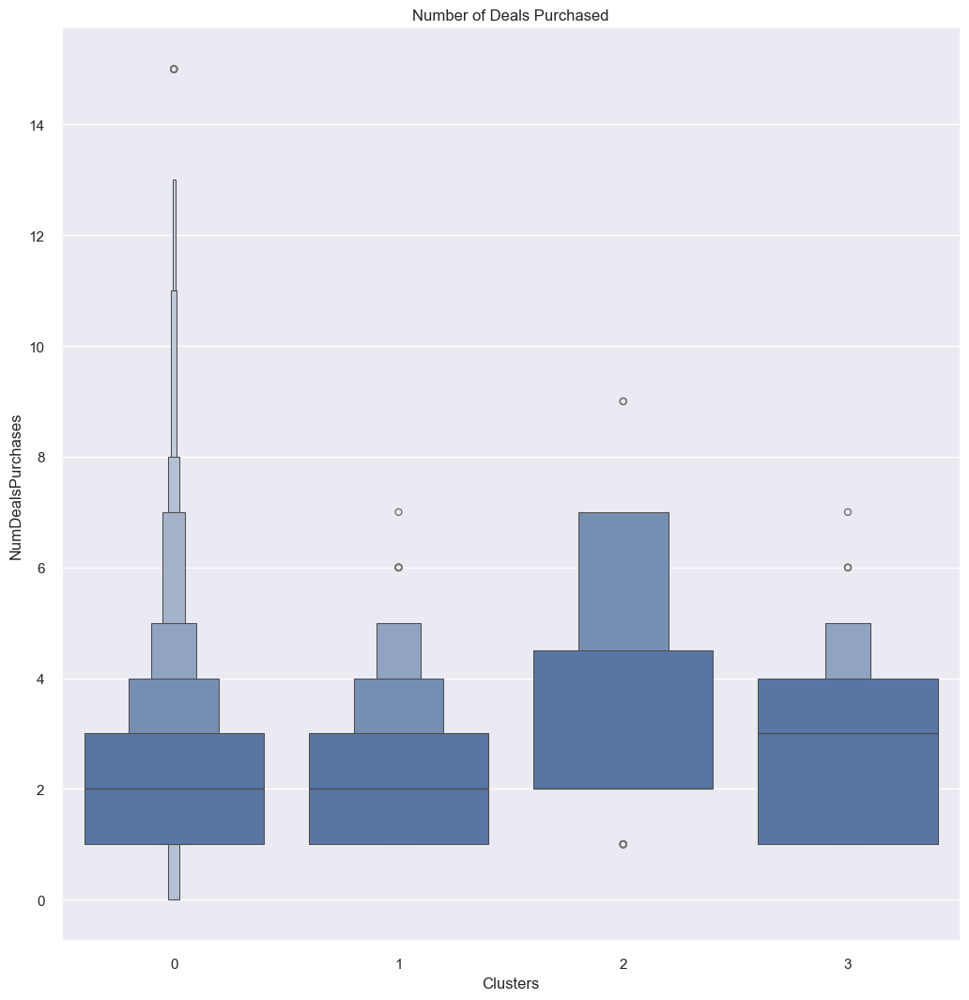

In [1347]:
#Plotting the number of deals purchased
plt.figure()
pl=sns.boxenplot(y=df["NumDealsPurchases"],x=df["Clusters"])
pl.set_title("Number of Deals Purchased")
plt.show()

In [1348]:
df

,Age,Education,Marital_Status,Income,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Spent,TotalAcceptedCmp,Children,Family_Size,Is_Parents,Clusters
0,59,2,0,58138.0,58,3,8,10,4,7,0,1617,1,0,1,0,0
1,62,2,0,46344.0,38,2,1,1,2,5,0,27,0,2,3,1,0
2,51,2,1,71613.0,26,1,8,2,10,4,0,776,0,0,2,0,0
3,32,2,1,26646.0,26,2,2,0,4,6,0,53,0,1,3,1,0
4,35,4,1,58293.0,94,5,5,3,6,5,0,422,0,1,3,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,49,2,1,61223.0,46,2,9,3,4,5,0,1341,0,1,3,1,3
2236,70,4,1,64014.0,56,7,8,2,5,7,0,444,1,3,5,1,0
2237,35,2,0,56981.0,91,1,2,3,13,6,0,1241,1,0,1,0,0
2238,60,3,1,69245.0,8,2,6,5,10,3,0,843,0,1,3,1,0


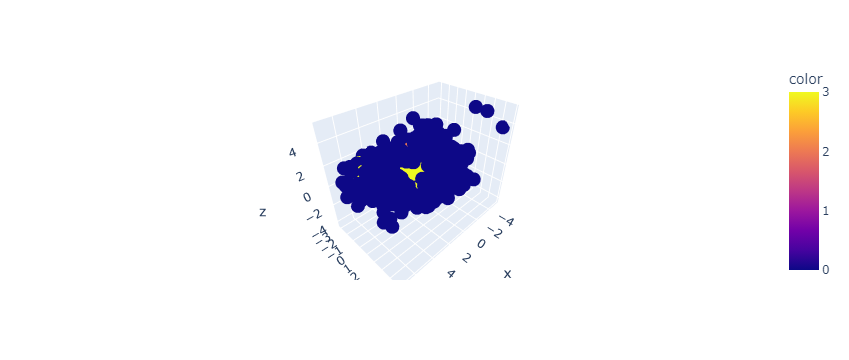

In [1522]:

fig = px.scatter_3d(df, x, y, z, color=GP_df)
fig.show()

In [ ]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_df["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()